# Problem statement : 
1. Suggest a suitable portfolio that meets clients expectations. 
2. Create a model for stock price prediction.

### Reading data into Python¶

In [1]:
# Import all the necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from datetime import datetime as dt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the csv files into dataframe
aal = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/AAL.csv')
aapl = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/AAPL.csv')
alk = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/ALK.csv')
amzn = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/AMZN.csv')
bhc = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/BHC.csv')
cs = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/CS.csv')
db = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/DB.csv')
goog = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/GOOG.csv')
gs = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/GS.csv')
ha = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/HA.csv')
jnj = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/JNJ.csv')
mrk = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/MRK.csv')
snp = pd.read_csv('C:/00 Project/Stock Analysis/Individual stocks/S&P500.csv')

In [3]:
# Create a dictionary to store all the DataFrames
stock_data = {
    'AAL': aal,
    'AAPL': aapl,
    'ALK': alk,
    'AMZN': amzn,
    'BHC': bhc,
    'CS': cs,
    'DB': db,
    'GOOG': goog,
    'GS': gs,
    'HA': ha,
    'JNJ': jnj,
    'MRK': mrk,
    'SP500' : snp
}

In [4]:
# Check the shape of all the files

for stock_name, stock_df in stock_data.items():
    print(f'{stock_name} : Shape : {stock_df.shape} ')    

AAL : Shape : (2517, 7) 
AAPL : Shape : (2517, 7) 
ALK : Shape : (2524, 7) 
AMZN : Shape : (2524, 7) 
BHC : Shape : (2525, 7) 
CS : Shape : (2712, 7) 
DB : Shape : (2712, 7) 
GOOG : Shape : (2524, 7) 
GS : Shape : (2712, 7) 
HA : Shape : (2524, 7) 
JNJ : Shape : (2525, 7) 
MRK : Shape : (2525, 7) 
SP500 : Shape : (2542, 7) 


#### Observation : The column numbers are same in all files. The row count is different.

In [5]:
# Check the columns all the files

for stock_name, stock_df in stock_data.items():
    
    print(stock_name)
    print(stock_df.head(2))  
    print("=" * 25)

AAL
         Date  Open  High   Low  Close  Adj Close   Volume
0  01-10-2010  9.29  9.39  9.21   9.29   8.758067  3603800
1  04-10-2010  9.24  9.48  9.05   9.12   8.597802  3856800
AAPL
         Date       Open       High        Low      Close  Adj Close  \
0  01-10-2010  10.219643  10.235000  10.048214  10.090000   8.719163   
1  04-10-2010  10.057143  10.103572   9.920357   9.951428   8.599421   

      Volume  
0  448142800  
1  435302000  
ALK
         Date     Open     High      Low    Close  Adj Close     Volume
0  01-10-2010  12.9325  12.9625  12.3675  12.4475  10.972344  1663600.0
1  04-10-2010  12.4300  12.5900  11.9975  12.1425  10.703489  1512400.0
AMZN
         Date        Open        High         Low       Close   Adj Close  \
0  01-10-2010  157.080002  157.440002  152.199997  153.710007  153.710007   
1  04-10-2010  153.949997  155.960007  152.789993  155.389999  155.389999   

      Volume  
0  8683400.0  
1  5346500.0  
BHC
         Date       Open       High    Low    

#### Observation : The column details are consistant across the dataframes.

In [6]:
# Check the column information for all dataframes.

for stock_name, stock_df in stock_data.items():
    print(stock_name)
    print(stock_df.info())
    print("=" * 50)

AAL
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2517 non-null   object 
 1   Open       2517 non-null   float64
 2   High       2517 non-null   float64
 3   Low        2517 non-null   float64
 4   Close      2517 non-null   float64
 5   Adj Close  2517 non-null   float64
 6   Volume     2517 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 137.8+ KB
None
AAPL
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2517 non-null   object 
 1   Open       2517 non-null   float64
 2   High       2517 non-null   float64
 3   Low        2517 non-null   float64
 4   Close      2517 non-null   float64
 5   Adj Close  2517 non-null   float64
 6   Volume     2517 non-null 

#### Observation : The date column to be converted to date format.

In [7]:
# Check the null values. 

for stock_name, stock_df in stock_data.items():
    print(stock_name)
    print(stock_df.isnull().sum())
    print("=" * 50)

AAL
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
AAPL
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
ALK
Date         7
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64
AMZN
Date         7
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64
BHC
Date         8
Open         8
High         8
Low          8
Close        8
Adj Close    8
Volume       8
dtype: int64
CS
Date         7
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64
DB
Date         7
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64
GOOG
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
GS
Date         7
Open 

#### Observation : There are null values. Drop all the null values because it is not advisable to impute data for null values for stock forecasting.

In [8]:
for stock_name, stock_df in stock_data.items():
    stock_df.dropna(inplace=True)

In [9]:
# Check to confirm that there are no null values. 

for stock_name, stock_df in stock_data.items():
    print(stock_name)
    print(stock_df.isnull().sum())
    print("=" * 50)

AAL
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
AAPL
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
ALK
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
AMZN
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
BHC
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
CS
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
DB
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
GOOG
Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
GS
Date         0
Open 

In [10]:
# Check the date column in all dataframes

for stock_name, stock_df in stock_data.items():
    print(f'Stock name: {stock_name} Date: {stock_df["Date"].min()} - {stock_df["Date"].max()}')  

Stock name: AAL Date: 01-02-2011 - 31-12-2019
Stock name: AAPL Date: 01-02-2011 - 31-12-2019
Stock name: ALK Date: 01-02-2011 - 31-12-2019
Stock name: AMZN Date: 01-02-2011 - 31-12-2019
Stock name: BHC Date: 01-02-2011 - 31-12-2019
Stock name: CS Date: 01-02-2010 - 31-12-2019
Stock name: DB Date: 01-02-2010 - 31-12-2019
Stock name: GOOG Date: 01-02-2011 - 31-12-2019
Stock name: GS Date: 01-02-2010 - 31-12-2019
Stock name: HA Date: 01-02-2011 - 31-12-2019
Stock name: JNJ Date: 01-02-2011 - 31-12-2019
Stock name: MRK Date: 01-02-2011 - 31-12-2019
Stock name: SP500 Date: 2010-10-01 - 2020-11-04


In [11]:
# Convert the Date column into Date datatype

file_name = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK']
for file in file_name:
    stock_data[file].loc[:, 'Date'] = pd.to_datetime(stock_data[file]['Date'], format='%d-%m-%Y')

stock_data['SP500']['Date'] = pd.to_datetime(stock_data['SP500']['Date'], format='%Y-%m-%d')

In [12]:
# Check if the date column datatype is changed in all the dataframes.

for stock_name, stock_df in stock_data.items():
    print(stock_name)
    print(stock_df.info())
    print("=" * 50)  

AAL
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2517 non-null   datetime64[ns]
 1   Open       2517 non-null   float64       
 2   High       2517 non-null   float64       
 3   Low        2517 non-null   float64       
 4   Close      2517 non-null   float64       
 5   Adj Close  2517 non-null   float64       
 6   Volume     2517 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 137.8 KB
None
AAPL
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2517 non-null   datetime64[ns]
 1   Open       2517 non-null   float64       
 2   High       2517 non-null   float64       
 3   Low        2517 non-null   float64      

In [13]:
for stock_name, stock_df in stock_data.items():
    print(stock_name)
    print(stock_df['Date'].dt.year.value_counts().sort_index())
    print(stock_df['Date'].dt.month.value_counts().sort_index())

AAL
2010     64
2011    252
2012    250
2013    252
2014    252
2015    252
2016    252
2017    251
2018    251
2019    252
2020    189
Name: Date, dtype: int64
1     204
2     192
3     217
4     207
5     213
6     213
7     212
8     222
9     203
10    220
11    205
12    209
Name: Date, dtype: int64
AAPL
2010     64
2011    252
2012    250
2013    252
2014    252
2015    252
2016    252
2017    251
2018    251
2019    252
2020    189
Name: Date, dtype: int64
1     204
2     192
3     217
4     207
5     213
6     213
7     212
8     222
9     203
10    220
11    205
12    209
Name: Date, dtype: int64
ALK
2010     64
2011    252
2012    250
2013    252
2014    252
2015    252
2016    252
2017    251
2018    251
2019    252
2020    189
Name: Date, dtype: int64
1     204
2     192
3     217
4     207
5     213
6     213
7     212
8     222
9     203
10    220
11    205
12    209
Name: Date, dtype: int64
AMZN
2010     64
2011    252
2012    250
2013    252
2014    252
2015    252
2016

##### The date format is same in all the files now.

In [14]:
# Check the timeframe of all the data frames.

for stock_name, stock_df in stock_data.items():
    print(f'{stock_name} Timeframe: {stock_df["Date"].min()} - {stock_df["Date"].max()} ')

AAL Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
AAPL Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
ALK Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
AMZN Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
BHC Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
CS Timeframe: 2010-01-04 00:00:00 - 2020-09-30 00:00:00 
DB Timeframe: 2010-01-04 00:00:00 - 2020-09-30 00:00:00 
GOOG Timeframe: 2010-10-01 00:00:00 - 2020-10-09 00:00:00 
GS Timeframe: 2010-01-04 00:00:00 - 2020-09-30 00:00:00 
HA Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
JNJ Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
MRK Timeframe: 2010-10-01 00:00:00 - 2020-09-30 00:00:00 
SP500 Timeframe: 2010-10-01 00:00:00 - 2020-11-04 00:00:00 


In [15]:
for stock_name, stock_df in stock_data.items():
    print(stock_df.head(2))

        Date  Open  High   Low  Close  Adj Close   Volume
0 2010-10-01  9.29  9.39  9.21   9.29   8.758067  3603800
1 2010-10-04  9.24  9.48  9.05   9.12   8.597802  3856800
        Date       Open       High        Low      Close  Adj Close     Volume
0 2010-10-01  10.219643  10.235000  10.048214  10.090000   8.719163  448142800
1 2010-10-04  10.057143  10.103572   9.920357   9.951428   8.599421  435302000
        Date     Open     High      Low    Close  Adj Close     Volume
0 2010-10-01  12.9325  12.9625  12.3675  12.4475  10.972344  1663600.0
1 2010-10-04  12.4300  12.5900  11.9975  12.1425  10.703489  1512400.0
        Date        Open        High         Low       Close   Adj Close  \
0 2010-10-01  157.080002  157.440002  152.199997  153.710007  153.710007   
1 2010-10-04  153.949997  155.960007  152.789993  155.389999  155.389999   

      Volume  
0  8683400.0  
1  5346500.0  
        Date       Open       High    Low      Close  Adj Close     Volume
0 2010-10-01  25.120001  25

In [16]:
# All dataframes to have Timeframe: 01-02-2011 - 31-12-2019

start_date = '2011-02-02'
end_date = '2019-12-31'

file_name = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK', 'SP500']
for file in file_name:
    stock_data[file] = stock_data[file][(stock_data[file]['Date'] >= start_date) & (stock_data[file]['Date'] <= end_date)]

In [17]:
# Check the timeframe of all the data frames.

for stock_name, stock_df in stock_data.items():
    print(f'{stock_name} Timeframe: {stock_df["Date"].min()} - {stock_df["Date"].max()} Shape: {stock_df.shape}')


AAL Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
AAPL Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
ALK Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
AMZN Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
BHC Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
CS Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
DB Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
GOOG Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
GS Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
HA Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
JNJ Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
MRK Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)
SP500 Timeframe: 2011-02-02 00:00:00 - 2019-12-31 00:00:00 Shape: (2243, 7)


#### The date range is same in all files now.

In [18]:
# Set the date column as index in individual stock files.

for stock_name,stock_df in stock_data.items():
    stock_df.set_index('Date', inplace=True)
    #print(stock_df.head(2))
    print(stock_df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2243 entries, 2011-02-02 to 2019-12-31
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2243 non-null   float64
 1   High       2243 non-null   float64
 2   Low        2243 non-null   float64
 3   Close      2243 non-null   float64
 4   Adj Close  2243 non-null   float64
 5   Volume     2243 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 122.7 KB
None
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2243 entries, 2011-02-02 to 2019-12-31
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2243 non-null   float64
 1   High       2243 non-null   float64
 2   Low        2243 non-null   float64
 3   Close      2243 non-null   float64
 4   Adj Close  2243 non-null   float64
 5   Volume     2243 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 122.7 KB
Non

## Exploratory data analysis

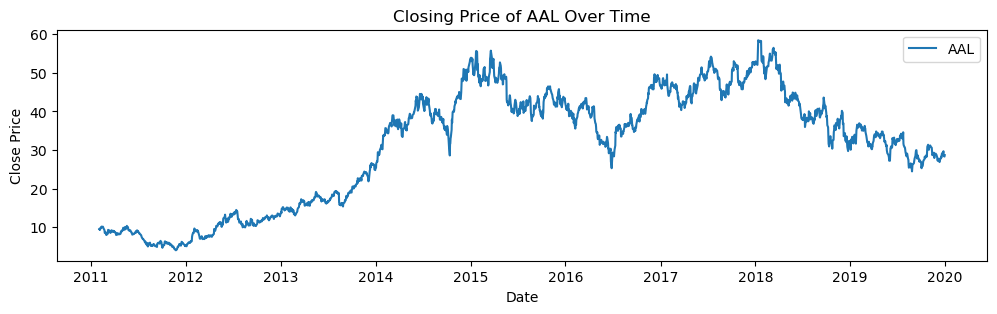

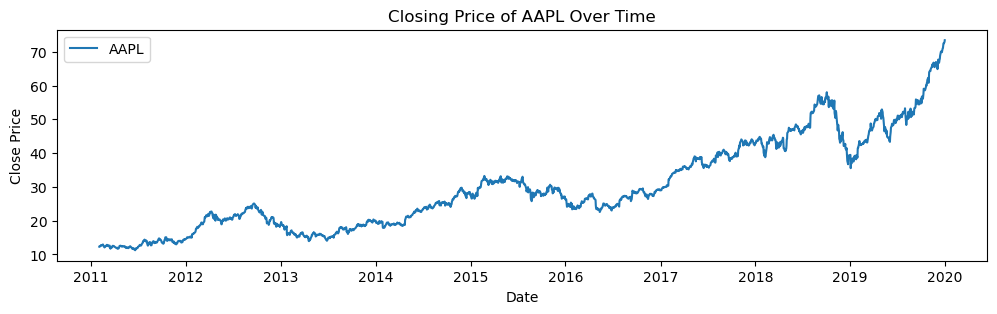

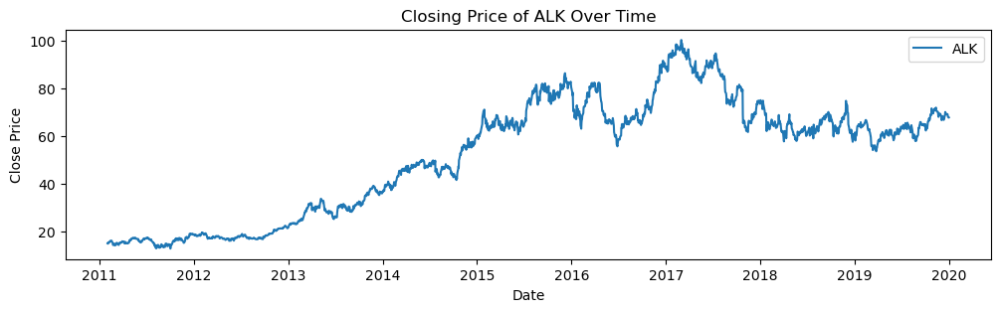

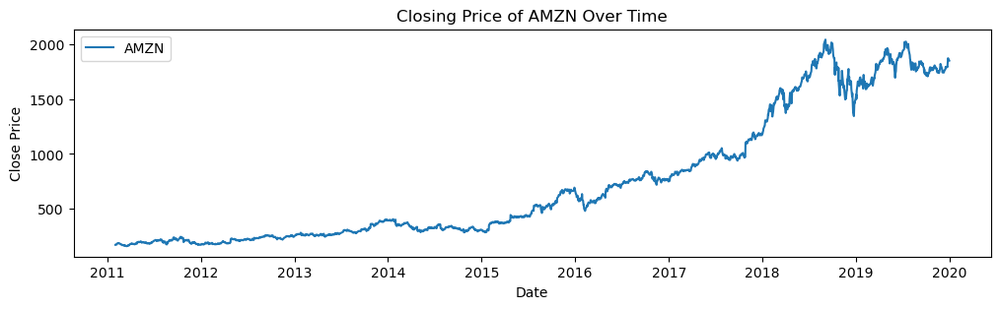

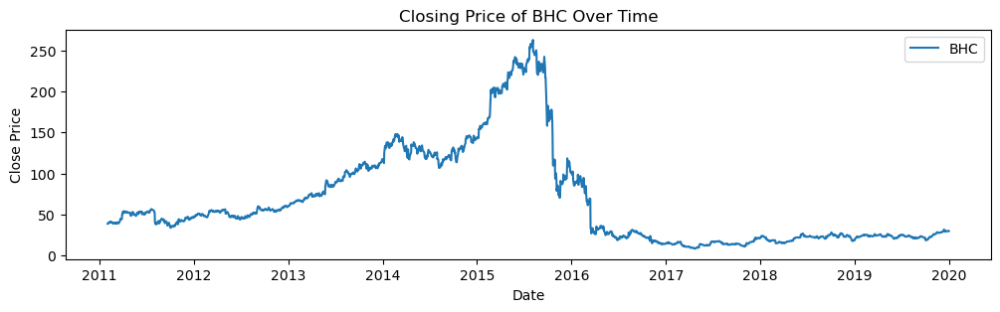

...

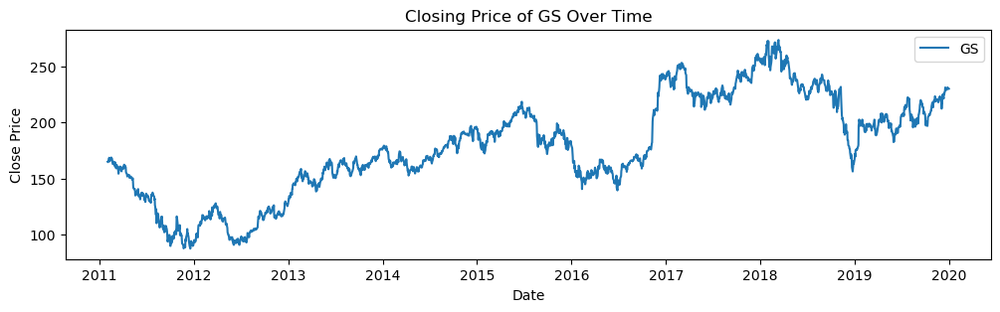

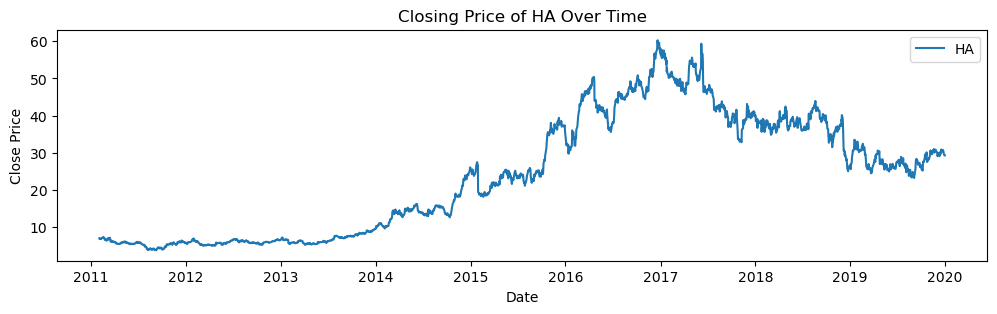

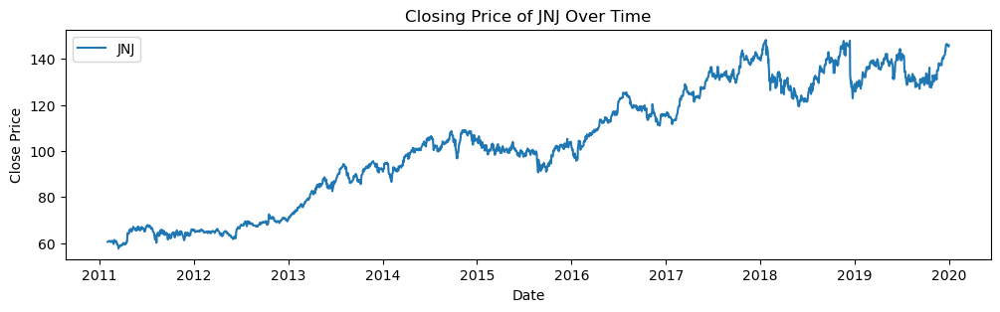

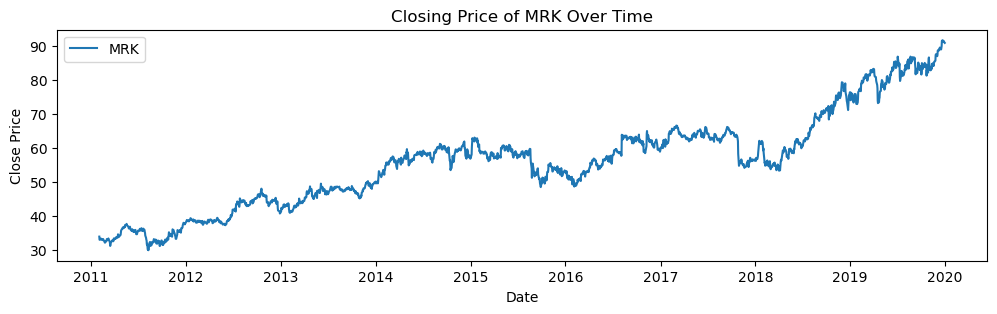

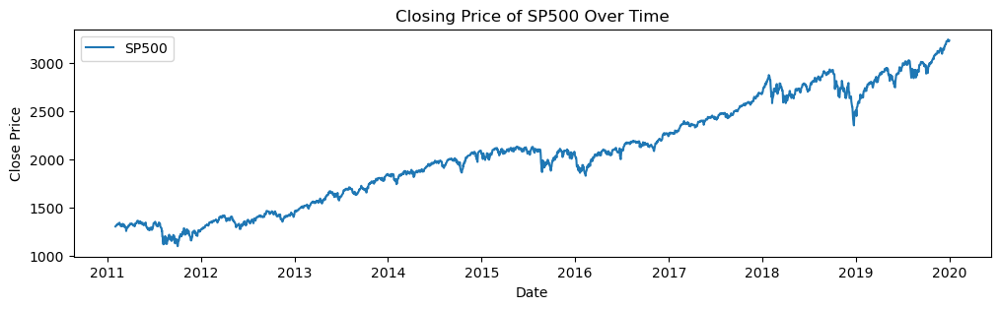

In [19]:
# Check the closing price trend

for stock_name, stock_df in stock_data.items():
    plt.figure(figsize=(12, 3))
    plt.plot(stock_df['Close'], label=stock_name)
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'Closing Price of {stock_name} Over Time')
    plt.legend()
    plt.show()

#### Observation: Stocks in uptrend
- AAPL (Apple Inc.)
- AMZN (Amazon.com Inc.)
- GOOG (Alphabet Inc. - Class C)
- MRK (Merck & Co. Inc.)

####  Observation: Stocks in downtrend
- AAL (American Airlines Group Inc.)
- ALK (Alaska Air Group Inc.)
- BHC (Bausch Health Companies Inc.)
- CS (Credit Suisse Group AG)
- DB (Deutsche Bank AG)
- HA (Hawaiian Holdings Inc.)

####  Observation: Stocks in sideways trend
- GS (Goldman Sachs Group Inc.)
- JNJ (Johnson & Johnson)

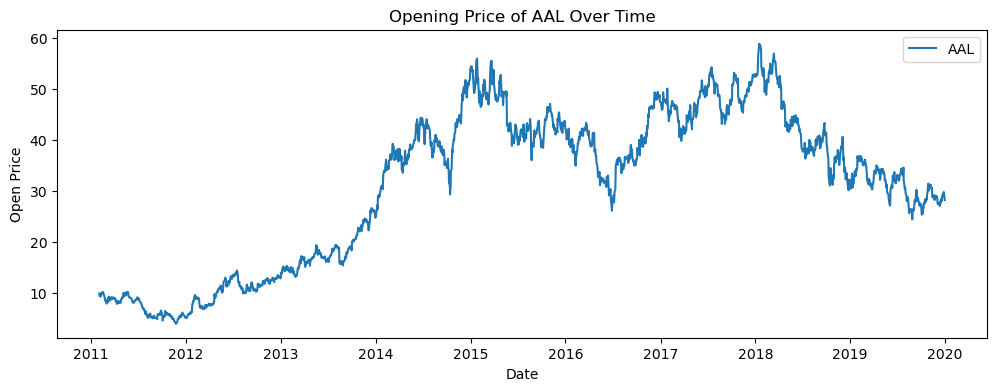

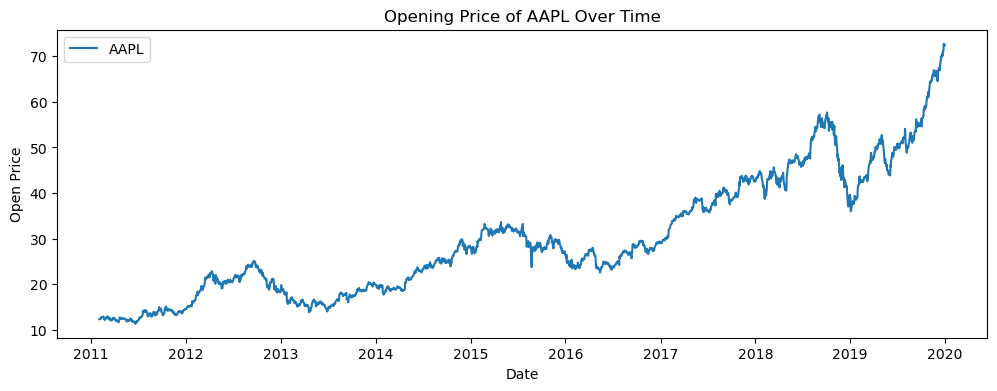

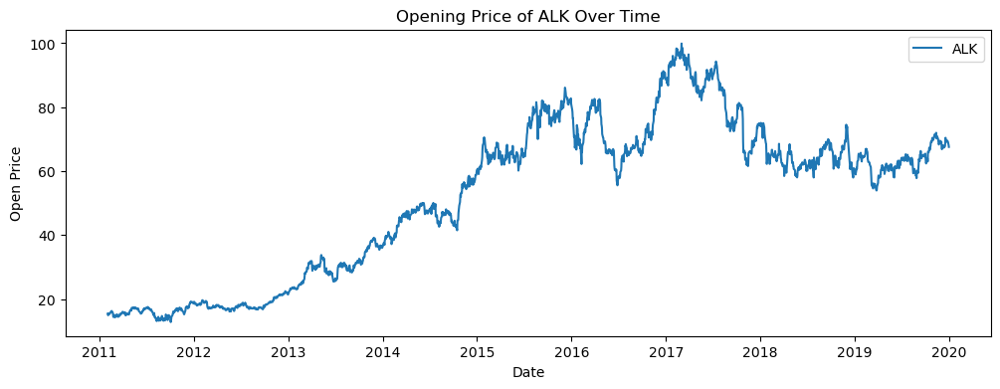

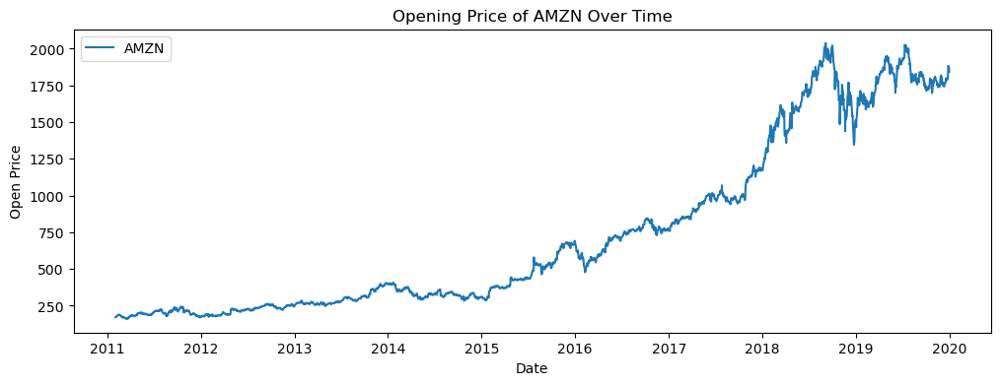

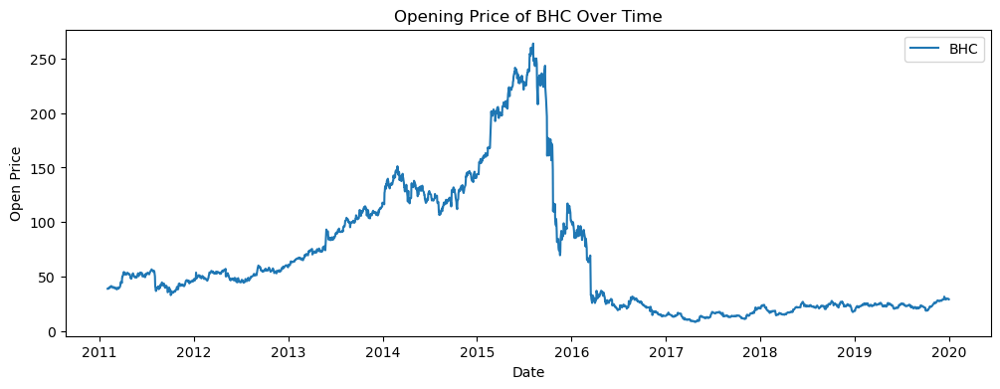

...

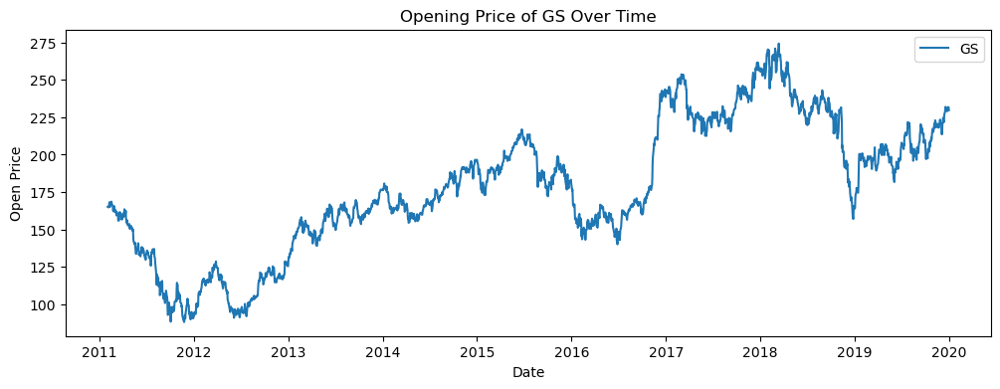

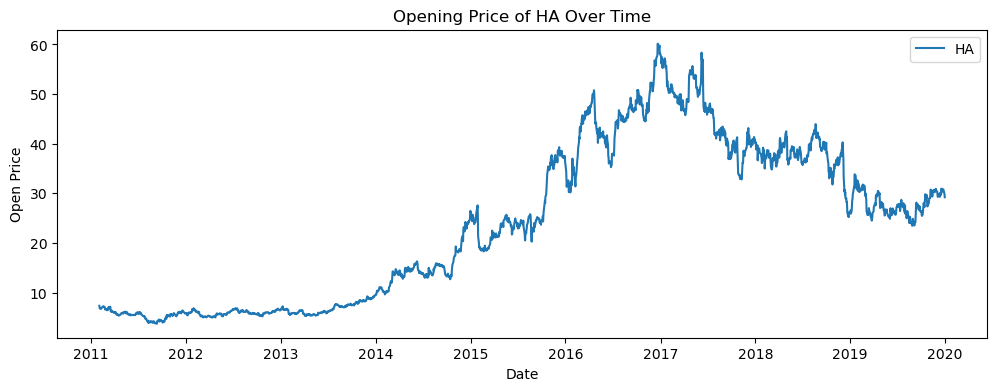

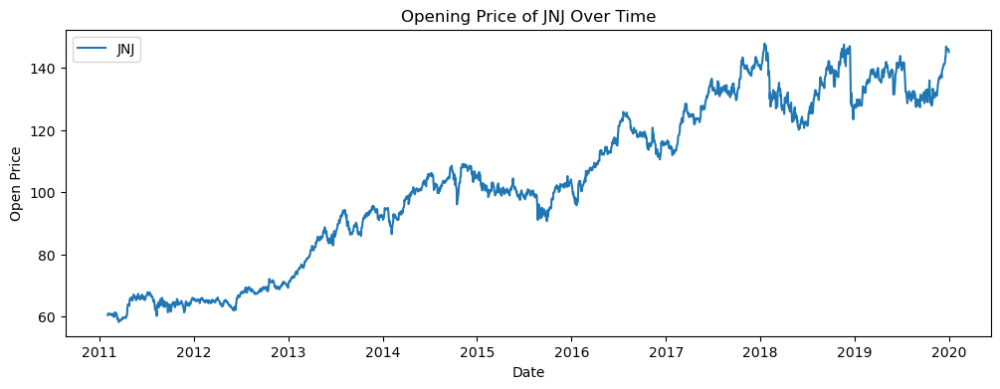

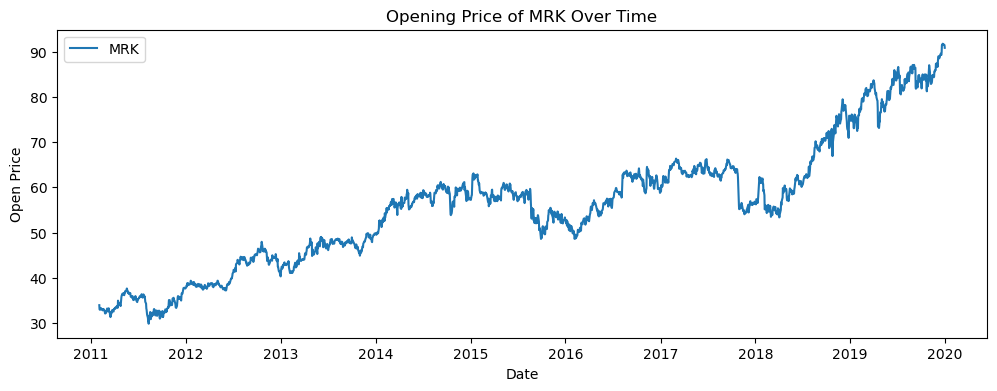

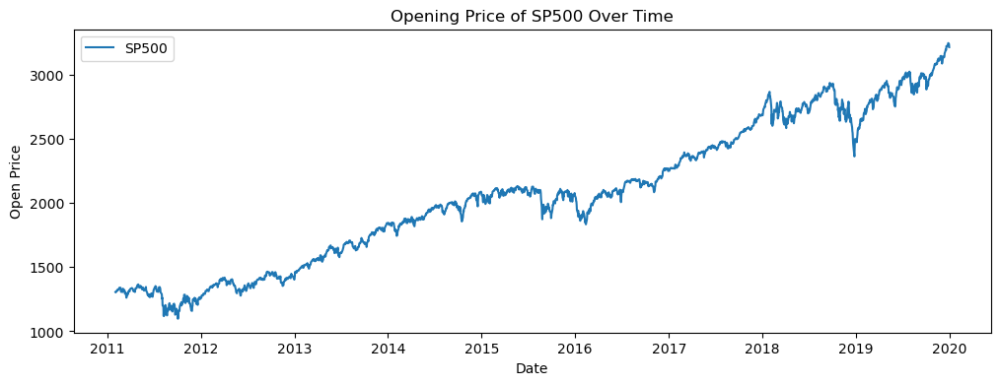

In [20]:
# Check the graph with opening price movements for all stocks.

for stock_name, stock_df in stock_data.items():
    plt.figure(figsize=(12, 4))
    plt.plot(stock_df['Open'], label=stock_name )
    plt.xlabel('Date')
    plt.ylabel('Open Price')
    plt.title(f'Opening Price of {stock_name} Over Time')
    plt.legend()
    plt.show()

### Simple moving average

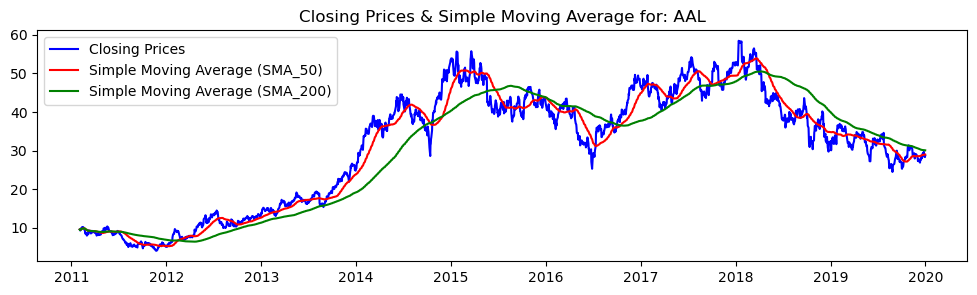

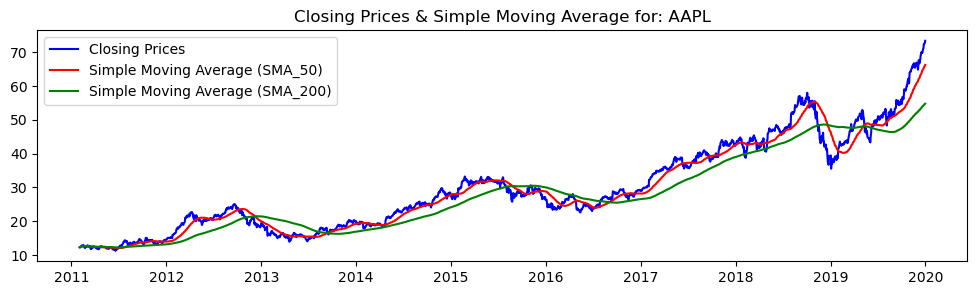

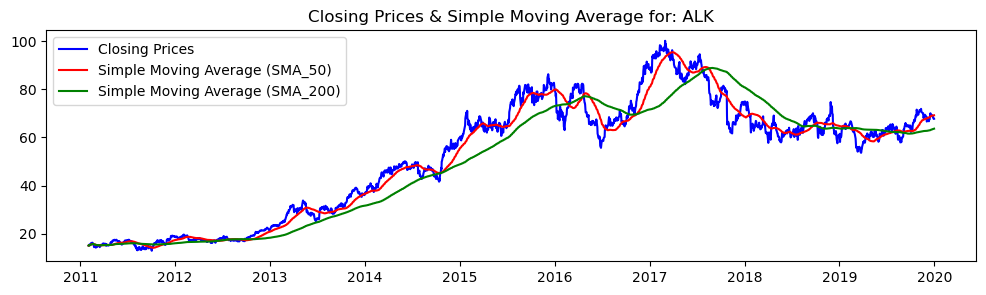

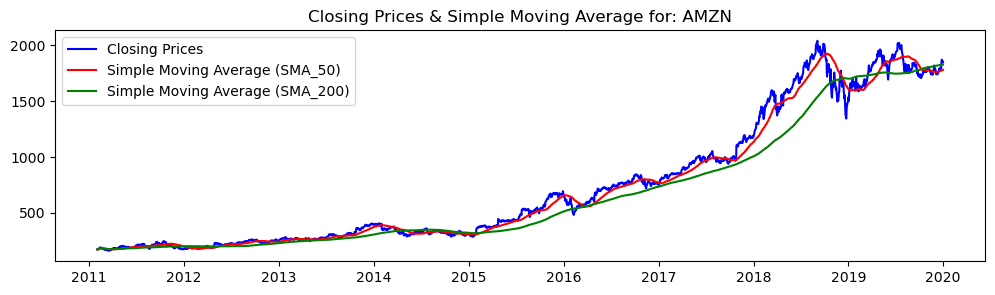

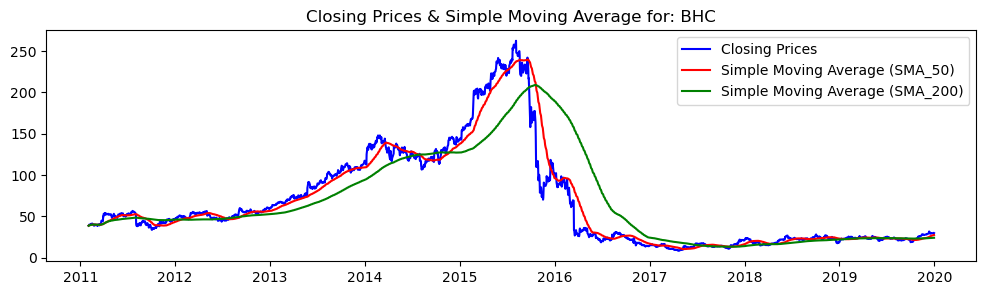

...

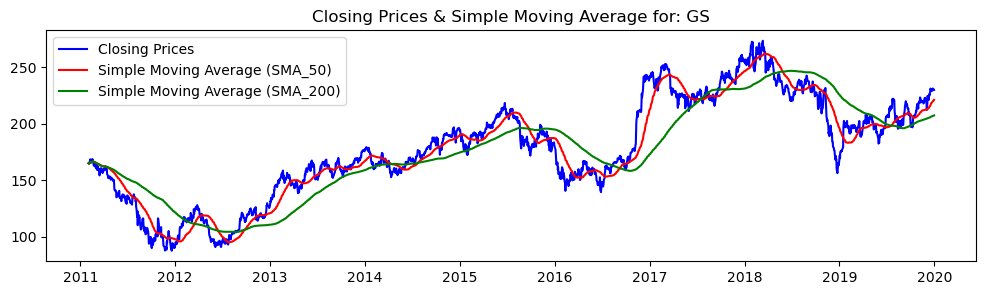

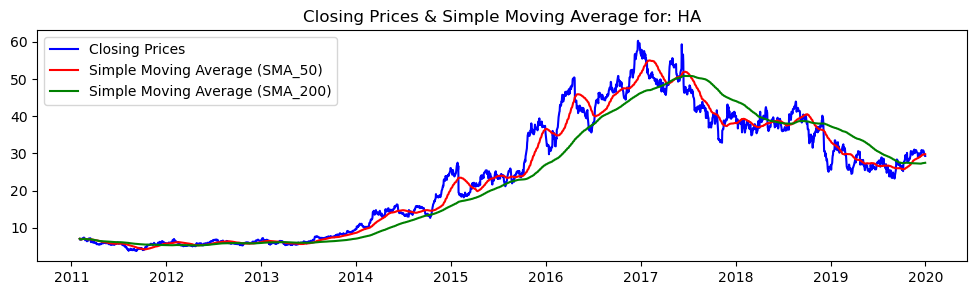

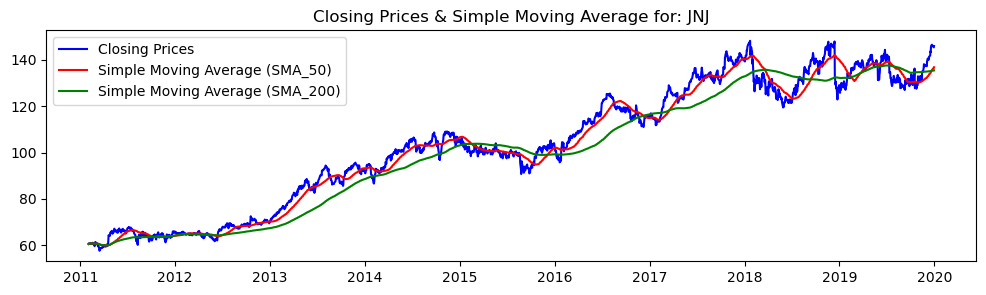

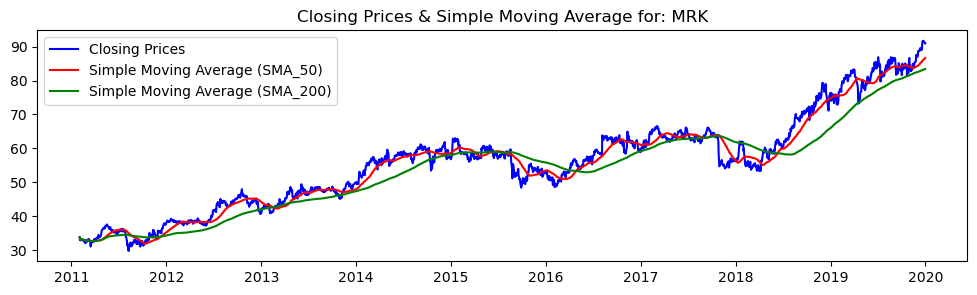

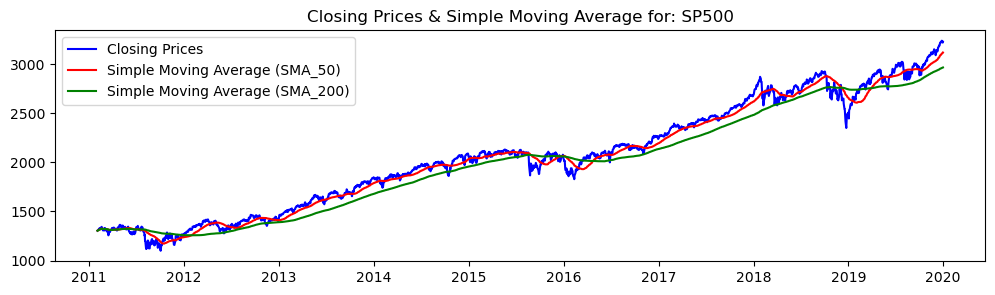

In [21]:
# Check the simple moving average, simple moving average for 50days and simple moving average for 200days

for stock_name, stock_df in stock_data.items():
    plt.figure(figsize=(12, 3))
    plt.title(f'Closing Prices & Simple Moving Average for: {stock_name}')
    
    stock_df['SMA_50'] = stock_df['Close'].rolling(window=50, min_periods=1).mean()
    stock_df['SMA_200'] = stock_df['Close'].rolling(window=200, min_periods=1).mean()
    
    plt.plot(stock_df['Close'], label='Closing Prices', color='blue')
    plt.plot(stock_df['SMA_50'], label='Simple Moving Average (SMA_50)', color='red')
    plt.plot(stock_df['SMA_200'], label='Simple Moving Average (SMA_200)', color='green')
    plt.legend()
    plt.show()

In [22]:
for stock_name, stock_df in stock_data.items():
    print(stock_df.isnull().sum())

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
SMA_50       0
SMA_200      0
dtype: int64
Open         0
High         0
Low          0
Close        0
Adj Close

#### Observation : Stock with uptrends and trading above the moving avearge are recommended for investment.

### Cumulative moving average

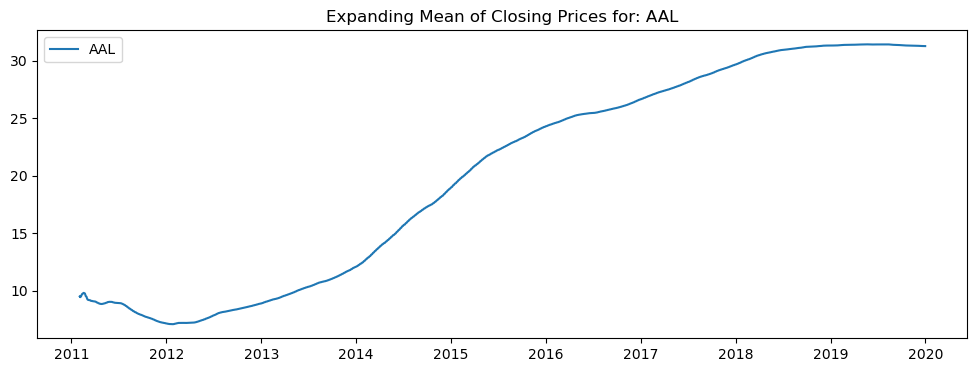

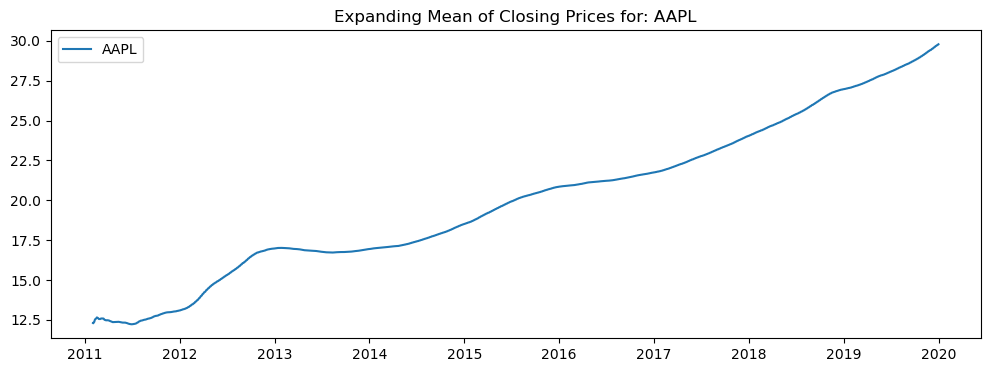

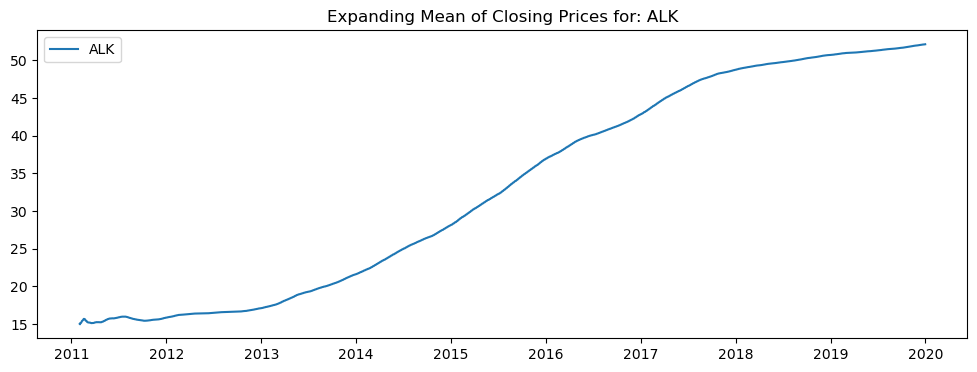

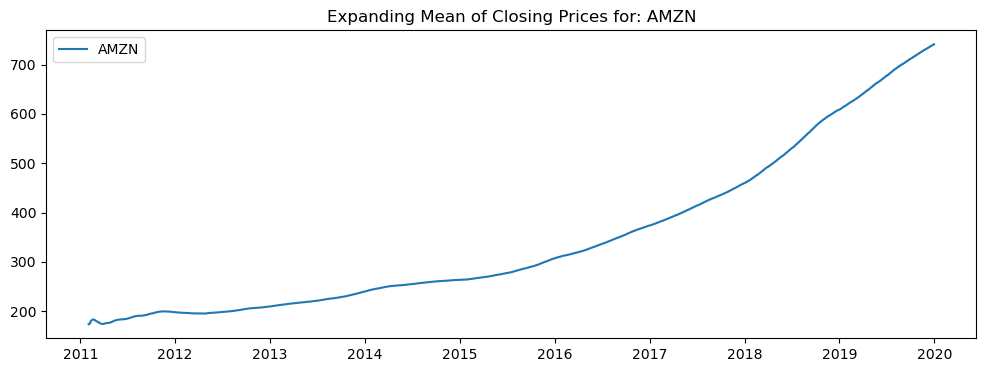

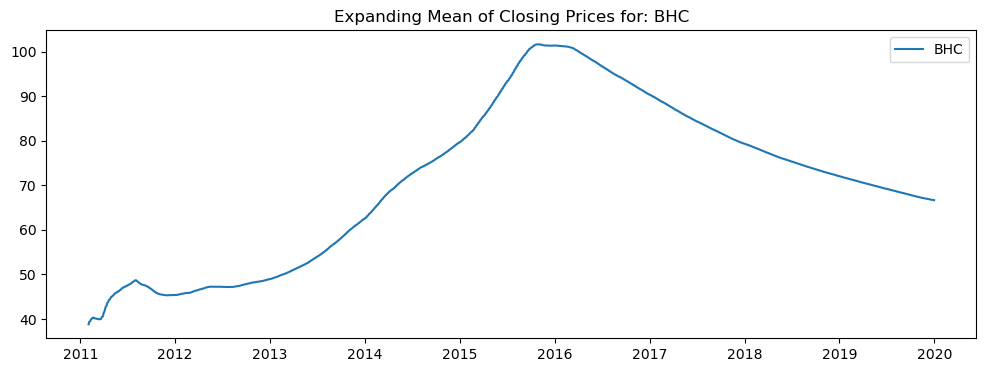

...

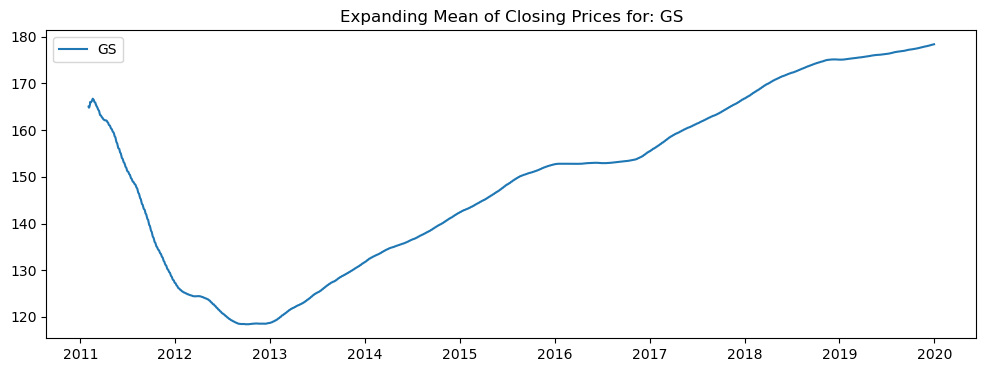

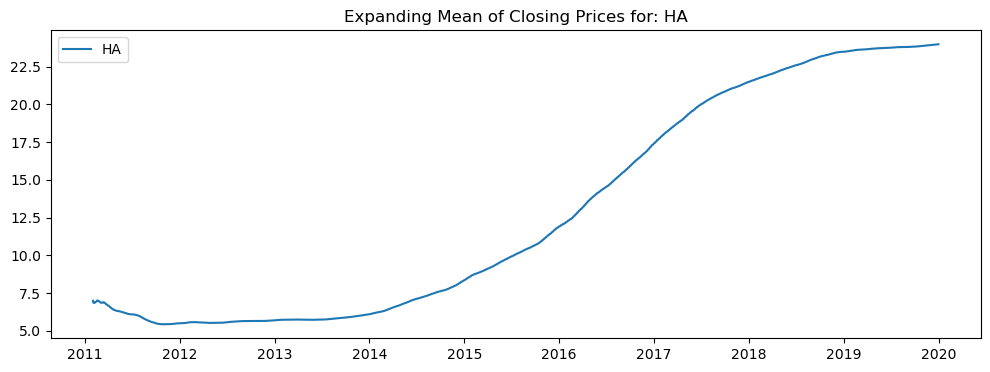

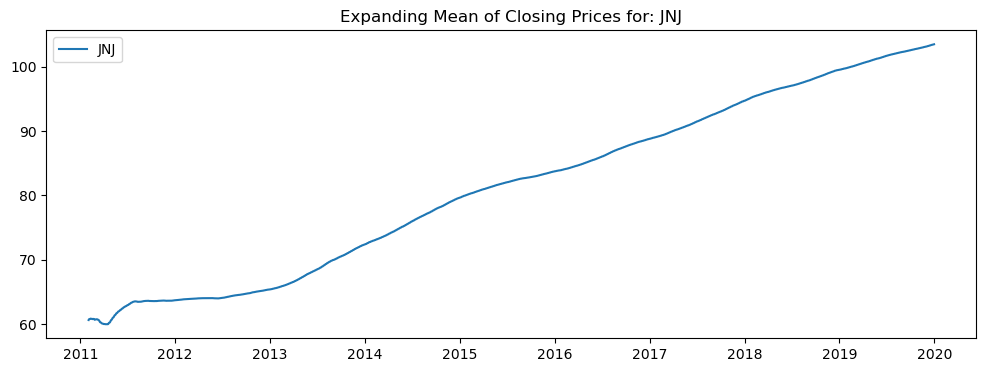

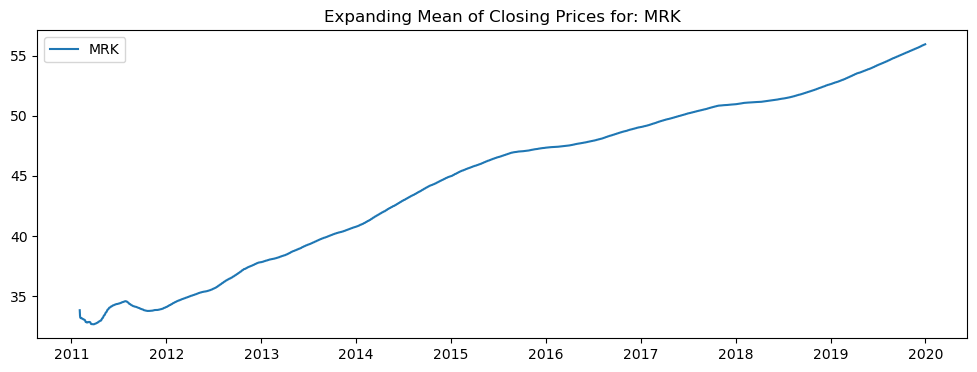

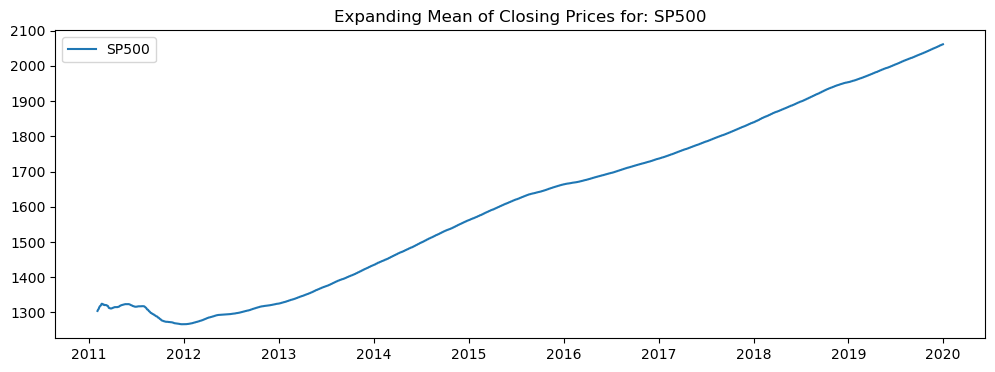

In [23]:
# Check the cumulative moving average of all stocks.

for stock_name, stock_df in stock_data.items():
    plt.figure(figsize=(12, 4))
    plt.plot(stock_df['Close'].expanding().mean(), label=stock_name )
    plt.title(f'Expanding Mean of Closing Prices for: {stock_name}')
    plt.legend()
    plt.show()

### Explonential moving average

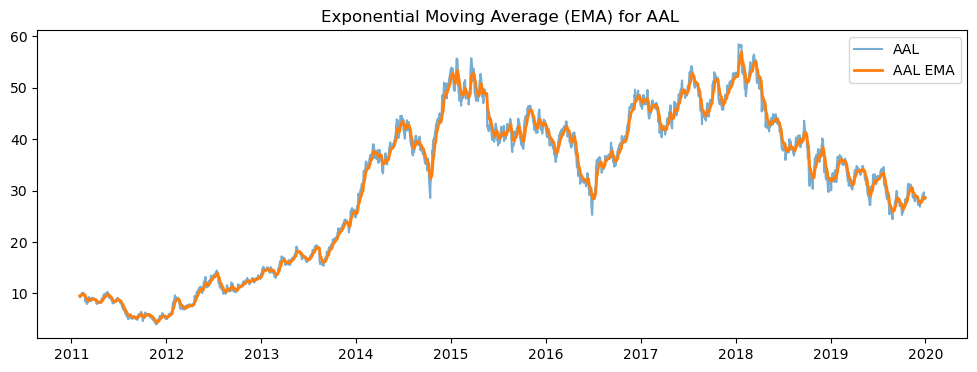

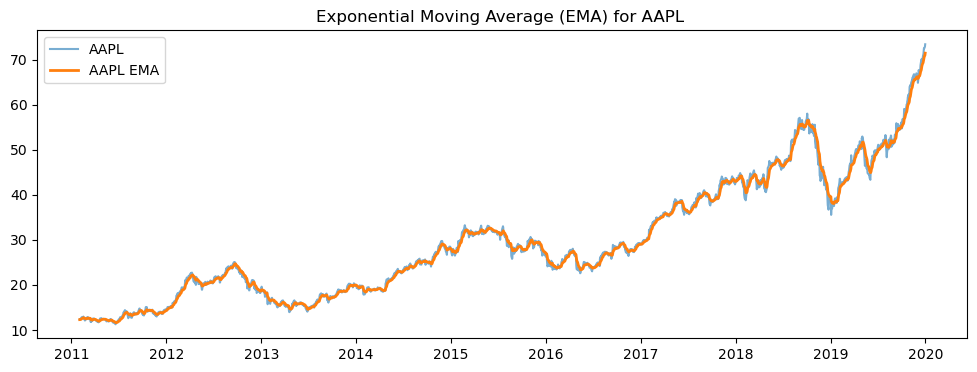

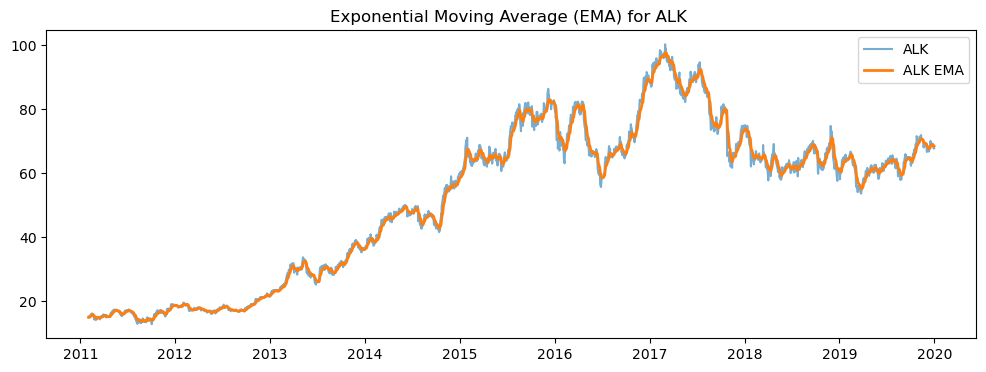

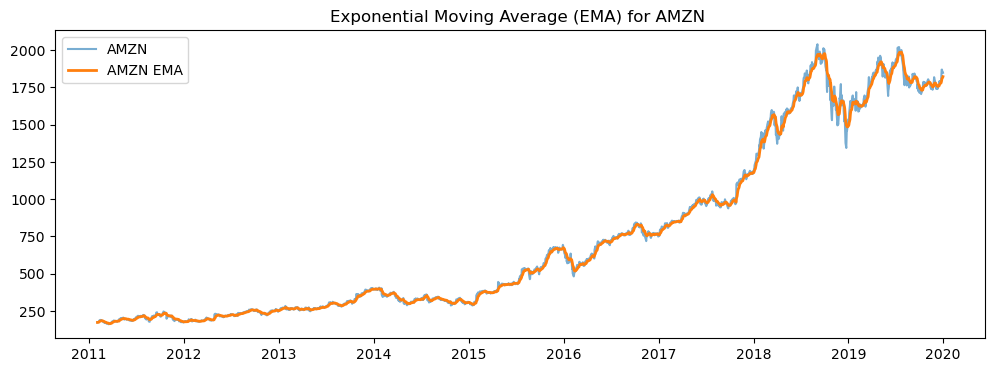

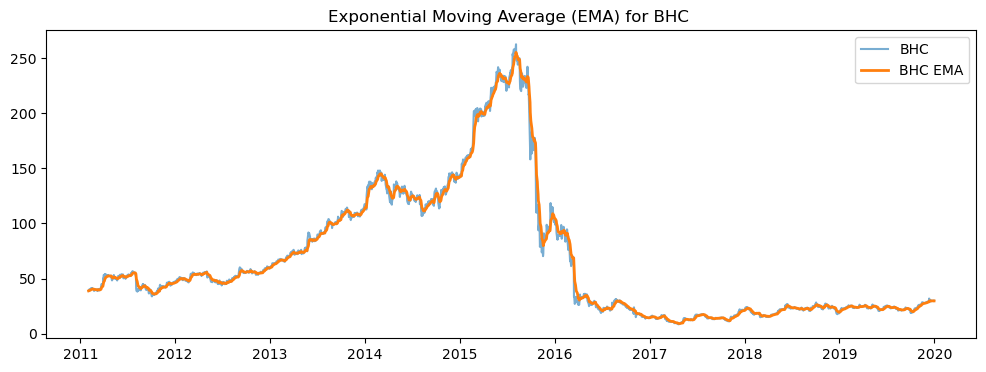

...

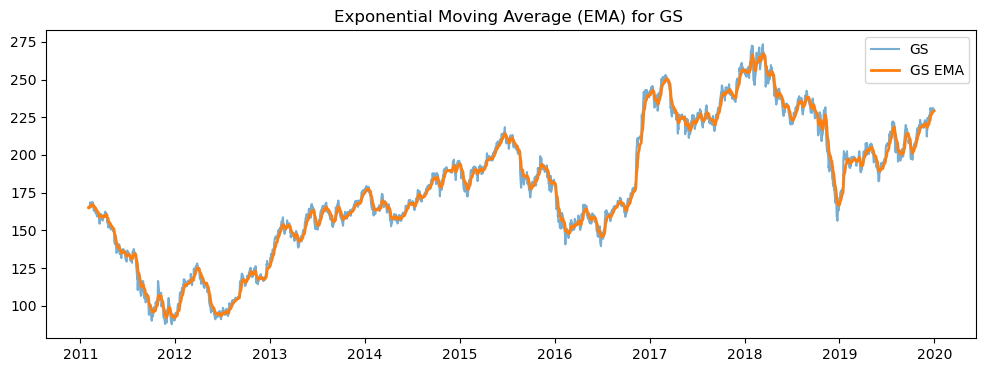

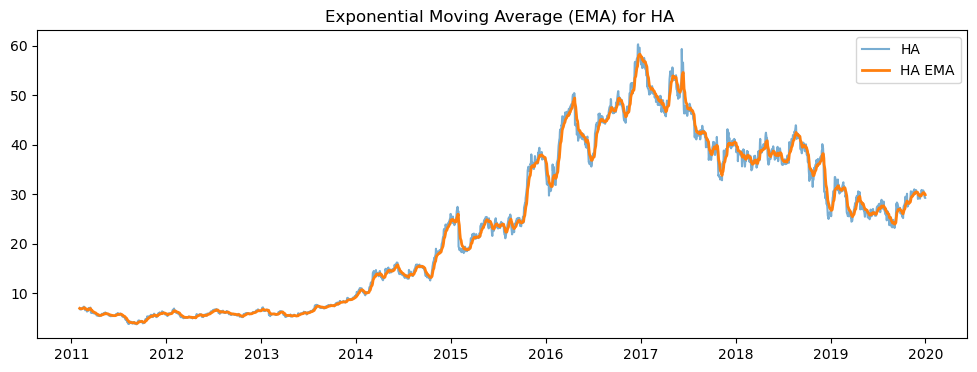

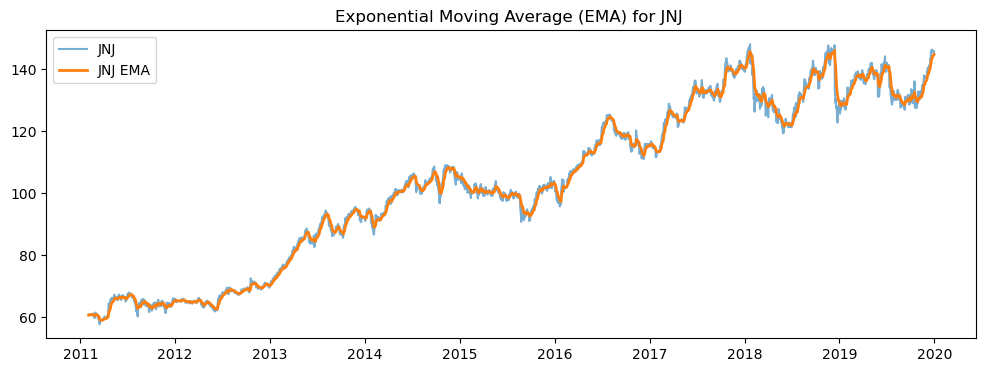

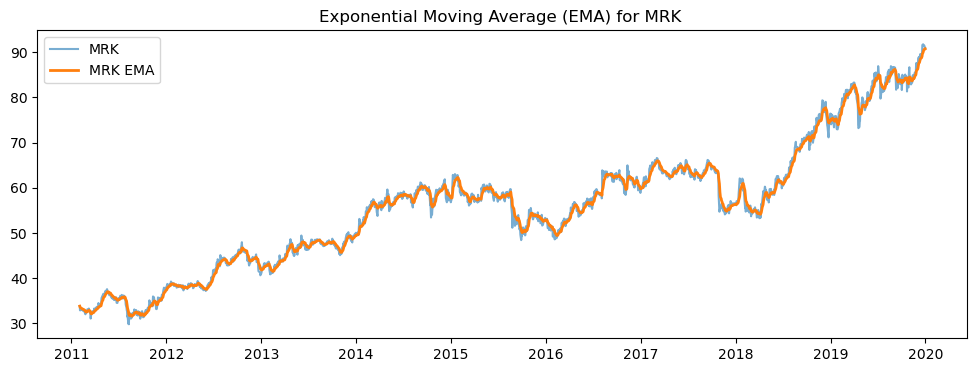

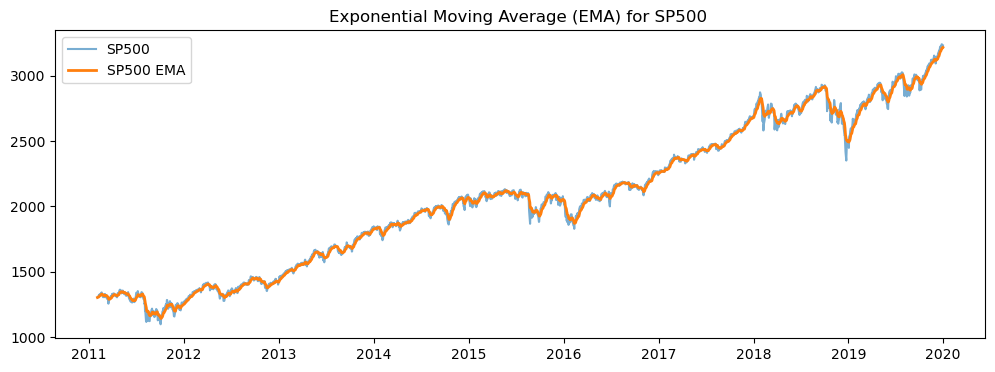

In [24]:
for stock_name, stock_df in stock_data.items():
    plt.figure(figsize=(12, 4))
    plt.title(f'Exponential Moving Average (EMA) for {stock_name} ')
    
    window_size = 10
    ema = stock_df['Close'].ewm(span=window_size, adjust=False).mean()
    
    plt.plot(stock_df['Close'], label=f'{stock_name}', alpha=0.6)
    plt.plot(ema, label=f'{stock_name} EMA', linewidth=2)
    plt.legend()
    plt.show()

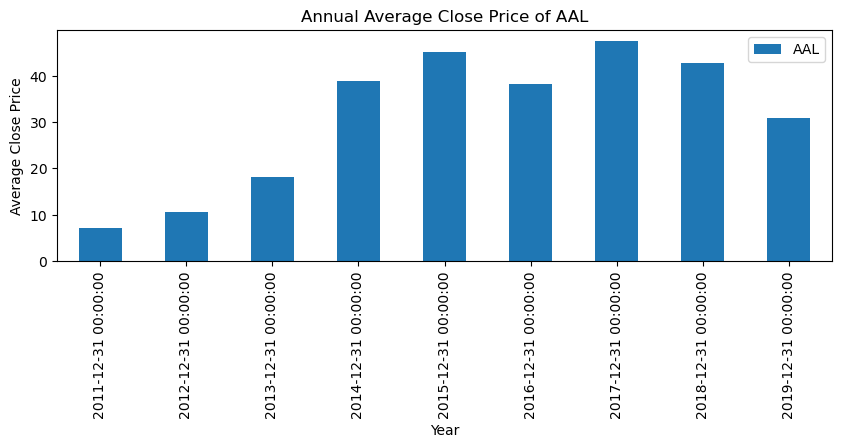

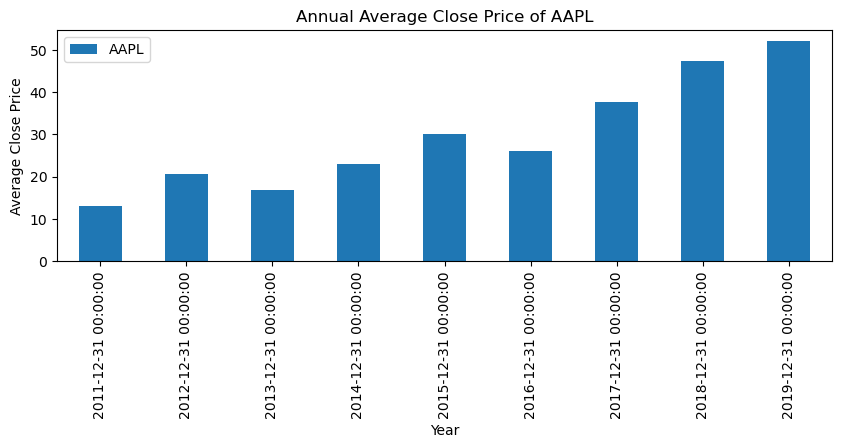

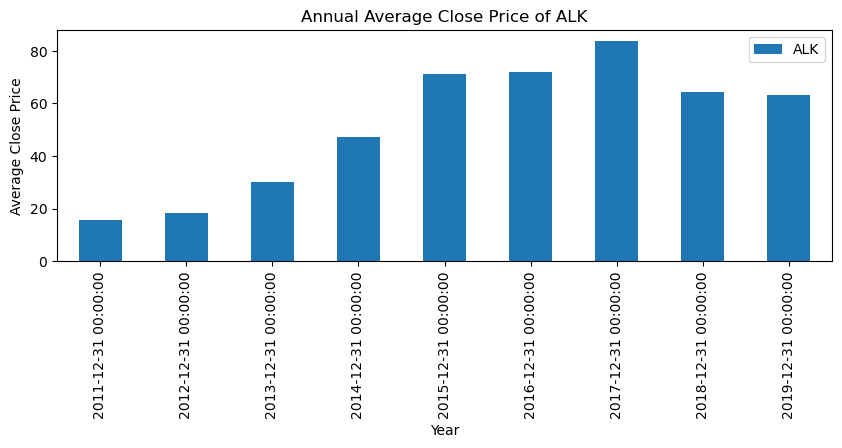

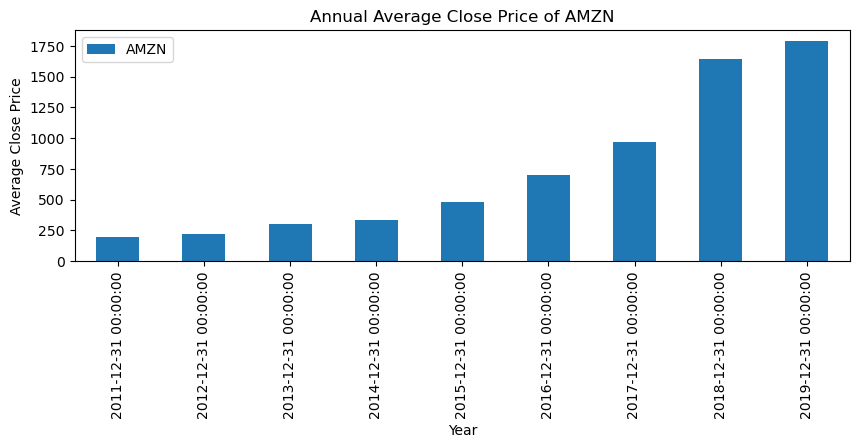

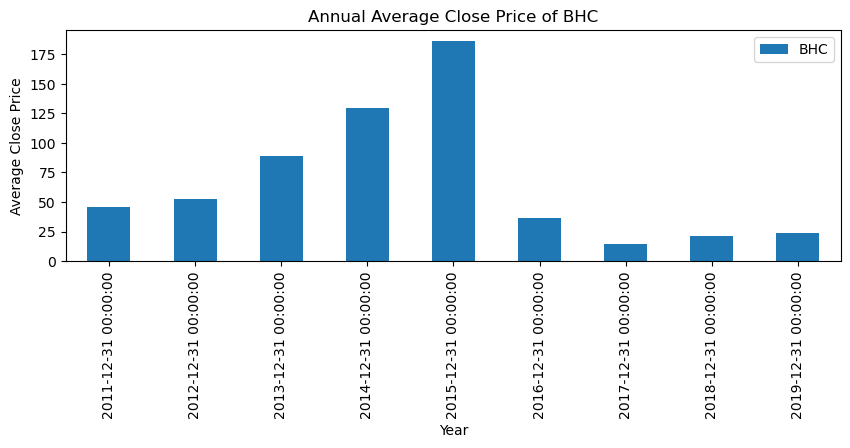

...

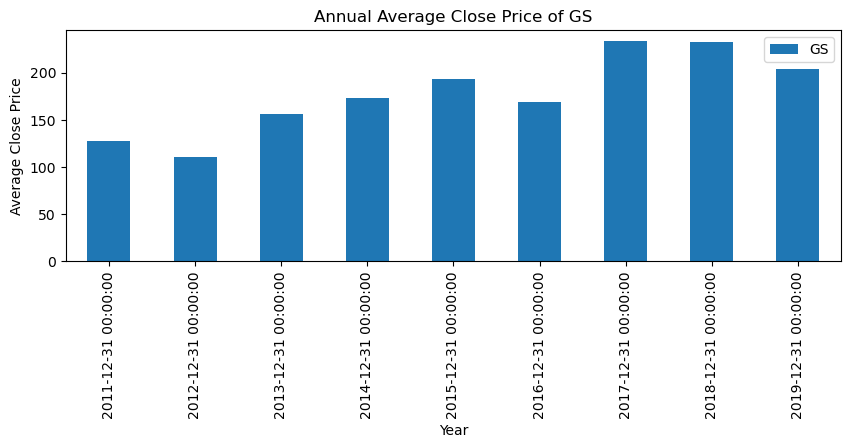

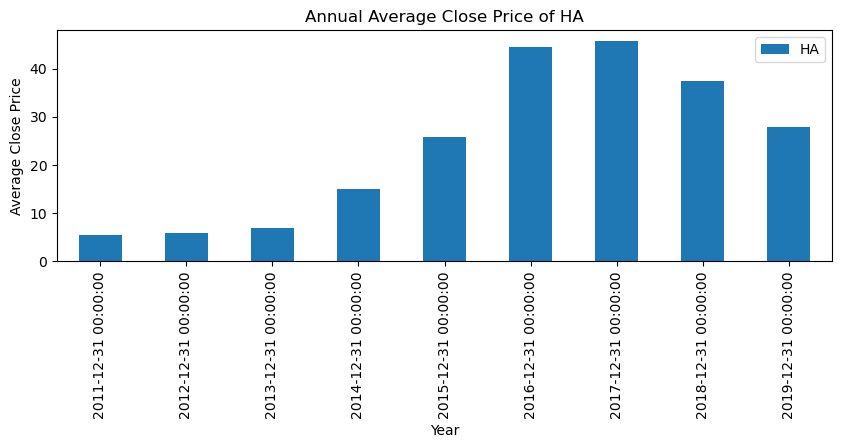

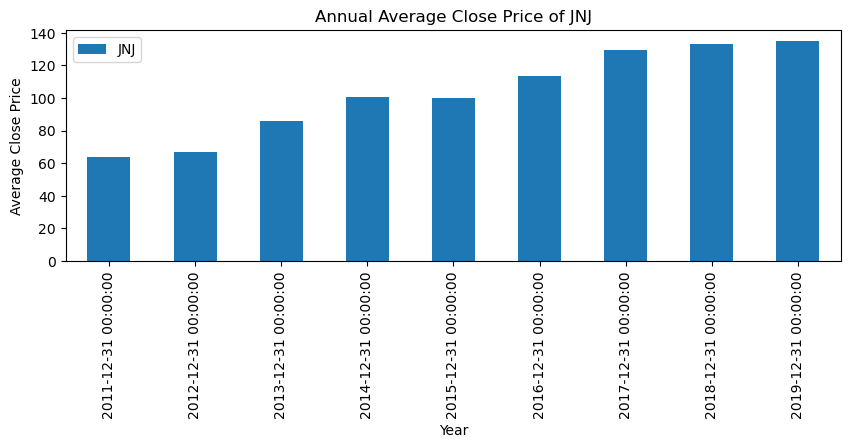

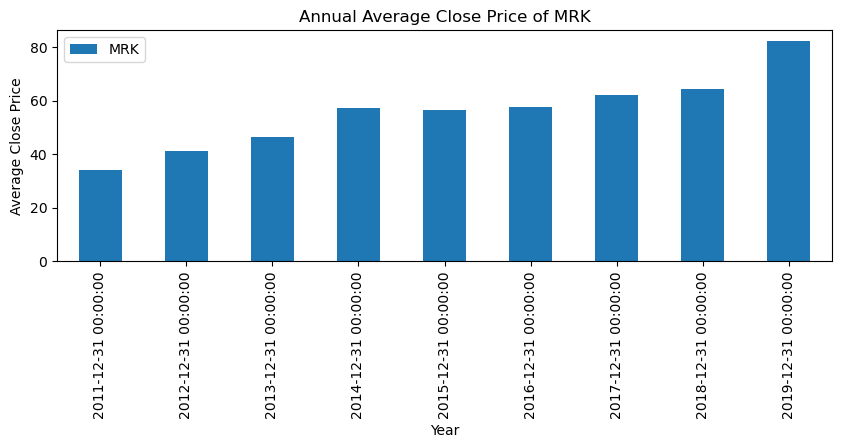

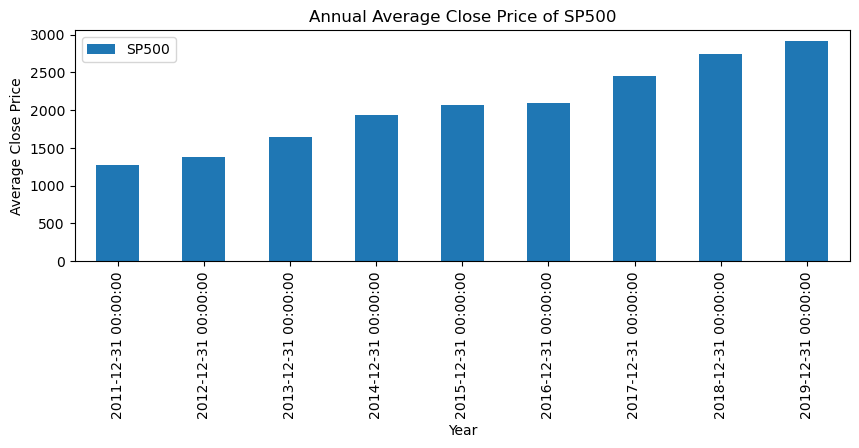

In [25]:
# Data visualization on yearly timeframe

for stock_name, stock_df in stock_data.items():
    plt.figure(figsize=(10, 3))
    plt.title(f'Yearly data for {stock_name} ')
 
    stock_df['Close'].resample('A').mean().plot(kind='bar', label=stock_name)
    plt.xlabel('Year')
    plt.ylabel('Average Close Price')
    plt.title(f'Annual Average Close Price of {stock_name}')
    plt.legend()
    plt.show()

### Calculate daily returns

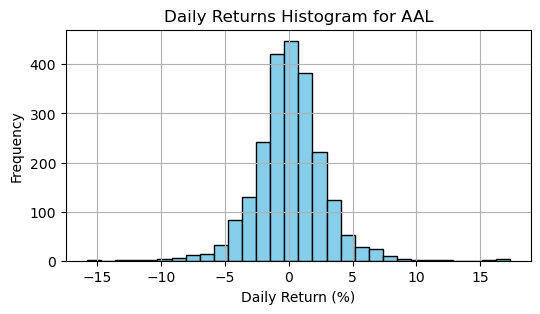

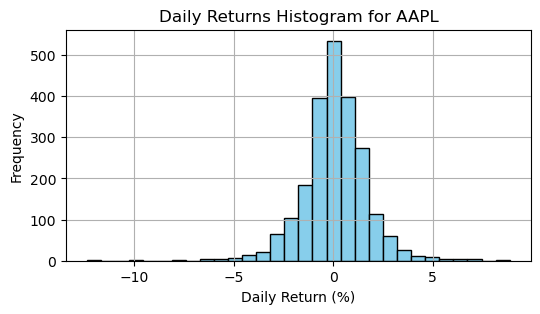

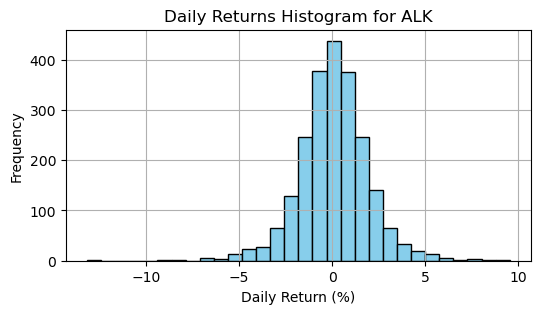

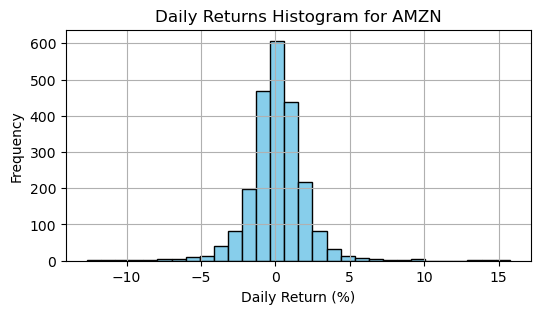

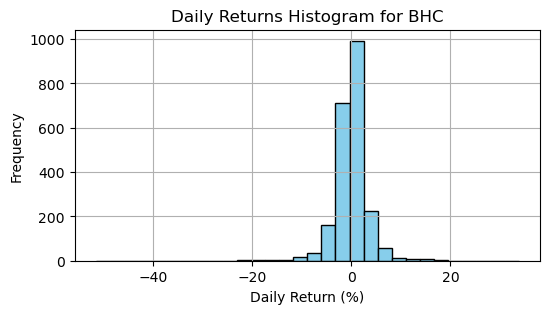

...

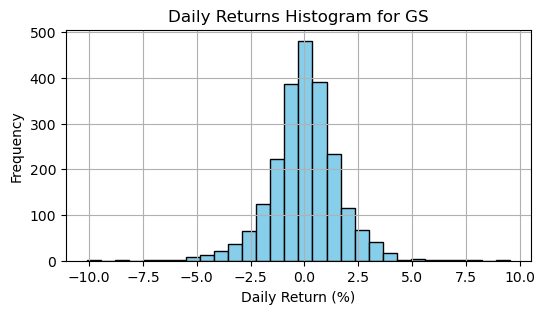

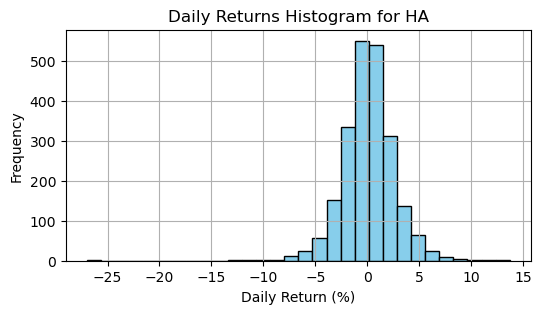

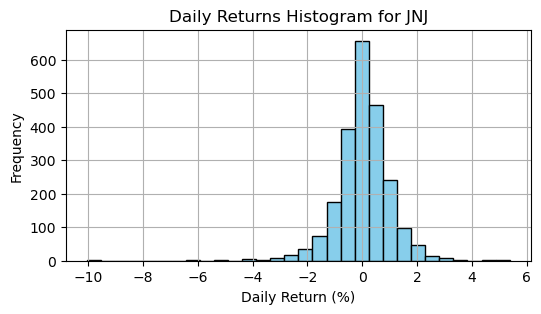

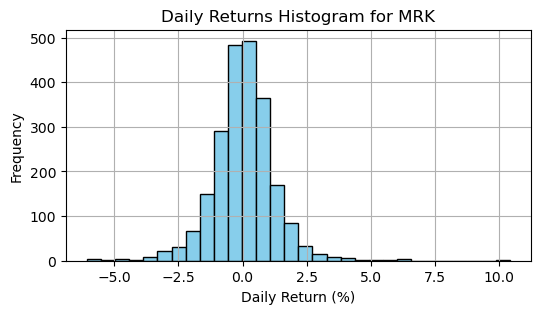

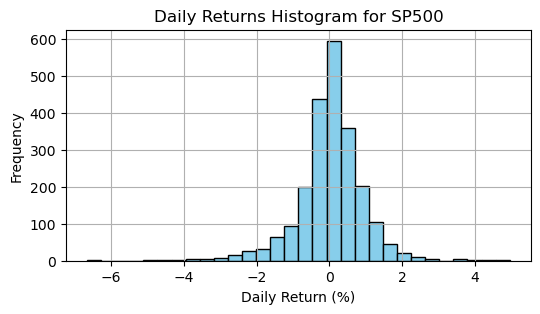

In [26]:
# Plot the histogram of daily returns

for stock_name, stock_df in stock_data.items():
    stock_df['Daily_Return'] = stock_df['Close'].pct_change() * 100
    plt.figure(figsize=(6, 3))
    plt.hist(stock_df['Daily_Return'], bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Daily Returns Histogram for {stock_name}')
    plt.xlabel('Daily Return (%)')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

#### Observation : 
- Low volatility      : AAPL (Event negative impact), AMZN (Event positive impact), GOOG (Event positive impact), JNJ (Event negative impact), MRK
- Moderate volatility : ALK (Event negative impact), GS
- High volatility     : AAL, CS, DB, HA
- Highest volatility  : BHC

### Check the daily return for stocks as per their category 

- Technology Companies: AAPL (Apple Inc.), AMZN (Amazon.com Inc.), GOOG (Alphabet Inc. - Class C)
- Pharmaceutical Companies: MRK (Merck & Co. Inc.), JNJ (Johnson & Johnson)
- Airlines: AAL (American Airlines Group Inc.), ALK (Alaska Air Group Inc.), HA (Hawaiian Holdings Inc.)
- Financial Companies: BHC (Bausch Health Companies Inc.), CS (Credit Suisse Group AG), DB (Deutsche Bank AG), GS (Goldman Sachs Group Inc.)

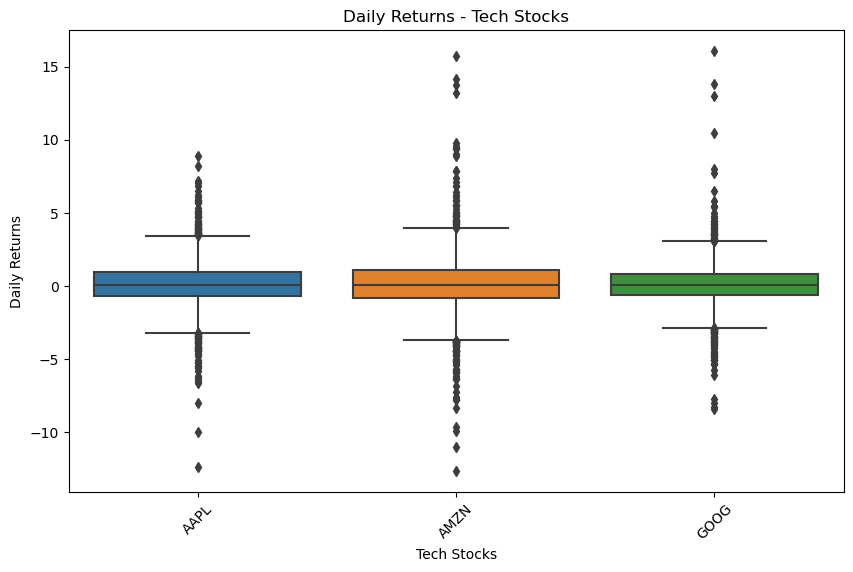

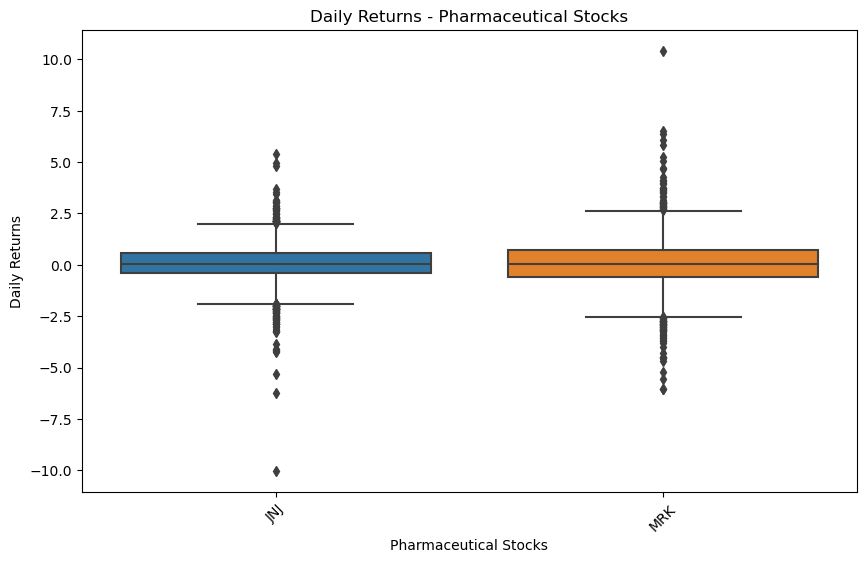

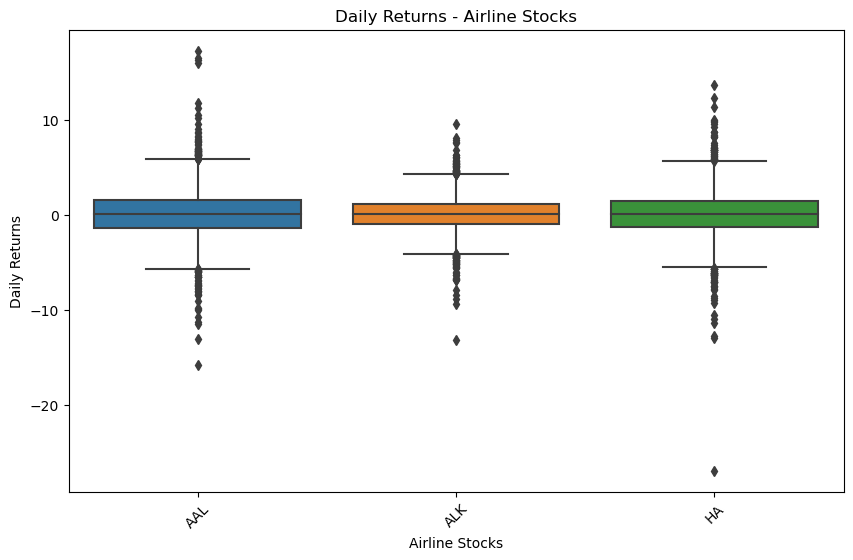

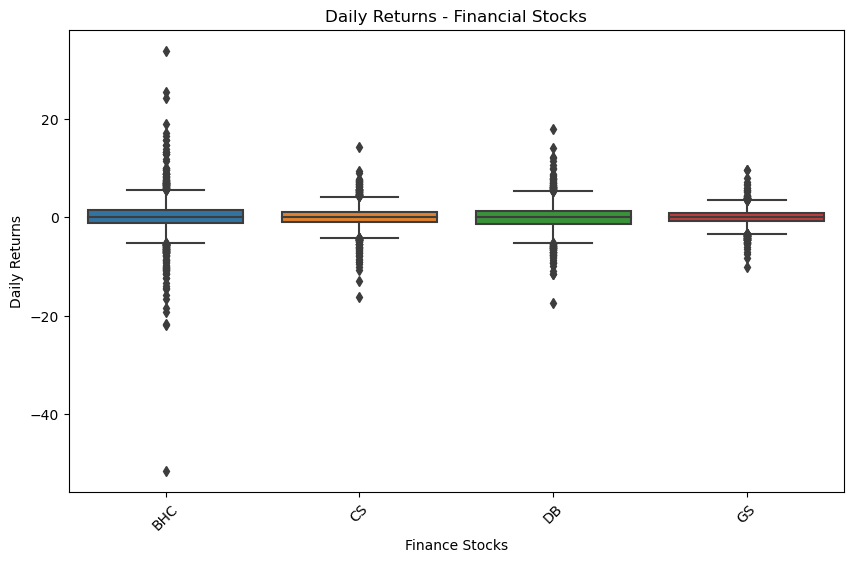

In [27]:
tech_file_name = ['AAPL', 'AMZN', 'GOOG']
pharma_file_name = ['JNJ', 'MRK']
air_file_name = ['AAL', 'ALK', 'HA']
fin_file_name = ['BHC', 'CS', 'DB', 'GS']

# Concatenate daily returns DataFrames of tech stocks
tech_returns = pd.concat([stock_data[file]['Daily_Return'] for file in tech_file_name], axis=1)
tech_returns.columns = tech_file_name

# Concatenate daily returns DataFrames of pharmaceutical stocks
pharma_returns = pd.concat([stock_data[file]['Daily_Return'] for file in pharma_file_name], axis=1)
pharma_returns.columns = pharma_file_name

# Concatenate daily returns DataFrames of airline stocks
air_returns = pd.concat([stock_data[file]['Daily_Return'] for file in air_file_name], axis=1)
air_returns.columns = air_file_name

# Concatenate daily returns DataFrames of financial stocks
fin_returns = pd.concat([stock_data[file]['Daily_Return'] for file in fin_file_name], axis=1)
fin_returns.columns = fin_file_name

# Plotting box plots for each category
plt.figure(figsize=(10, 6))
plt.title('Daily Returns - Tech Stocks')
sns.boxplot(data=tech_returns)
plt.xticks(rotation=45)
plt.xlabel('Tech Stocks')
plt.ylabel('Daily Returns')
plt.show()

plt.figure(figsize=(10, 6))
plt.title('Daily Returns - Pharmaceutical Stocks')
sns.boxplot(data=pharma_returns)
plt.xticks(rotation=45)
plt.xlabel('Pharmaceutical Stocks')
plt.ylabel('Daily Returns')
plt.show()

plt.figure(figsize=(10, 6))
plt.title('Daily Returns - Airline Stocks')
sns.boxplot(data=air_returns)
plt.xticks(rotation=45)
plt.xlabel('Airline Stocks')
plt.ylabel('Daily Returns')
plt.show()

plt.figure(figsize=(10, 6))
plt.title('Daily Returns - Financial Stocks')
sns.boxplot(data=fin_returns)
plt.xticks(rotation=45)
plt.xlabel('Finance Stocks')
plt.ylabel('Daily Returns')
plt.show()

##### Observation : Category wise stocks with broader range in daily returns are AMZN, MRK,AAL,HA,BHC,DB

In [28]:
# Check the mean daily return for all stocks

for stock_name, stock_df in stock_data.items():
    print(f'{stock_name} Avg daily return : {stock_df["Daily_Return"].mean()} ')

AAL Avg daily return : 0.08561441917292958 
AAPL Avg daily return : 0.09284681049567908 
ALK Avg daily return : 0.08547494784984455 
AMZN Avg daily return : 0.12418225168984025 
BHC Avg daily return : 0.053358639821870814 
CS Avg daily return : -0.031856004743551686 
DB Avg daily return : -0.058225472253241796 
GOOG Avg daily return : 0.07736248132430144 
GS Avg daily return : 0.027721004000036298 
HA Avg daily return : 0.09781284355175979 
JNJ Avg daily return : 0.0438429665534562 
MRK Avg daily return : 0.05132966699242248 
SP500 Avg daily return : 0.04459288106020389 


In [29]:
# Check the correlation between the closing prices of all stocks.

file_name = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK','SP500']
closing_price_df = pd.DataFrame()
closing_price_df = pd.concat([stock_data[file]['Close'] for file in file_name], axis=1)
closing_price_df.columns = file_name


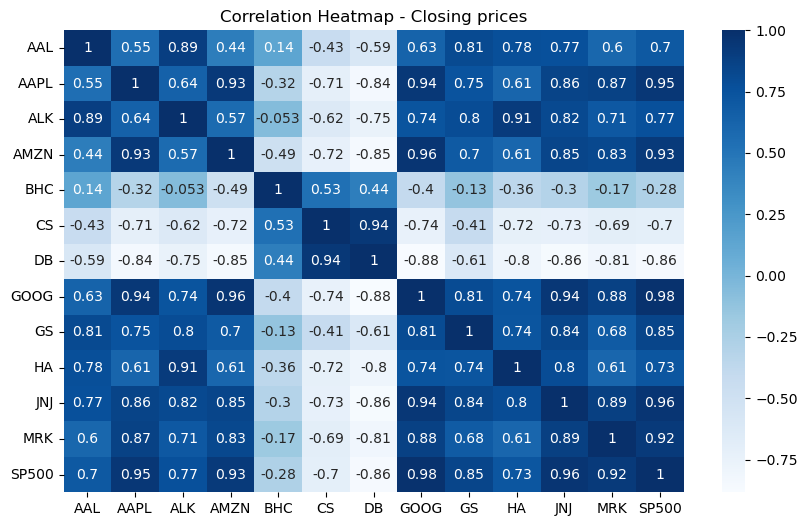

In [30]:
# Check the correlation matrix of closing prices

plt.figure(figsize=(10, 6))
sns.heatmap(closing_price_df.corr(),annot=True,cmap='Blues')
plt.title(f'Correlation Heatmap - Closing prices')
plt.show()

#### Observation : 
- Industry specific correlation can be seen from daily returns heatmap. The closing prices of stocks are highly correlated within the same industry like airlilnes, tech, finance.
- Finance section stock prices are observed to be not following the same trend as S&P index.

In [31]:
# Check the correlation between the daily returns of all stocks.

file_name = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK','SP500']

daily_returns_df = pd.concat([stock_data[file]['Daily_Return'] for file in file_name], axis=1)
daily_returns_df.columns = file_name
daily_returns_df.dropna(axis=0, inplace=True)


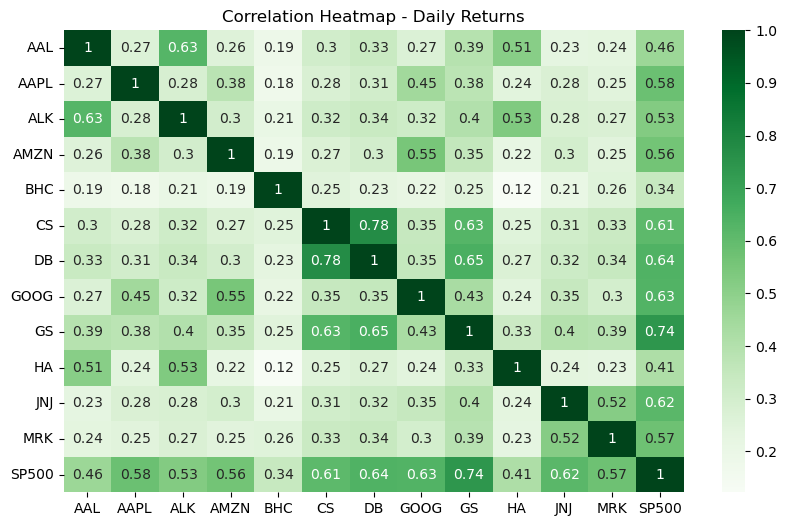

In [32]:
# Check the correlation matrix of closing prices

plt.figure(figsize=(10, 6))
sns.heatmap(daily_returns_df.corr(),annot=True,cmap='Greens')
plt.title(f'Correlation Heatmap - Daily Returns')
plt.show()

#### Observation : 
- Industry specific correlation can be seen from daily returns heatmap. The daily returns of stocks are highly correlated within the same industry like airlilnes, tech, finance.
- BHC, HA and AAL are seen to be the least following the S&P index.

In [33]:
# Check the correlation between volume of all stocks.

file_name = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK','SP500']

volume_df = pd.concat([stock_data[file]['Volume'] for file in file_name], axis=1)
volume_df.columns = file_name
volume_df.head(2)

,AAL,AAPL,ALK,AMZN,BHC,CS,DB,GOOG,GS,HA,JNJ,MRK,SP500
Date,,,,,,,,,,,,,
2011-02-02,11711100,258955200,2047600.0,4547500.0,2328900.0,703800.0,979400.0,3534500,2986200.0,3317100.0,9994200.0,13791500.0,4098260000
2011-02-03,7497900,393797600,2355600.0,3678900.0,1606800.0,846100.0,1417900.0,3001300,4710400.0,1869500.0,10078900.0,40238900.0,4370990000


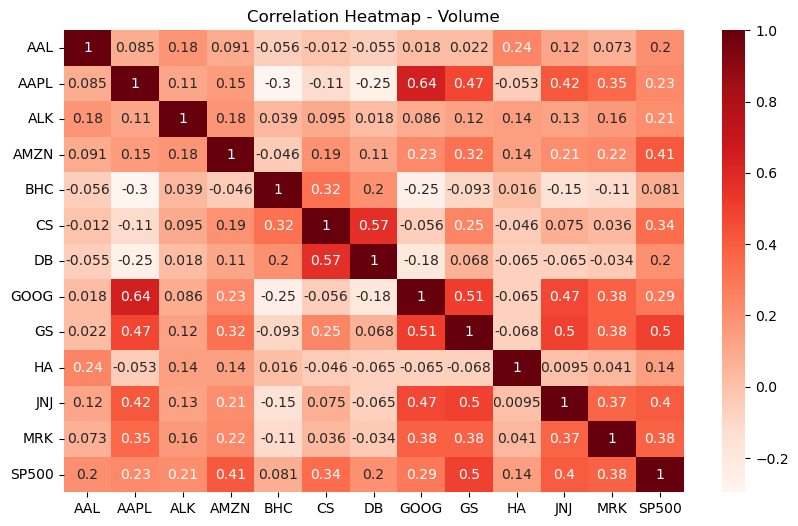

In [34]:
# Check the correlation matrix of closing prices

plt.figure(figsize=(10, 6))
sns.heatmap(volume_df.corr(),annot=True,cmap='Reds')
plt.title(f'Correlation Heatmap - Volume')
plt.show()

#### Observation : Google and Apple stock trading volume positively correlated. Both the stocks seems to have similar trading activity pattern in volumns.

## Capital Asset Pricing Model (CAPM)

In [35]:
print(closing_price_df.shape)
print(volume_df.shape)
print(daily_returns_df.shape)

(2243, 13)
(2243, 13)
(2242, 13)


In [36]:
closing_price_df.head()

,AAL,AAPL,ALK,AMZN,BHC,CS,DB,GOOG,GS,HA,JNJ,MRK,SP500
Date,,,,,,,,,,,,,
2011-02-02,9.52,12.297143,15.0000,173.529999,38.830002,44.082031,57.986641,304.857330,165.050003,6.99,60.619999,33.820000,1304.030029
2011-02-03,9.59,12.265715,14.9125,173.710007,39.200001,44.453125,59.064884,303.935760,164.639999,6.80,60.799999,32.900002,1307.099976
2011-02-04,9.24,12.375000,15.3525,175.929993,40.070000,45.068359,59.961834,304.349213,164.830002,6.78,60.840000,32.889999,1310.869995
2011-02-07,9.72,12.567142,15.3250,176.429993,39.799999,45.039063,60.601147,305.998047,167.130005,6.84,60.869999,33.000000,1319.050049
2011-02-08,9.88,12.685715,15.4850,183.059998,39.669998,45.732422,61.240459,308.035400,168.550003,6.80,60.939999,33.270000,1324.569946


In [37]:
# Calculate the daily returns
returns = closing_price_df.pct_change(1)

# Drop the rows with missing values
returns = returns.dropna(axis=0)
returns.head()

,AAL,AAPL,ALK,AMZN,BHC,CS,DB,GOOG,GS,HA,JNJ,MRK,SP500
Date,,,,,,,,,,,,,
2011-02-03,0.007353,-0.002556,-0.005833,0.001037,0.009529,0.008418,0.018595,-0.003023,-0.002484,-0.027182,0.002969,-0.027203,0.002354
2011-02-04,-0.036496,0.008910,0.029505,0.012780,0.022194,0.013840,0.015186,0.001360,0.001154,-0.002941,0.000658,-0.000304,0.002884
2011-02-07,0.051948,0.015527,-0.001791,0.002842,-0.006738,-0.000650,0.010662,0.005418,0.013954,0.008850,0.000493,0.003345,0.006240
2011-02-08,0.016461,0.009435,0.010440,0.037579,-0.003266,0.015395,0.010550,0.006658,0.008496,-0.005848,0.001150,0.008182,0.004185
2011-02-09,0.000000,0.008333,0.006942,0.012236,0.013360,-0.004057,0.001714,-0.003040,-0.015070,0.026471,-0.000985,-0.005410,-0.002786


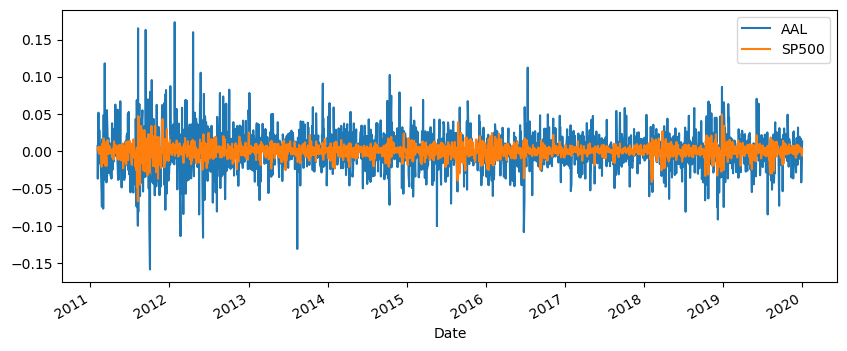

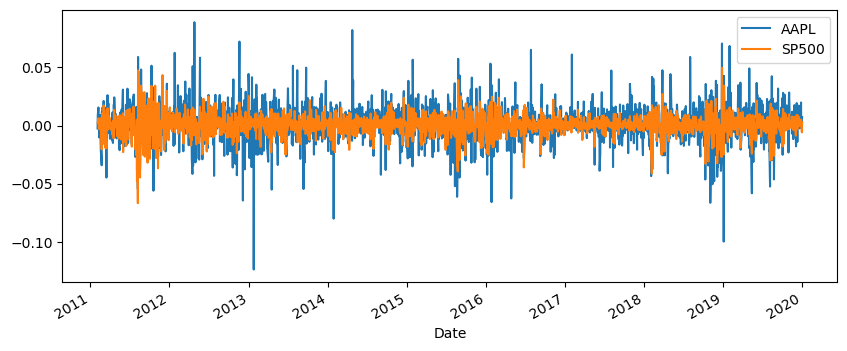

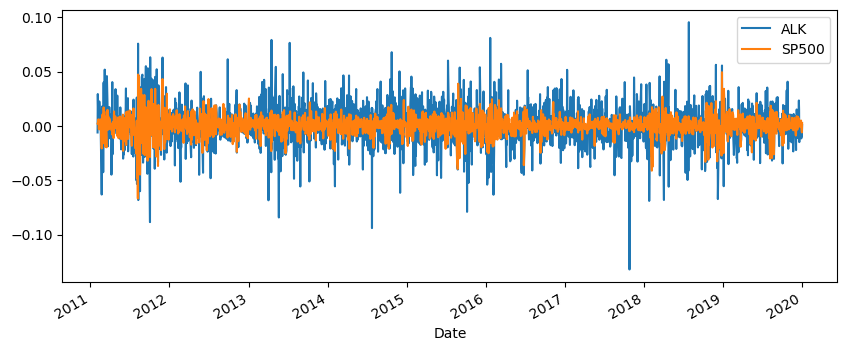

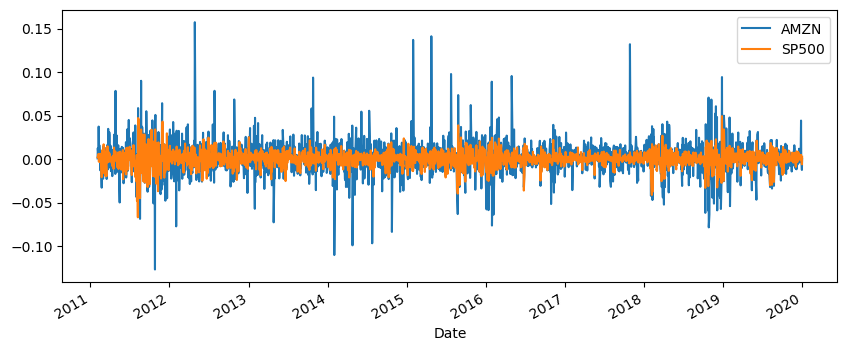

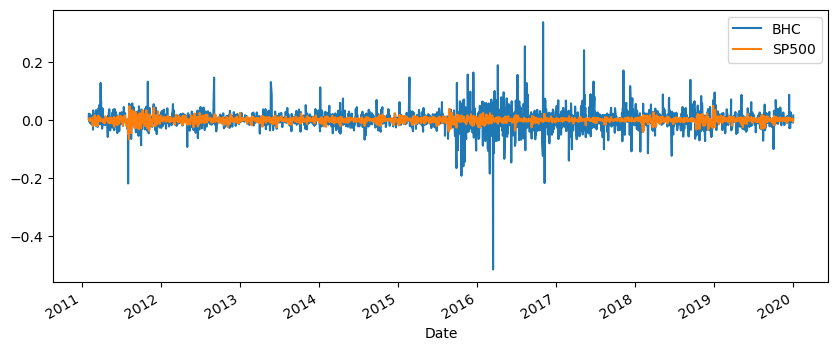

...

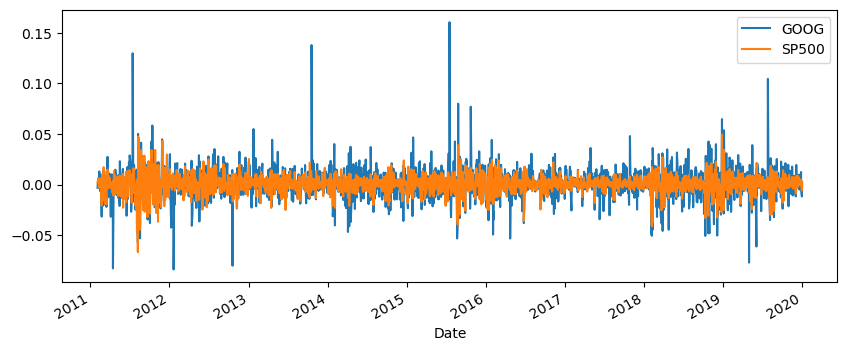

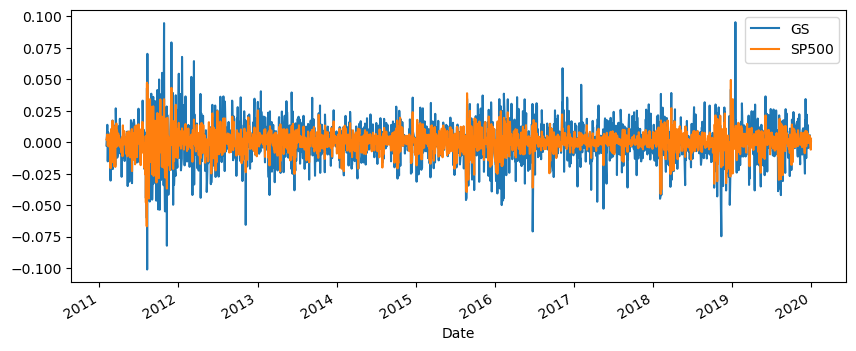

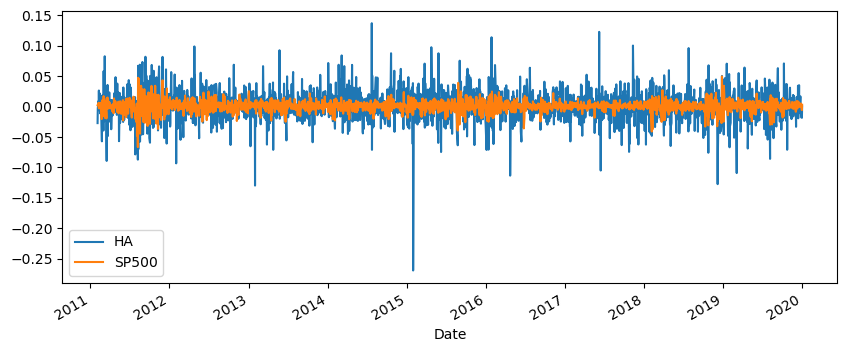

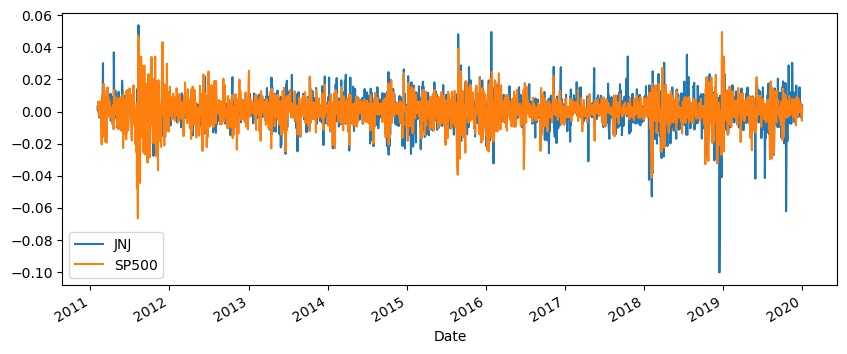

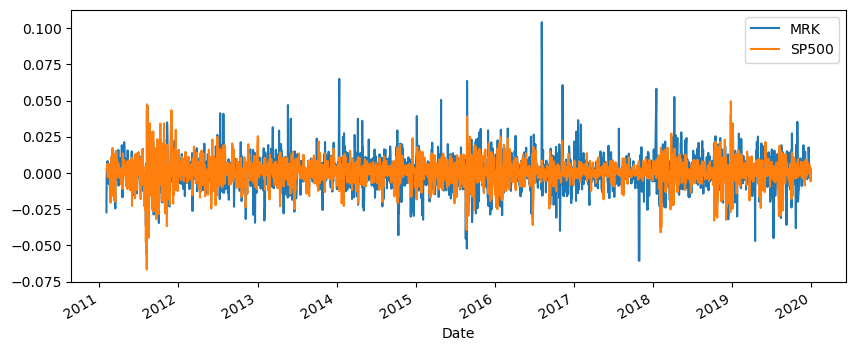

In [38]:
# Plot the series to understand the correlation
file_name_s = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK']
for file in file_name_s:
    returns[[file,'SP500']].plot(figsize=(10,4))

In [39]:
# Average daily return from each stock
daily_returns_mean = returns.mean()
print(daily_returns_mean)

AAL      0.000856
AAPL     0.000928
ALK      0.000855
AMZN     0.001242
BHC      0.000534
CS      -0.000319
DB      -0.000582
GOOG     0.000774
GS       0.000277
HA       0.000978
JNJ      0.000438
MRK      0.000513
SP500    0.000446
dtype: float64


In [40]:
# Calculate annualised returns

snp_annualized_return = daily_returns_mean['SP500']*252*100
snp_annualized_return

11.237406027171403

In [41]:
# Cumulative Return for an investor
new = returns.loc["01-02-2011":, :]

# Cumulative return from the portfolio
cumulative_returns = (1+new).cumprod()
cumulative_returns.tail(5)

,AAL,AAPL,ALK,AMZN,BHC,CS,DB,GOOG,GS,HA,JNJ,MRK,SP500
Date,,,,,,,,,,,,,
2019-12-24,3.065126,5.779188,4.606000,10.310667,0.769251,0.299895,0.131410,4.407176,1.392972,4.397711,2.407291,2.703726,2.471860
2019-12-26,3.116597,5.893849,4.604667,10.769147,0.764615,0.300803,0.132099,4.462415,1.400848,4.344778,2.405642,2.700769,2.484536
2019-12-27,2.987395,5.891612,4.552667,10.775082,0.764873,0.304206,0.132099,4.434501,1.397516,4.267525,2.404322,2.705500,2.484621
2019-12-30,2.972689,5.926580,4.512000,10.643059,0.758177,0.304659,0.133134,4.382837,1.392305,4.188841,2.396899,2.691603,2.470258
2019-12-31,3.012605,5.969882,4.516667,10.648533,0.770538,0.305113,0.134169,4.385724,1.393093,4.190272,2.406302,2.689237,2.477535


#### Preparing the data for linear regression

In [42]:
# Importing the library
import statsmodels.api as sm

In [43]:
# Split the data into dependent variable (Return on security) and independent variable (Return on market benchmark) 

X = returns['SP500']
y = returns['AAL']

In [44]:
# Add a constant for the regression equation
X_sm = sm.add_constant(X)

In [45]:
# Make regression model 

lm = sm.OLS(y,X_sm).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    AAL   R-squared:                       0.213
Model:                            OLS   Adj. R-squared:                  0.213
Method:                 Least Squares   F-statistic:                     607.8
Date:                Mon, 21 Aug 2023   Prob (F-statistic):          6.04e-119
Time:                        10:58:42   Log-Likelihood:                 5184.0
No. Observations:                2242   AIC:                        -1.036e+04
Df Residuals:                    2240   BIC:                        -1.035e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.001      0.477      0.6

In [46]:
# Regression Equation
print("constant: " + str(lm.params[0]))
print("Beta: " + str(lm.params[1]))

print("\nEquation: " + "(Ri - Rf) = " + str(lm.params[0]) + " + " + str(lm.params[1]) + " * (Rm - Rf)" )

constant: 0.0002419052328157901
Beta: 1.377437259737102

Equation: (Ri - Rf) = 0.0002419052328157901 + 1.377437259737102 * (Rm - Rf)


In [47]:
from scipy import stats

file_name_s = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK']
for file in file_name_s:
    beta = stats.linregress(returns['SP500'],returns[file])[0]
    print(f'The beta value for {file} is {beta}')

The beta value for AAL is 1.377437259737103
The beta value for AAPL is 1.0342700269864071
The beta value for ALK is 1.1037267692269892
The beta value for AMZN is 1.2007195004223863
The beta value for BHC is 1.3387262482934488
The beta value for CS is 1.3812089157482856
The beta value for DB is 1.7613331337376958
The beta value for GOOG is 1.0615678863081897
The beta value for GS is 1.3149487675440323
The beta value for HA is 1.1818135195946176
The beta value for JNJ is 0.6559451540337584
The beta value for MRK is 0.7584207097580231


In [48]:
# Risk free rate is given as 0.75% based on 10-year US Treasury bond yield

rf = 0.75/100

- CAPM = Risk Free Rate + beta * (Market Return - Risk Free Rate)

In [49]:
# CAPM calculation for every stock

file_name_s = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK']
for file in file_name_s:
    beta = stats.linregress(returns['SP500'],returns[file])[0]
    capm = rf + (beta * ((snp_annualized_return/100) - rf))
    print(f' {file}____ beta={round(beta,3)} CAPM = {round(capm * 100,2)} % ')

 AAL____ beta=1.377 CAPM = 15.2 % 
 AAPL____ beta=1.034 CAPM = 11.6 % 
 ALK____ beta=1.104 CAPM = 12.33 % 
 AMZN____ beta=1.201 CAPM = 13.34 % 
 BHC____ beta=1.339 CAPM = 14.79 % 
 CS____ beta=1.381 CAPM = 15.24 % 
 DB____ beta=1.761 CAPM = 19.22 % 
 GOOG____ beta=1.062 CAPM = 11.88 % 
 GS____ beta=1.315 CAPM = 14.54 % 
 HA____ beta=1.182 CAPM = 13.14 % 
 JNJ____ beta=0.656 CAPM = 7.63 % 
 MRK____ beta=0.758 CAPM = 8.7 % 


#### Sharpe ratio
The Sharpe Ratio calculates the excess return generated by an investment per unit of risk taken. A higher Sharpe Ratio indicates better risk-adjusted performance, as it means the investment has produced more return for each unit of risk it has exhibited. 

In [50]:
from scipy import stats
file_name_s = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK']

for file in file_name_s:
    beta = stats.linregress(returns['SP500'], returns[file])[0]
    capm = rf + (beta * ((snp_annualized_return / 100) - rf))
    
    # Calculate cumulative returns
    cumulative_returns = (1 + returns[file]).cumprod() - 1
    
    # Calculate Sharpe Ratio
    excess_returns = returns[file] - rf / 252  # Assuming daily data, 252 trading days
    annualized_excess_return = np.mean(excess_returns) * 252  # Annualize excess return
    volatility = np.std(excess_returns) * np.sqrt(252)  # Annualized volatility
    sharpe_ratio = annualized_excess_return / volatility
    
    # Calculate standard deviation
    std_deviation = np.std(returns[file])
    
    print(f'{file} : beta={round(beta, 3)} || CAPM = {round(capm * 100, 2)} % || Cumulative Returns: {cumulative_returns[-1] * 100:.2f} % || Sharpe Ratio: {sharpe_ratio:.2f} || Standard Deviation: {std_deviation:.4f}')


AAL : beta=1.377 || CAPM = 15.2 % || Cumulative Returns: 201.26 % || Sharpe Ratio: 0.49 || Standard Deviation: 0.0270
AAPL : beta=1.034 || CAPM = 11.6 % || Cumulative Returns: 496.99 % || Sharpe Ratio: 0.88 || Standard Deviation: 0.0162
ALK : beta=1.104 || CAPM = 12.33 % || Cumulative Returns: 351.67 % || Sharpe Ratio: 0.69 || Standard Deviation: 0.0191
AMZN : beta=1.201 || CAPM = 13.34 % || Cumulative Returns: 964.85 % || Sharpe Ratio: 0.99 || Standard Deviation: 0.0194
BHC : beta=1.339 || CAPM = 14.79 % || Cumulative Returns: -22.95 % || Sharpe Ratio: 0.23 || Standard Deviation: 0.0352
CS : beta=1.381 || CAPM = 15.24 % || Cumulative Returns: -69.49 % || Sharpe Ratio: -0.27 || Standard Deviation: 0.0205
DB : beta=1.761 || CAPM = 19.22 % || Cumulative Returns: -86.58 % || Sharpe Ratio: -0.39 || Standard Deviation: 0.0250
GOOG : beta=1.062 || CAPM = 11.88 % || Cumulative Returns: 338.57 % || Sharpe Ratio: 0.78 || Standard Deviation: 0.0152
GS : beta=1.315 || CAPM = 14.54 % || Cumulative

#### Observation : Stocks to be selected based on  1. risk to reward ratio 2. Volality 3. Stock and index covariance
- JNJ,MRK  : Low risk and moderate returns. Stock is performing below the index.
- AAPL, AMZN, GOOG : Moderate risk and high returns. Stock and index movements are in sync.

#### Portfolio finalization

In [51]:
# Check the weightage combinations to decide on the portfolio allocation.

beta_values = {'AAPL': 1.034, 'AMZN': 1.201, 'GOOG': 1.062, 'JNJ': 0.656, 'MRK': 0.758}

weightage_combinations = {
    'P1': [(0.2, 0.2, 0.2, 0.2, 0.2)],
    'P2': [(0.33, 0.33, 0.33, 0, 0)],
    'P3': [(0.25, 0.25, 0.25, 0.25, 0)],
    'P4': [(0.25, 0.25, 0.25, 0, 0.25)],
    'P5': [(0.2, 0.4, 0.2, 0, 0.2)],
}

# Calculate sum of products for different weightage combinations
for portfolio_name, weights_list in weightage_combinations.items():
    print(f" Portfolio: {portfolio_name} Stock list: {', '.join(beta_values.keys())}")
    for weights in weights_list:
        print(f' ')
        sum_of_products = sum([beta * w for beta, w in zip(beta_values.values(), weights)])
        portfolio_capm = rf + (sum_of_products * ((snp_annualized_return/100) - rf))
        print(f" Weights: {weights} Portfolio Beta: {sum_of_products:.4f} => Portfolio Expected Returns : {portfolio_capm*100:.2f}%")
    print('---------------------------------------------------------------------------------------------------------------')

 Portfolio: P1 Stock list: AAPL, AMZN, GOOG, JNJ, MRK
 
 Weights: (0.2, 0.2, 0.2, 0.2, 0.2) Portfolio Beta: 0.9422 => Portfolio Expected Returns : 10.63%
---------------------------------------------------------------------------------------------------------------
 Portfolio: P2 Stock list: AAPL, AMZN, GOOG, JNJ, MRK
 
 Weights: (0.33, 0.33, 0.33, 0, 0) Portfolio Beta: 1.0880 => Portfolio Expected Returns : 12.16%
---------------------------------------------------------------------------------------------------------------
 Portfolio: P3 Stock list: AAPL, AMZN, GOOG, JNJ, MRK
 
 Weights: (0.25, 0.25, 0.25, 0.25, 0) Portfolio Beta: 0.9883 => Portfolio Expected Returns : 11.11%
---------------------------------------------------------------------------------------------------------------
 Portfolio: P4 Stock list: AAPL, AMZN, GOOG, JNJ, MRK
 
 Weights: (0.25, 0.25, 0.25, 0, 0.25) Portfolio Beta: 1.0138 => Portfolio Expected Returns : 11.38%
---------------------------------------------

# Portfolio optimization

In [52]:
weight = np.array([0.1,0.1,0.1,0.1,0.0,0.1,0.0,0.1,0.1,0.1,0.1,0.1])

In [53]:
file_name_s = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK']


# file_name_sl = ['AAPL', 'AMZN', 'GOOG', 'JNJ', 'MRK']

In [54]:
df = pd.DataFrame()

for file in file_name_s:
    df = pd.concat([df, stock_data[file]['Adj Close']], axis=1)
df.columns = file_name_s
print(df.head())

                          AAL       AAPL        ALK        AMZN        BHC  \
2011-02-02 00:00:00  8.974899  10.626443  13.222342  173.529999  38.830002   
2011-02-03 00:00:00  9.040890  10.599289  13.145215  173.710007  39.200001   
2011-02-04 00:00:00  8.710930  10.693722  13.533071  175.929993  40.070000   
2011-02-07 00:00:00  9.163448  10.859759  13.508828  176.429993  39.799999   
2011-02-08 00:00:00  9.314285  10.962224  13.649869  183.059998  39.669998   

                            CS         DB        GOOG          GS        HA  \
2011-02-02 00:00:00  31.492828  49.592243  304.857330  142.396545  6.734942   
2011-02-03 00:00:00  31.757944  50.514404  303.935760  142.042831  6.551876   
2011-02-04 00:00:00  32.197479  51.281506  304.349213  142.206802  6.532606   
2011-02-07 00:00:00  32.176544  51.828266  305.998047  144.191116  6.590416   
2011-02-08 00:00:00  32.671890  52.375031  308.035400  145.416183  6.551876   

                           JNJ        MRK  
2011-02-02 0

In [55]:
returns = df.pct_change()
returns

,AAL,AAPL,ALK,AMZN,BHC,CS,DB,GOOG,GS,HA,JNJ,MRK
2011-02-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-02-03,0.007353,-0.002555,-0.005833,0.001037,0.009529,0.008418,0.018595,-0.003023,-0.002484,-0.027182,0.002969,-0.027203
2011-02-04,-0.036496,0.008909,0.029505,0.012780,0.022194,0.013840,0.015186,0.001360,0.001154,-0.002941,0.000658,-0.000304
2011-02-07,0.051948,0.015527,-0.001791,0.002842,-0.006738,-0.000650,0.010662,0.005418,0.013954,0.008849,0.000493,0.003344
2011-02-08,0.016461,0.009435,0.010441,0.037579,-0.003266,0.015395,0.010550,0.006658,0.008496,-0.005848,0.001150,0.008182
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-24,-0.004096,0.000951,-0.002886,-0.002114,-0.001337,-0.001510,-0.006519,-0.003914,0.003580,-0.001948,-0.003483,-0.003270
2019-12-26,0.016792,0.019840,-0.000289,0.044467,-0.006026,0.003026,0.005249,0.012534,0.005654,-0.012036,-0.000685,-0.001094
2019-12-27,-0.041456,-0.000379,-0.011293,0.000551,0.000337,0.011312,0.000000,-0.006256,-0.002379,-0.017781,-0.000549,0.001752
2019-12-30,-0.004923,0.005935,-0.008932,-0.012253,-0.008754,0.001491,0.007833,-0.011650,-0.003728,-0.018438,-0.003087,-0.005137


In [56]:
# Calculate annualized covariance matrix.

annualizaed_cov_matrix = returns.cov() * 252
annualizaed_cov_matrix

,AAL,AAPL,ALK,AMZN,BHC,CS,DB,GOOG,GS,HA,JNJ,MRK
AAL,0.183993,0.029259,0.081362,0.034056,0.044516,0.042729,0.056942,0.027635,0.042770,0.090049,0.015342,0.019433
AAPL,0.029259,0.065880,0.022070,0.030138,0.025029,0.023140,0.031206,0.027741,0.024848,0.025720,0.010936,0.012063
ALK,0.081362,0.022070,0.091585,0.028104,0.035252,0.031084,0.040474,0.023240,0.031076,0.066150,0.013326,0.015937
AMZN,0.034056,0.030138,0.028104,0.094407,0.032257,0.027329,0.037039,0.040776,0.027726,0.027837,0.014149,0.014404
BHC,0.044516,0.025029,0.035252,0.032257,0.312086,0.045309,0.052382,0.028997,0.035753,0.028050,0.017970,0.026934
CS,0.042729,0.023140,0.031084,0.027329,0.045309,0.104595,0.100180,0.027317,0.052373,0.033853,0.015425,0.020923
DB,0.056942,0.031206,0.040474,0.037039,0.052382,0.100180,0.157340,0.033495,0.066242,0.044427,0.019618,0.025978
GOOG,0.027635,0.027741,0.023240,0.040776,0.028997,0.027317,0.033495,0.057985,0.026371,0.024145,0.012767,0.013742
GS,0.042770,0.024848,0.031076,0.027726,0.035753,0.052373,0.066242,0.026371,0.065142,0.034680,0.015585,0.018899
HA,0.090049,0.025720,0.066150,0.027837,0.028050,0.033853,0.044427,0.024145,0.034680,0.168970,0.015239,0.017956


In [57]:
# Calculate portfolio variance

port_variance = np.dot(weight.T, np.dot(annualizaed_cov_matrix, weight))
port_variance

0.034214432138649616

In [58]:
# Calculate the volatility i.e std dev

port_volatility = np.sqrt(port_variance)
port_volatility

0.18497143600742688

In [59]:
# Calculate annual portfolio returns

portfolio_returns = np.sum(returns.mean() * weight) * 252
portfolio_returns 

0.1801929133240191

In [60]:
# Show exepect annual returns, volatility (risk), variance

port_risk = str(round(port_variance ,2) * 100) + '%'
port_vol = str(round(port_volatility ,2) * 100) + '%'
port_ret = str(round(portfolio_returns ,2) * 100) + '%'

print(f'expected returns : {port_ret}' )
print(f'annual risk : {port_vol}' )
print(f'annual variance : {port_risk}' )

expected returns : 18.0%
annual risk : 18.0%
annual variance : 3.0%


In [61]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

In [62]:
# Portfolio otimization

# calculate the expected returns and the annualized sample covariance matrix of asset returns

mu = expected_returns.mean_historical_return(df)
S = risk_models.sample_cov(df)

In [63]:
# Optimize for max sharpe ratio

ef = EfficientFrontier (mu, S)

In [64]:
weights = ef.max_sharpe()

In [65]:
cleaned_weights = ef.clean_weights()

In [66]:
print(cleaned_weights)

OrderedDict([('AAL', 0.0), ('AAPL', 0.24374), ('ALK', 0.06163), ('AMZN', 0.24173), ('BHC', 0.0), ('CS', 0.0), ('DB', 0.0), ('GOOG', 0.0), ('GS', 0.0), ('HA', 0.0), ('JNJ', 0.25266), ('MRK', 0.20025)])


In [67]:
ef.portfolio_performance(verbose=True)

Expected annual return: 21.1%
Annual volatility: 16.0%
Sharpe Ratio: 1.19


(0.2109811038877855, 0.1604464419674084, 1.1903106204535194)

In [68]:
from pypfopt.discrete_allocation import DiscreteAllocation, get_latest_prices
from pypfopt import DiscreteAllocation
from pypfopt import expected_returns, risk_models, EfficientFrontier

# Calculate expected returns and sample covariance
mu = expected_returns.mean_historical_return(df)
S = risk_models.sample_cov(df)

# Perform portfolio optimization
ef = EfficientFrontier(mu, S)
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()

# Get latest prices of the assets
latest_prices = get_latest_prices(df)

# Create DiscreteAllocation object
da = DiscreteAllocation(cleaned_weights, latest_prices, total_portfolio_value=15000)

# Use greedy_portfolio
allocation, leftover = da.greedy_portfolio()
print('Discrete allocation: ', allocation)
print('Funds remaining: ${:.2f}'.format(leftover))


Discrete allocation:  {'JNJ': 26, 'AAPL': 50, 'AMZN': 2, 'MRK': 34, 'ALK': 13}
Funds remaining: $44.36


# ==================================================

In [69]:
# Create a final dataset.

final_dataset = pd.DataFrame()

file_name = ['AAL', 'AAPL', 'ALK', 'AMZN', 'BHC', 'CS', 'DB', 'GOOG', 'GS', 'HA', 'JNJ', 'MRK','SP500']
for file in file_name:
    column_name = f'{file}_Close'
    final_dataset[column_name] = stock_data[file]['Close']
    
final_dataset.head()

,AAL_Close,AAPL_Close,ALK_Close,AMZN_Close,BHC_Close,CS_Close,DB_Close,GOOG_Close,GS_Close,HA_Close,JNJ_Close,MRK_Close,SP500_Close
Date,,,,,,,,,,,,,
2011-02-02,9.52,12.297143,15.0000,173.529999,38.830002,44.082031,57.986641,304.857330,165.050003,6.99,60.619999,33.820000,1304.030029
2011-02-03,9.59,12.265715,14.9125,173.710007,39.200001,44.453125,59.064884,303.935760,164.639999,6.80,60.799999,32.900002,1307.099976
2011-02-04,9.24,12.375000,15.3525,175.929993,40.070000,45.068359,59.961834,304.349213,164.830002,6.78,60.840000,32.889999,1310.869995
2011-02-07,9.72,12.567142,15.3250,176.429993,39.799999,45.039063,60.601147,305.998047,167.130005,6.84,60.869999,33.000000,1319.050049
2011-02-08,9.88,12.685715,15.4850,183.059998,39.669998,45.732422,61.240459,308.035400,168.550003,6.80,60.939999,33.270000,1324.569946


In [70]:
# Export the DataFrame to an Excel file

#excel_file_path = 'C:/00 Project/Stock Analysis/Individual stocks/final_dataset.xlsx'  # Specify the desired file path
#final_dataset.to_excel(excel_file_path, index=True)

#print(f'Data exported to {excel_file_path}')

# -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

##  Stock price prediction with Linear Regression and SVM

In [71]:
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa.api as sm
from statsmodels.tsa.api import VAR
from ta import add_all_ta_features

In [72]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [73]:
# Create a dictionary of selected stocks

selected_stocks = ['AAPL', 'ALK', 'AMZN', 'JNJ', 'MRK']

selected_stock_data = {stock_name: stock_df for stock_name, stock_df in stock_data.items() if stock_name in selected_stocks}

for stock_name, stock_df in selected_stock_data.items():
    print(f'{stock_name} : Shape : {stock_df.shape} Null: {stock_df.isnull().sum()}')

AAPL : Shape : (2243, 9) Null: Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
SMA_50          0
SMA_200         0
Daily_Return    1
dtype: int64
ALK : Shape : (2243, 9) Null: Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
SMA_50          0
SMA_200         0
Daily_Return    1
dtype: int64
AMZN : Shape : (2243, 9) Null: Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
SMA_50          0
SMA_200         0
Daily_Return    1
dtype: int64
JNJ : Shape : (2243, 9) Null: Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
SMA_50          0
SMA_200         0
Daily_Return    1
dtype: int64
MRK : Shape : (2243, 9) Null: Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
SMA_50          0
SMA_200         0
Dail

In [74]:
#### The final selected features for Closing price prediction are 'Open','High' and 'Low'

In [75]:
# Create a function for data preprocessing

def preprocess_data(data):
    
    forecast_out = 30
#    data['Close'] = data[['Close']].shift(-forecast_out)
    
    X = data[['Open','High','Low']]
    y = data['Close']
    
    X1 = X[:-forecast_out]
    y1 = y[:-forecast_out]
    
    X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)
    
    return X_train, X_test, y_train, y_test, X, y

In [76]:
# Create a function for linear regression
def train_linear_regression(X_train, y_train):
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    return lr_model

In [77]:
# Create a function for SVM
def train_svm(X_train, y_train):
    svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.1)
    svr_rbf.fit(X_train, y_train)
    return svr_rbf

In [78]:
# Create a function to evaluate model
def evaluate_model(model, X_test, y_test):
    confidence = model.score(X_test, y_test)
    return confidence

In [79]:
# Create a function for model prediction
def predict_future_prices(model, x_forecast):
    predictions = model.predict(x_forecast)
    return predictions

For stock AAPL LR Training R^2: 0.9998 || LR Testing R^2: 0.9998
For stock AAPL SVM Training R^2: 0.9999 || SVM Testing R^2: 0.9988


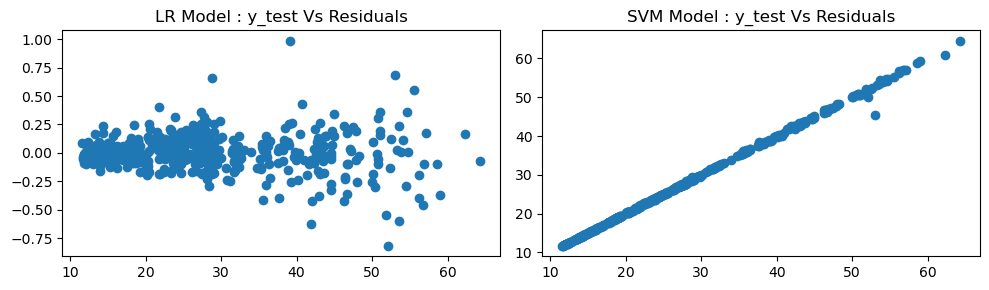

---------------------------------------------------------------------------------------------------------


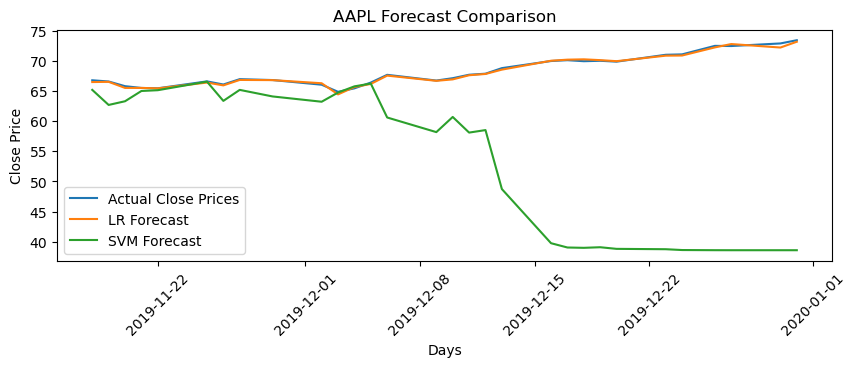

------------------------------------------------------------------------------------------------------
For stock ALK LR Training R^2: 0.9997 || LR Testing R^2: 0.9997
For stock ALK SVM Training R^2: 0.9998 || SVM Testing R^2: 0.9993


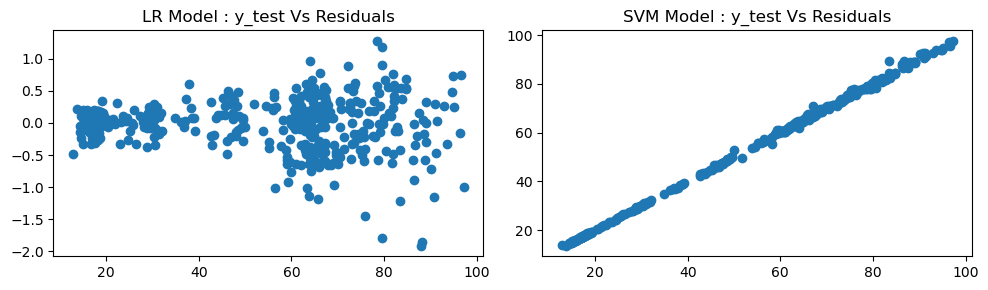

---------------------------------------------------------------------------------------------------------


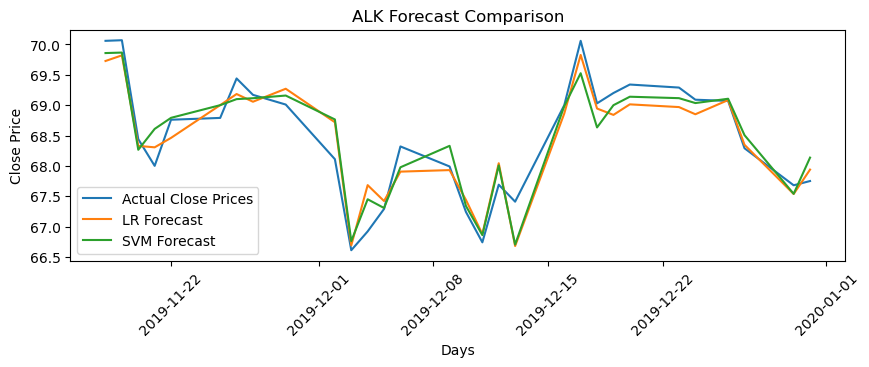

------------------------------------------------------------------------------------------------------
For stock AMZN LR Training R^2: 0.9999 || LR Testing R^2: 0.9999
For stock AMZN SVM Training R^2: 1.0000 || SVM Testing R^2: 0.6448


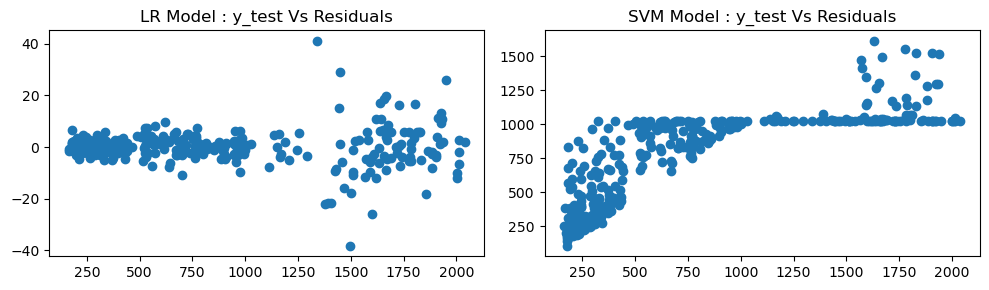

---------------------------------------------------------------------------------------------------------


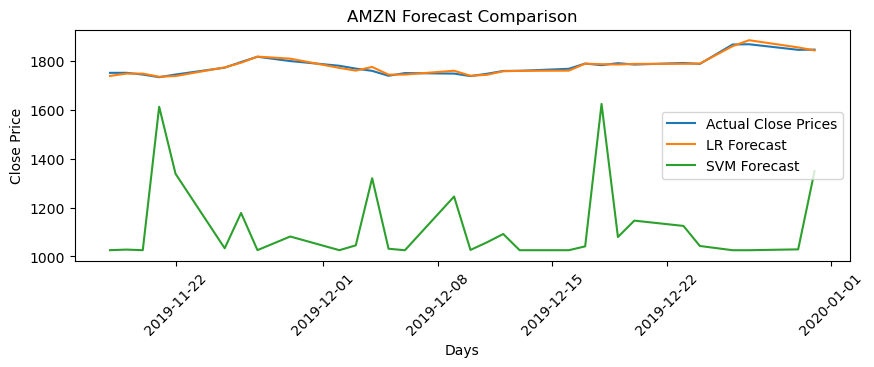

------------------------------------------------------------------------------------------------------
For stock JNJ LR Training R^2: 0.9997 || LR Testing R^2: 0.9998
For stock JNJ SVM Training R^2: 0.9999 || SVM Testing R^2: 0.9985


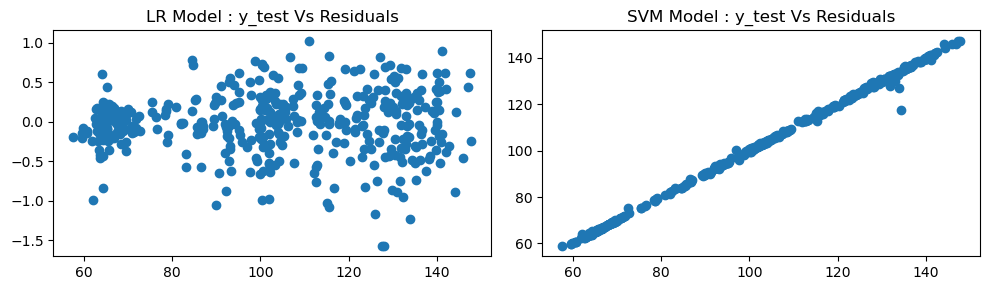

---------------------------------------------------------------------------------------------------------


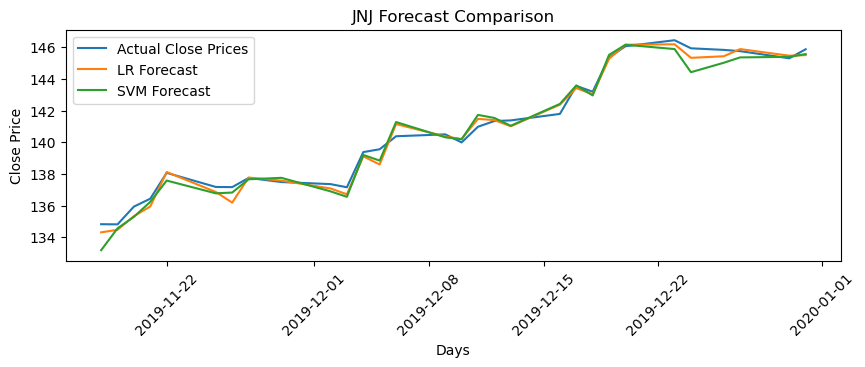

------------------------------------------------------------------------------------------------------
For stock MRK LR Training R^2: 0.9996 || LR Testing R^2: 0.9996
For stock MRK SVM Training R^2: 0.9997 || SVM Testing R^2: 0.9990


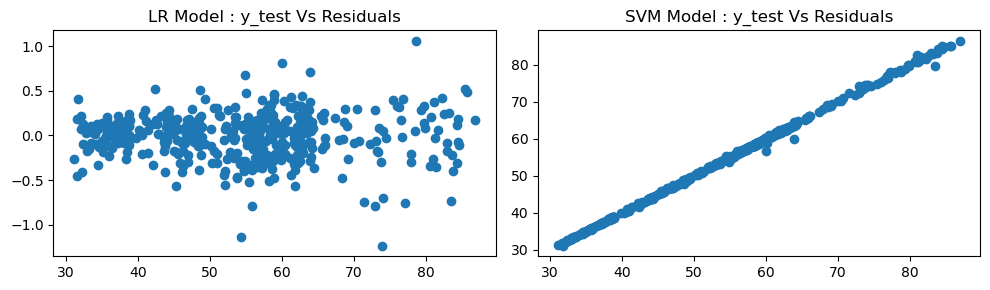

---------------------------------------------------------------------------------------------------------


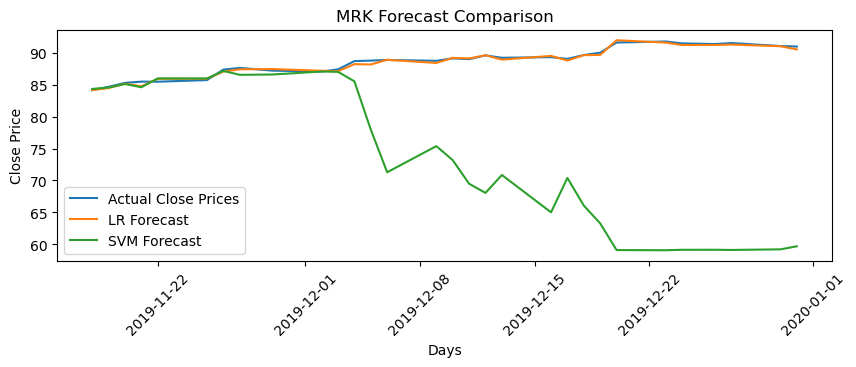

------------------------------------------------------------------------------------------------------


In [80]:
# Execute the functions to check model training and testing results.

for stock_name,stock_df in selected_stock_data.items():
   
    X_train, X_test, y_train, y_test,X, y = preprocess_data(stock_df)
    
    lr_model = train_linear_regression(X_train, y_train)
    svm_model = train_svm(X_train, y_train)
    
    lr_confidence_train = evaluate_model(lr_model, X_train, y_train)  
    svm_confidence_train = evaluate_model(svm_model, X_train, y_train)  
    
    lr_confidence_test = evaluate_model(lr_model, X_test, y_test)  
    svm_confidence_test = evaluate_model(svm_model, X_test, y_test)  
    
    lr_predictions = predict_future_prices(lr_model, X_test)  
    svm_predictions = predict_future_prices(svm_model, X_test)  
    
    lr_residuals = y_test - lr_predictions  
    svm_residuals = y_test - svm_predictions 
    
    print(f'For stock {stock_name} LR Training R^2: {lr_confidence_train:.4f} || LR Testing R^2: {lr_confidence_test:.4f}')
    print(f'For stock {stock_name} SVM Training R^2: {svm_confidence_train:.4f} || SVM Testing R^2: {svm_confidence_test:.4f}')
#    print(f'For stock {stock_name} X_train_shape:{X_train.shape} X_test_shape:{X_test.shape} y_train_shape:{y_train.shape} y_test_shape:{y_test.shape}' )
#    print(f'For stock {stock_name} X_shape:{X.shape} y_shape:{y.shape}' )
    
    plt.figure(figsize=(10,3))
    
    plt.subplot(1, 2, 1)
    plt.scatter(y_test,lr_residuals)
    plt.title("LR Model : y_test Vs Residuals")
        
    plt.subplot(1, 2, 2)
    plt.scatter(y_test,svm_predictions)
    plt.title("SVM Model : y_test Vs Residuals")
    
    plt.tight_layout()
    plt.show()
    print(f'---------------------------------------------------------------------------------------------------------')
    
    # Now let's forecast the last 30 values and compare them with the actual values
    forecast_out = 30
    x_forecast = X[-forecast_out:]  # Use the last 30 rows
    
    lr_forecast_predictions = predict_future_prices(lr_model, x_forecast)  
    svm_forecast_predictions = predict_future_prices(svm_model, x_forecast)  
    
    plt.figure(figsize=(10,3))
    plt.plot(y.index[-forecast_out:],y[-forecast_out:], label='Actual Close Prices')
    plt.plot(y.index[-forecast_out:],lr_forecast_predictions, label='LR Forecast')
    plt.plot(y.index[-forecast_out:],svm_forecast_predictions, label='SVM Forecast')
    plt.legend()
    plt.title(f'{stock_name} Forecast Comparison')
    plt.xlabel('Days')
    plt.ylabel('Close Price')
    plt.xticks(rotation=45)
    plt.show()
    print(f'------------------------------------------------------------------------------------------------------')
    

## Apple stock Price prediction using VAR model

In [81]:
import ta
from ta import add_all_ta_features

In [82]:
# Get the technical indicators
aapl_with_ta = add_all_ta_features(stock_data['AAPL'], open="Open", high="High", low="Low", close="Close", volume="Volume")
aapl_with_ta.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SMA_50',
       'SMA_200', 'Daily_Return', 'volume_adi', 'volume_obv', 'volume_cmf',
       'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap',
       'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh',
       'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi',
       'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl',
       'volatility_kcw', 'volatility_kcp', 'volatility_kchi',
       'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm',
       'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui',
       'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast',
       'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow',
       'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff',
       'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst',
       'trend_kst_sig', 'trend_kst_

In [83]:
# Create a dataframe with required variables
aapl_df = aapl_with_ta[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume','volume_vwap','trend_macd','momentum_rsi']]
aapl_df['SMA_50'] = ta.trend.SMAIndicator(close=aapl_df['Close'], window=50).sma_indicator()
aapl_df['SMA_200'] = ta.trend.SMAIndicator(close=aapl_df['Close'], window=200).sma_indicator()

In [84]:
# Check null values
aapl_df.isnull().sum()

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
volume_vwap      13
trend_macd       25
momentum_rsi     13
SMA_50           49
SMA_200         199
dtype: int64

In [85]:
# Drop null values
aapl_df.dropna(inplace=True)

In [86]:
# granger causality test : Stastistical tool to check if one time series can predict another. 
# We will use this test to check if the columns can predict close price.
# Import the library
from statsmodels.tsa.stattools import grangercausalitytests

In [87]:
# Define the maximum lag for the test
max_lag = 10
target_column = 'Close'

for predictor_column in aapl_df.columns:
    if target_column != predictor_column:
        data = pd.concat([aapl_df[target_column], aapl_df[predictor_column]], axis=1)
        print(f"\nGranger Causality Test: {predictor_column} causes {target_column}")
        result = grangercausalitytests(data, max_lag, verbose=True)


Granger Causality Test: Open causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9792  , p=0.0845  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=2.9836  , p=0.0841  , df=1
likelihood ratio test: chi2=2.9814  , p=0.0842  , df=1
parameter F test:         F=2.9792  , p=0.0845  , df_denom=2040, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.8769  , p=0.0004  , df_denom=2037, df_num=2
ssr based chi2 test:   chi2=15.7924 , p=0.0004  , df=2
likelihood ratio test: chi2=15.7316 , p=0.0004  , df=2
parameter F test:         F=7.8769  , p=0.0004  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6381  , p=0.0123  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=10.9517 , p=0.0120  , df=3
likelihood ratio test: chi2=10.9225 , p=0.0122  , df=3
parameter F test:         F=3.6381  , p=0.0123  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4

ssr based F test:         F=0.8111  , p=0.5927  , df_denom=2019, df_num=8
ssr based chi2 test:   chi2=6.5437  , p=0.5866  , df=8
likelihood ratio test: chi2=6.5332  , p=0.5877  , df=8
parameter F test:         F=0.8111  , p=0.5927  , df_denom=2019, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.8727  , p=0.5491  , df_denom=2016, df_num=9
ssr based chi2 test:   chi2=7.9281  , p=0.5414  , df=9
likelihood ratio test: chi2=7.9127  , p=0.5430  , df=9
parameter F test:         F=0.8727  , p=0.5491  , df_denom=2016, df_num=9

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7976  , p=0.6312  , df_denom=2013, df_num=10
ssr based chi2 test:   chi2=8.0589  , p=0.6231  , df=10
likelihood ratio test: chi2=8.0429  , p=0.6246  , df=10
parameter F test:         F=0.7976  , p=0.6312  , df_denom=2013, df_num=10

Granger Causality Test: volume_vwap causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.109

likelihood ratio test: chi2=13.8819 , p=0.0533  , df=7
parameter F test:         F=1.9752  , p=0.0549  , df_denom=2022, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.3293  , p=0.2240  , df_denom=2019, df_num=8
ssr based chi2 test:   chi2=10.7240 , p=0.2178  , df=8
likelihood ratio test: chi2=10.6959 , p=0.2195  , df=8
parameter F test:         F=1.3293  , p=0.2240  , df_denom=2019, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.4898  , p=0.1459  , df_denom=2016, df_num=9
ssr based chi2 test:   chi2=13.5346 , p=0.1399  , df=9
likelihood ratio test: chi2=13.4898 , p=0.1417  , df=9
parameter F test:         F=1.4898  , p=0.1459  , df_denom=2016, df_num=9

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3465  , p=0.1998  , df_denom=2013, df_num=10
ssr based chi2 test:   chi2=13.6053 , p=0.1918  , df=10
likelihood ratio test: chi2=13.5600 , p=0.1940  , df=10
parameter F test:         F=1

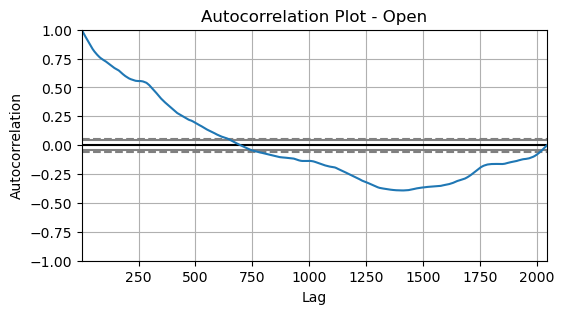

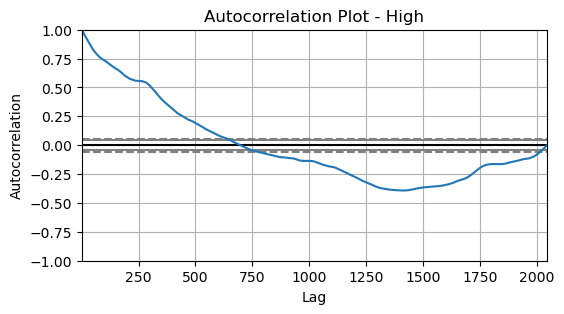

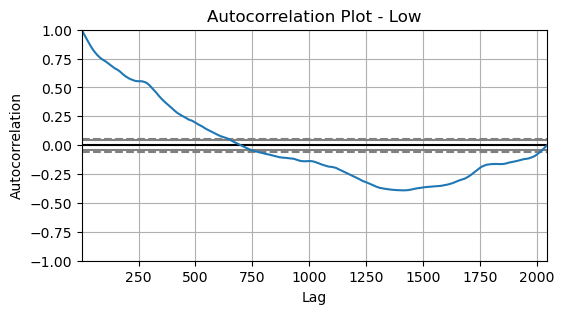

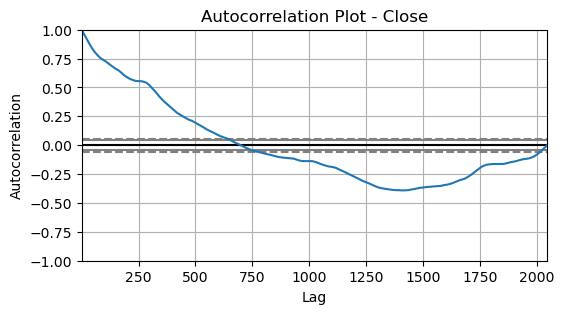

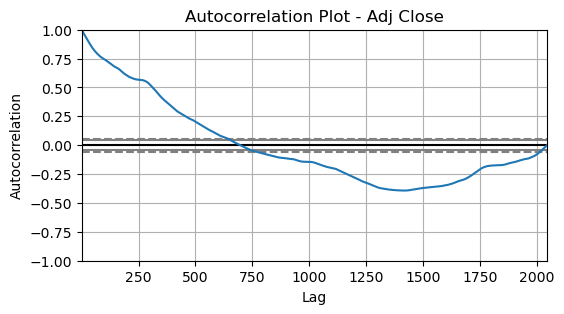

...

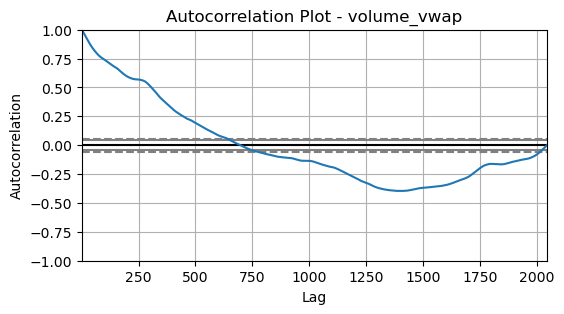

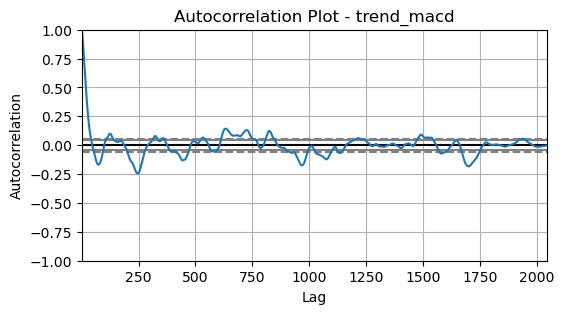

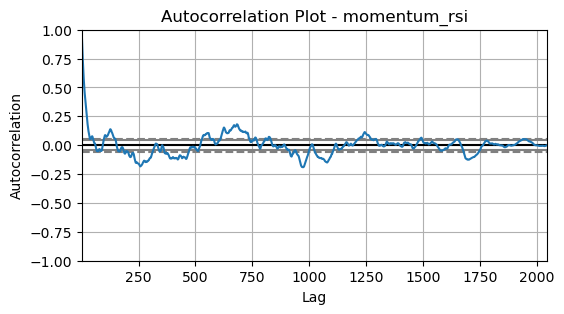

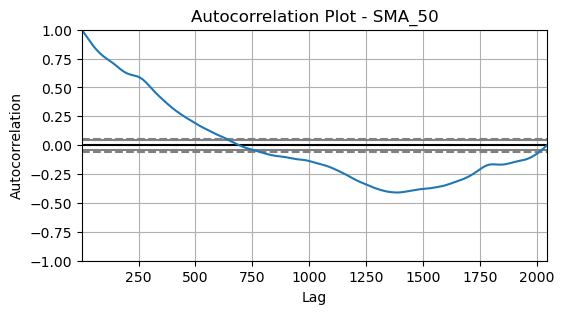

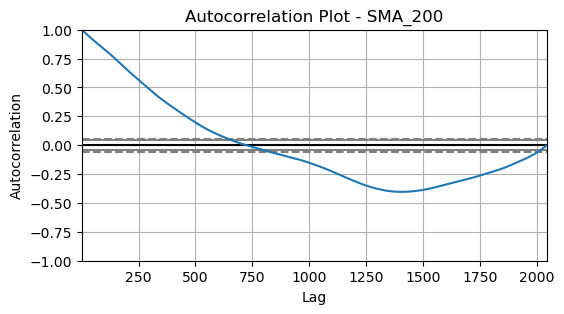

In [88]:
# Check the autocorrelation plots

from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt

for col in aapl_df.columns:
    plt.figure(figsize=(6,3))
    autocorrelation_plot(aapl_df[col])
    plt.title("Autocorrelation Plot - "+col)
    plt.show()

In [89]:
# Feature selection based on above tests

aapl_df_selected = aapl_df[['Open','volume_vwap','Adj Close','Close']]

In [90]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in aapl_df_selected.columns:
    adf_test = adfuller(aapl_df_selected[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Open : ADF Statistic: 1.0491, Critical Values @ 0.05: -2.8630,  p-value: 0.9948 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
volume_vwap : ADF Statistic: 0.7030, Critical Values @ 0.05: -2.8630,  p-value: 0.9899 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: 1.4663, Critical Values @ 0.05: -2.8630,  p-value: 0.9974 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: 1.2168, Critical Values @ 0.05: -2.8630,  p-value: 0.9961 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------


In [91]:
# Differentiate the data to check the stationarity
aapl_df_selected_diff = aapl_df_selected.diff()
aapl_df_selected_diff.dropna(inplace=True)

In [92]:
aapl_df_selected_diff.isnull().sum()

Open           0
volume_vwap    0
Adj Close      0
Close          0
dtype: int64

In [93]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in aapl_df_selected_diff.columns:
    adf_test = adfuller(aapl_df_selected_diff[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Open : ADF Statistic: -11.1688, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
volume_vwap : ADF Statistic: -7.2495, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: -13.5695, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -13.7280, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------


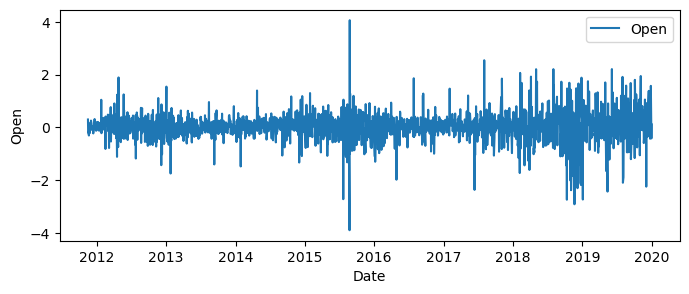

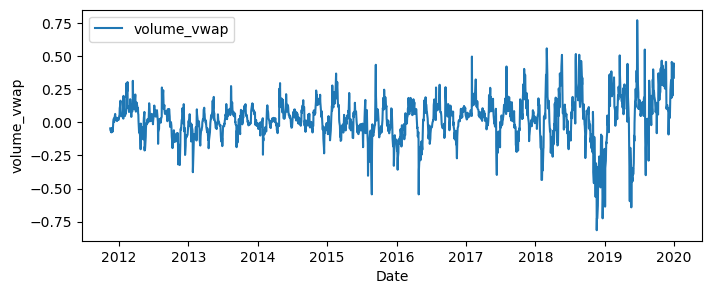

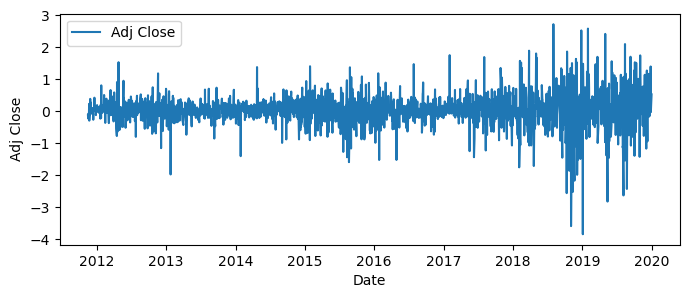

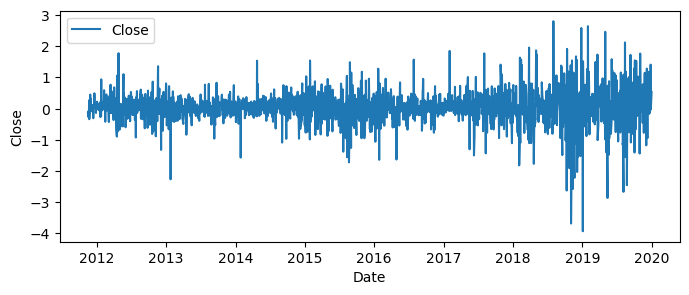

In [94]:
# Visualize the columns in the dataframe

for col in aapl_df_selected_diff.columns:
    plt.figure(figsize=(8, 3))
    plt.plot(aapl_df_selected_diff[col], label=col)
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.legend()
plt.show()

In [95]:
# Perform train-test split while preserving chronological order

train_len = int(aapl_df_selected_diff.shape[0]*0.8)
test_len = int(aapl_df_selected_diff.shape[0]) - int(aapl_df_selected_diff.shape[0]*0.8)

split_ratio = 0.8
split_index = int(split_ratio * len(aapl_df_selected_diff))
train_data = aapl_df_selected_diff.iloc[:split_index]
test_data = aapl_df_selected_diff.iloc[split_index:]

# Check the first few rows of train and test data
print("Train Data:")
print(train_data.head())
print("\nTest Data:")
print(test_data.head())

Train Data:
                Open  volume_vwap  Adj Close     Close
Date                                                  
2011-11-16  0.301786    -0.045732  -0.125299 -0.145000
2011-11-17 -0.188214    -0.059728  -0.227147 -0.262857
2011-11-18 -0.180715    -0.061005  -0.076226 -0.088214
2011-11-21 -0.304285    -0.073710  -0.183015 -0.211787
2011-11-22  0.022142    -0.048095   0.231468  0.267858

Test Data:
                Open  volume_vwap  Adj Close     Close
Date                                                  
2018-05-17  0.482498     0.378533  -0.289055 -0.297497
2018-05-18 -0.202499     0.421805  -0.165180 -0.170002
2018-05-21  0.202499     0.509274   0.320641  0.330002
2018-05-22  0.095001     0.389125  -0.114170 -0.117500
2018-05-23 -0.507499     0.247721   0.291500  0.299999


In [96]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\Users\91902\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [97]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-15.72,-15.71,1.489e-07,-15.72
1,-18.27,-18.20,1.166e-08,-18.24
2,-18.48,-18.36,9.434e-09,-18.43
3,-18.60,-18.43,8.343e-09,-18.54
4,-18.66,-18.43,7.905e-09,-18.57
5,-18.69,-18.40,7.650e-09,-18.58
6,-18.73,-18.39,7.315e-09,-18.61
7,-18.78,-18.38,7.000e-09,-18.63
8,-18.80,-18.35,6.839e-09,-18.63
9,-18.85,-18.35,6.515e-09,-18.66


In [98]:
# Providing maxlags as num with minimum AIC value
results = model.fit(maxlags = 50, ic = 'aic')

In [99]:
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 21, Aug, 2023
Time:                     10:59:47
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                   -18.3359
Nobs:                     1613.00    HQIC:                  -19.0497
Log likelihood:           6888.47    FPE:                3.49920e-09
AIC:                     -19.4711    Det(Omega_mle):     2.84942e-09
--------------------------------------------------------------------
Results for equation Open
                     coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------
const                   0.007501         0.007476            1.003           0.316
L1.Open                -1.069901         0.034621          -30.903           0.000
L1.volume_vwap          0.169381         0.232190    

In [100]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 21

In [101]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = aapl_df_selected_diff.index[train_len:], columns = aapl_df_selected_diff.columns)

In [102]:
### Model evaluation

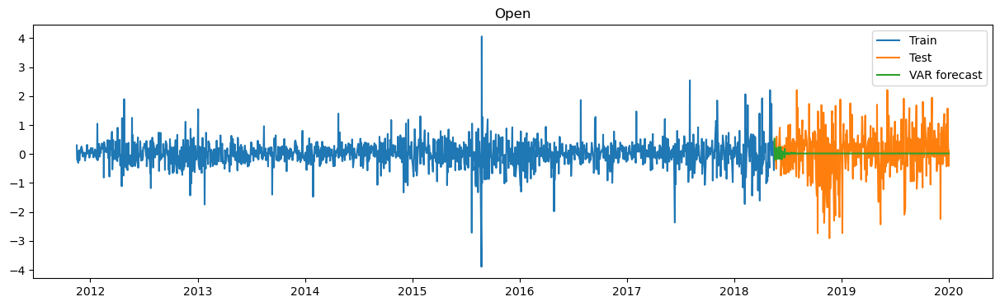

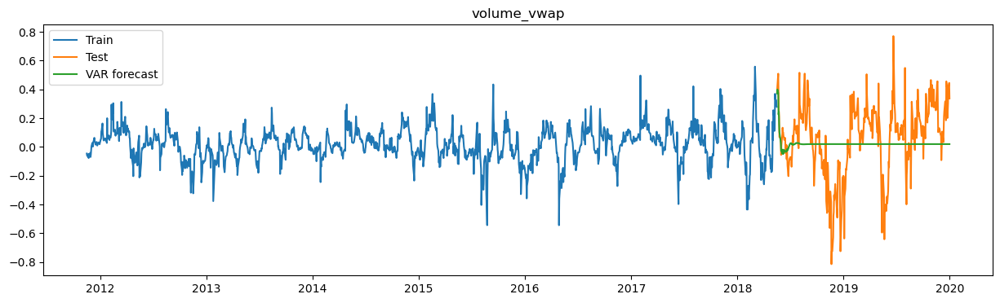

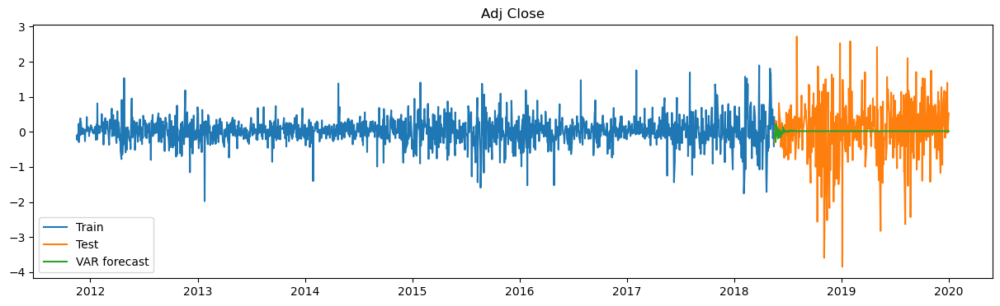

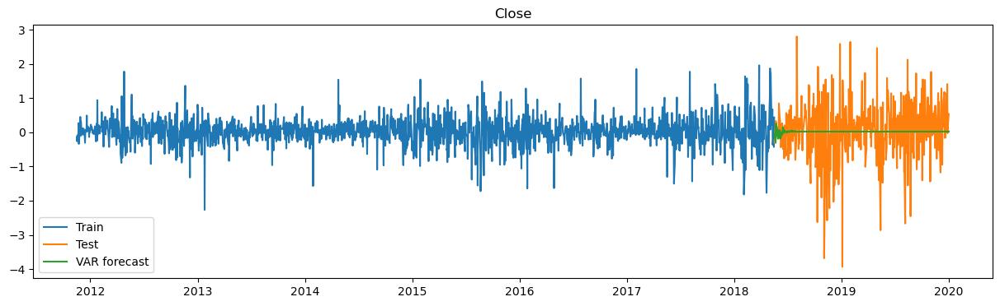

In [103]:
# Printing the train, test and forecasted values
for col in aapl_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(aapl_df_selected_diff[col][:train_len], label='Train')
    plt.plot(aapl_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

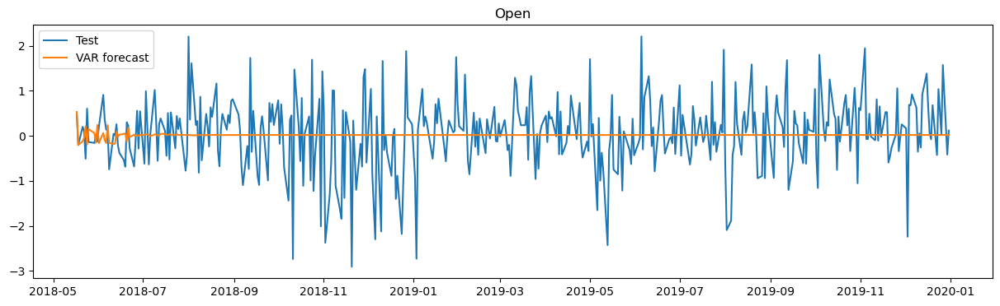

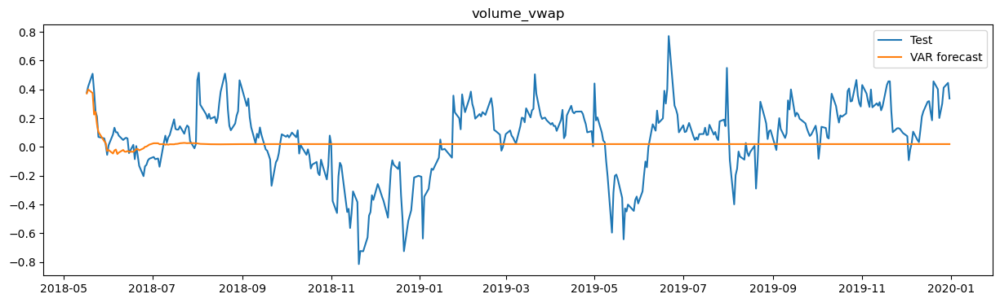

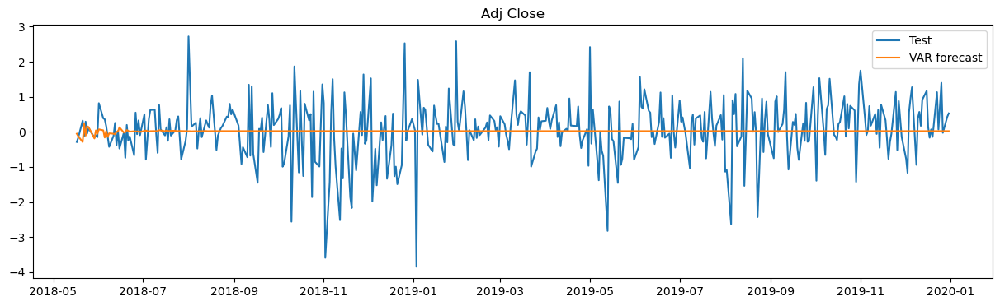

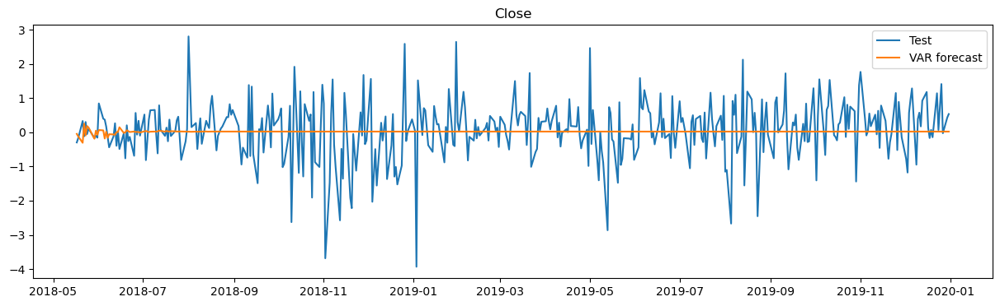

In [104]:
# Comparing the test and forecasted values
for col in aapl_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(aapl_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [105]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in aapl_df_selected_diff.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,Open,0.80,10.64
0,volume_vwap,0.24,15.35
0,Adj Close,0.84,3.33
0,Close,0.85,2.89


# =====================================================

## Johnson and Johnson Stock prediction using VAR Model

In [106]:
# Get the technical indicators
jnj_with_ta = add_all_ta_features(stock_data['JNJ'], open="Open", high="High", low="Low", close="Close", volume="Volume")

In [107]:
# Create a dataframe with required variables
jnj_df = jnj_with_ta[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume','volume_vwap','trend_macd','momentum_rsi']]
jnj_df['SMA_50'] = ta.trend.SMAIndicator(close=jnj_df['Close'], window=50).sma_indicator()
jnj_df['SMA_200'] = ta.trend.SMAIndicator(close=jnj_df['Close'], window=200).sma_indicator()

In [108]:
jnj_df.isnull().sum()

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
volume_vwap      13
trend_macd       25
momentum_rsi     13
SMA_50           49
SMA_200         199
dtype: int64

In [109]:
jnj_df.dropna(inplace=True)

In [110]:
# Define the maximum lag for the test
max_lag = 10
target_column = 'Close'

for predictor_column in jnj_df.columns:
    if target_column != predictor_column:
        data = pd.concat([jnj_df[target_column], jnj_df[predictor_column]], axis=1)
        print(f"\nGranger Causality Test: {predictor_column} causes {target_column}")
        result = grangercausalitytests(data, max_lag, verbose=True)


Granger Causality Test: Open causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1060  , p=0.2931  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=1.1076  , p=0.2926  , df=1
likelihood ratio test: chi2=1.1073  , p=0.2927  , df=1
parameter F test:         F=1.1060  , p=0.2931  , df_denom=2040, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8842  , p=0.4132  , df_denom=2037, df_num=2
ssr based chi2 test:   chi2=1.7728  , p=0.4121  , df=2
likelihood ratio test: chi2=1.7721  , p=0.4123  , df=2
parameter F test:         F=0.8842  , p=0.4132  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4240  , p=0.0640  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=7.2970  , p=0.0630  , df=3
likelihood ratio test: chi2=7.2840  , p=0.0634  , df=3
parameter F test:         F=2.4240  , p=0.0640  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4

ssr based F test:         F=1.1554  , p=0.3276  , df_denom=2025, df_num=6
ssr based chi2 test:   chi2=6.9767  , p=0.3230  , df=6
likelihood ratio test: chi2=6.9648  , p=0.3241  , df=6
parameter F test:         F=1.1554  , p=0.3276  , df_denom=2025, df_num=6

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4563  , p=0.1785  , df_denom=2022, df_num=7
ssr based chi2 test:   chi2=10.2699 , p=0.1738  , df=7
likelihood ratio test: chi2=10.2441 , p=0.1752  , df=7
parameter F test:         F=1.4563  , p=0.1785  , df_denom=2022, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2108  , p=0.2884  , df_denom=2019, df_num=8
ssr based chi2 test:   chi2=9.7683  , p=0.2817  , df=8
likelihood ratio test: chi2=9.7450  , p=0.2834  , df=8
parameter F test:         F=1.2108  , p=0.2884  , df_denom=2019, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3142  , p=0.2240  , df_denom=2016, df_num=9
ssr based chi2

ssr based F test:         F=3.4759  , p=0.0077  , df_denom=2031, df_num=4
ssr based chi2 test:   chi2=13.9653 , p=0.0074  , df=4
likelihood ratio test: chi2=13.9177 , p=0.0076  , df=4
parameter F test:         F=3.4759  , p=0.0077  , df_denom=2031, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4890  , p=0.0295  , df_denom=2028, df_num=5
ssr based chi2 test:   chi2=12.5123 , p=0.0284  , df=5
likelihood ratio test: chi2=12.4741 , p=0.0288  , df=5
parameter F test:         F=2.4890  , p=0.0295  , df_denom=2028, df_num=5

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.4214  , p=0.0246  , df_denom=2025, df_num=6
ssr based chi2 test:   chi2=14.6216 , p=0.0234  , df=6
likelihood ratio test: chi2=14.5694 , p=0.0239  , df=6
parameter F test:         F=2.4214  , p=0.0246  , df_denom=2025, df_num=6

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1079  , p=0.0398  , df_denom=2022, df_num=7
ssr based chi2

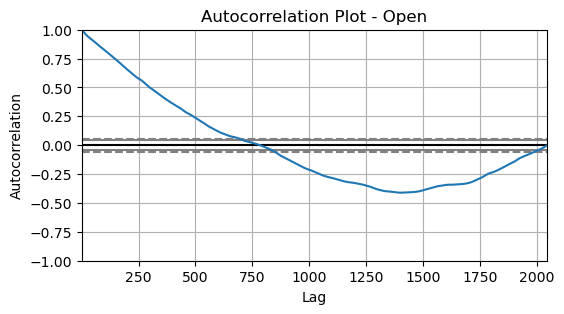

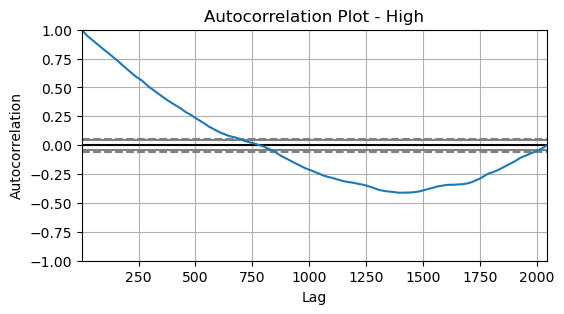

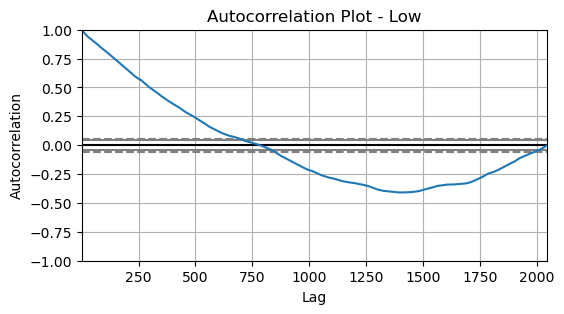

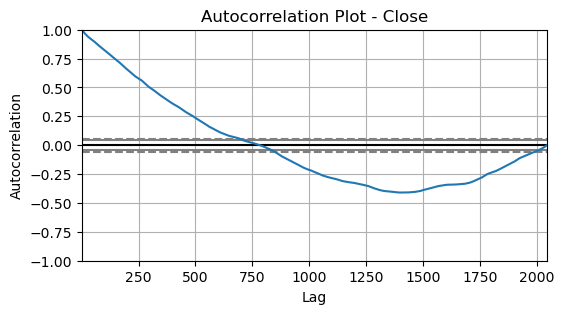

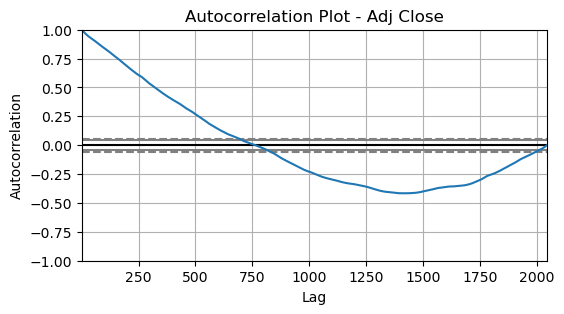

...

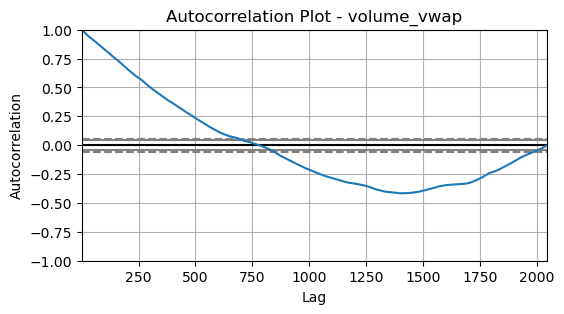

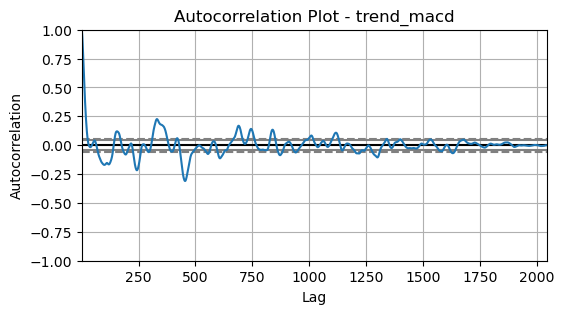

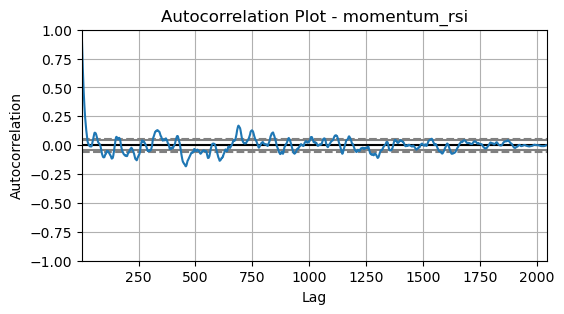

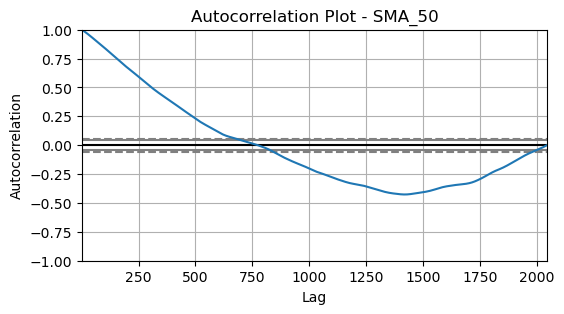

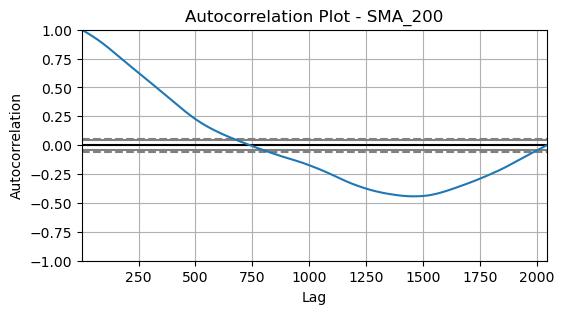

In [111]:
# Check the autocorrelation plots

from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt

for col in jnj_df.columns:
    plt.figure(figsize=(6,3))
    autocorrelation_plot(jnj_df[col])
    plt.title("Autocorrelation Plot - "+col)
    plt.show()

In [112]:
# Select features
#aapl_df_selected = aapl_df[['Open','volume_vwap','Adj Close','Close']]
#jnj_df_selected = jnj_df[['High','Adj Close','Close']]
#jnj_df_selected = jnj_df[['Open','High','volume_vwap','Adj Close','Close']]
jnj_df_selected = jnj_df[['High','Close','Adj Close']]

In [113]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in jnj_df_selected.columns:
    adf_test = adfuller(jnj_df_selected[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

High : ADF Statistic: -1.1617, Critical Values @ 0.05: -2.8630,  p-value: 0.6899 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -1.2269, Critical Values @ 0.05: -2.8630,  p-value: 0.6619 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: -0.8095, Critical Values @ 0.05: -2.8630,  p-value: 0.8163 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------


In [114]:
# Differentiate the data to check the stationarity
jnj_df_selected_diff = jnj_df_selected.diff()
jnj_df_selected_diff.dropna(inplace=True)

In [115]:
jnj_df_selected_diff.isnull().sum()

High         0
Close        0
Adj Close    0
dtype: int64

In [116]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in jnj_df_selected_diff.columns:
    adf_test = adfuller(jnj_df_selected_diff[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

High : ADF Statistic: -41.0286, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -20.2556, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: -20.3243, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------


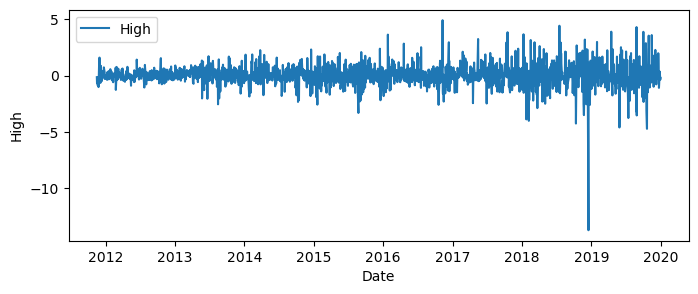

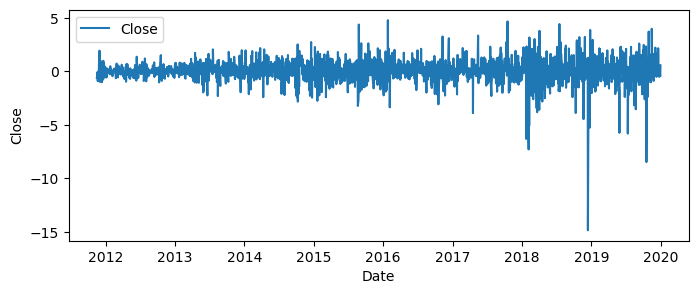

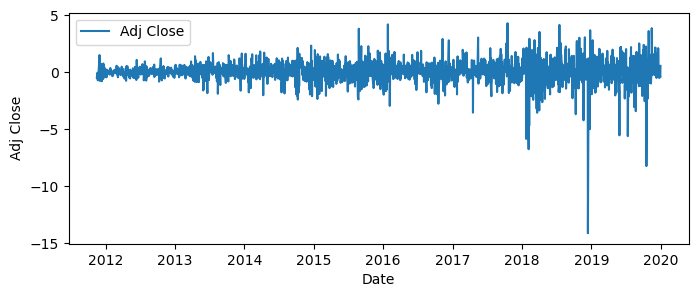

In [117]:
# Visualize the columns in the dataframe

for col in jnj_df_selected_diff.columns:
    plt.figure(figsize=(8, 3))
    plt.plot(jnj_df_selected_diff[col], label=col)
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.legend()
plt.show()

In [118]:
# Perform train-test split while preserving chronological order

train_len = int(jnj_df_selected_diff.shape[0]*0.8)
test_len = int(jnj_df_selected_diff.shape[0]) - int(jnj_df_selected_diff.shape[0]*0.8)

split_ratio = 0.8
split_index = int(split_ratio * len(jnj_df_selected_diff))
train_data = jnj_df_selected_diff.iloc[:split_index]
test_data = jnj_df_selected_diff.iloc[split_index:]

# Check the first few rows of train and test data
print("Train Data:")
print(train_data.head())
print("\nTest Data:")
print(test_data.head())

Train Data:
                High     Close  Adj Close
Date                                     
2011-11-16 -0.129997 -0.589996  -0.454910
2011-11-17 -0.650002 -0.460003  -0.354683
2011-11-18 -0.310005 -0.090001  -0.069382
2011-11-21 -0.859997 -0.909999  -0.701641
2011-11-22 -0.139999 -0.039997  -0.030838

Test Data:
                High     Close  Adj Close
Date                                     
2018-05-17 -0.310006 -1.500000  -1.401268
2018-05-18 -1.149994  0.390000   0.364319
2018-05-21  0.549996 -0.519997  -0.485771
2018-05-22 -0.750000 -0.809997  -0.756699
2018-05-23 -0.269997  0.539993   0.504471


In [119]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\Users\91902\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [120]:
# To select the lag order
x = model.select_order(maxlags=20)
x.summary()

,AIC,BIC,FPE,HQIC
0,-6.010,-6.000,0.002455,-6.006
1,-6.552,-6.512,0.001427,-6.538
2,-6.727,-6.657,0.001198,-6.701
3,-6.782,-6.682,0.001134,-6.745
4,-6.830,-6.700*,0.001081,-6.782
5,-6.852,-6.692,0.001057,-6.793*
6,-6.856,-6.666,0.001053,-6.786
7,-6.862,-6.641,0.001047,-6.780
8,-6.862,-6.612,0.001047,-6.769
9,-6.878,-6.598,0.001030,-6.774


In [121]:
# Providing maxlags as num with minimum AIC value
results = model.fit(maxlags = 20, ic = 'aic')

In [122]:
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 21, Aug, 2023
Time:                     10:59:58
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -6.49655
Nobs:                     1621.00    HQIC:                  -6.74753
Log likelihood:          -1191.40    FPE:                 0.00101224
AIC:                     -6.89562    Det(Omega_mle):     0.000940858
--------------------------------------------------------------------
Results for equation High
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.018516         0.017589            1.053           0.292
L1.High              -0.740515         0.044247          -16.736           0.000
L1.Close              0.833342         0.170149            4.

In [123]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 13

In [124]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = jnj_df_selected_diff.index[train_len:], columns = jnj_df_selected_diff.columns)

### Model evaluation

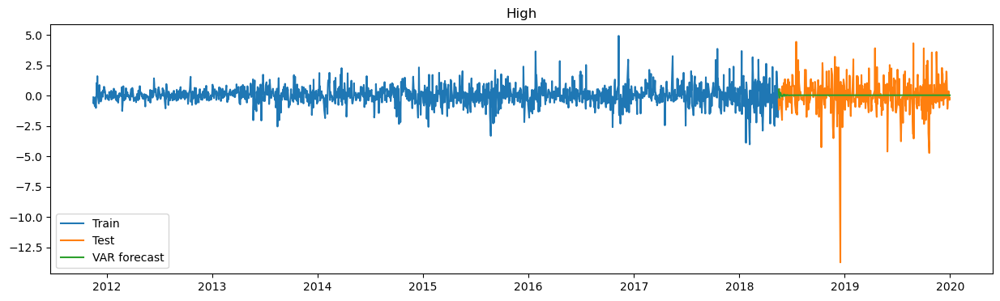

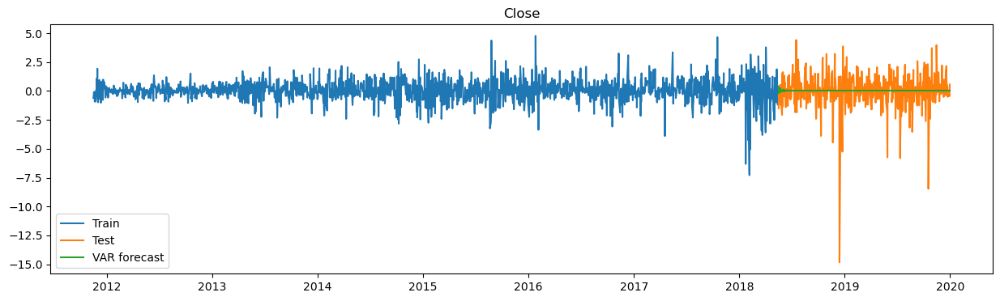

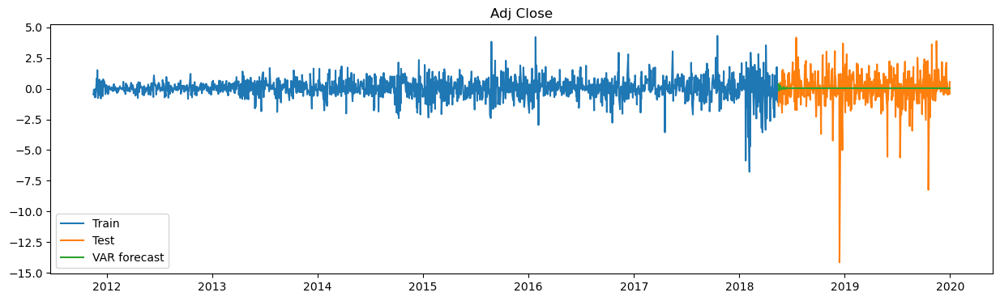

In [125]:
# Printing the train, test and forecasted values
for col in jnj_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(jnj_df_selected_diff[col][:train_len], label='Train')
    plt.plot(jnj_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

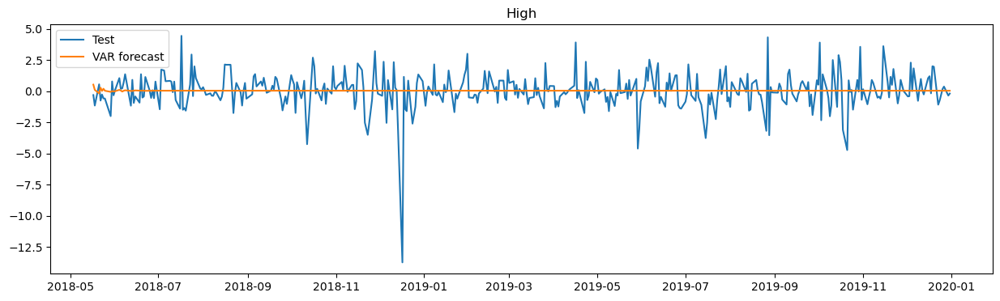

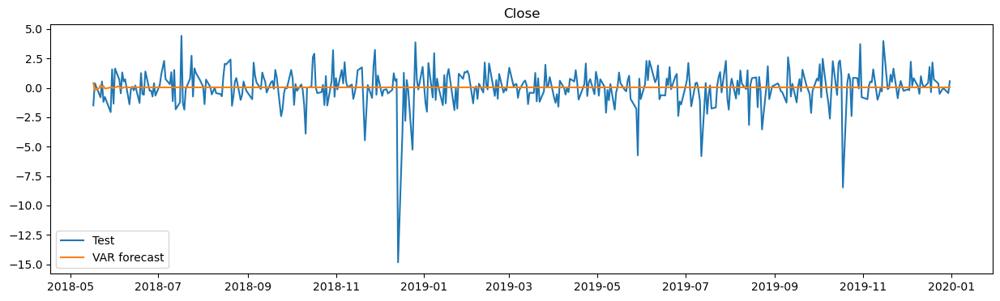

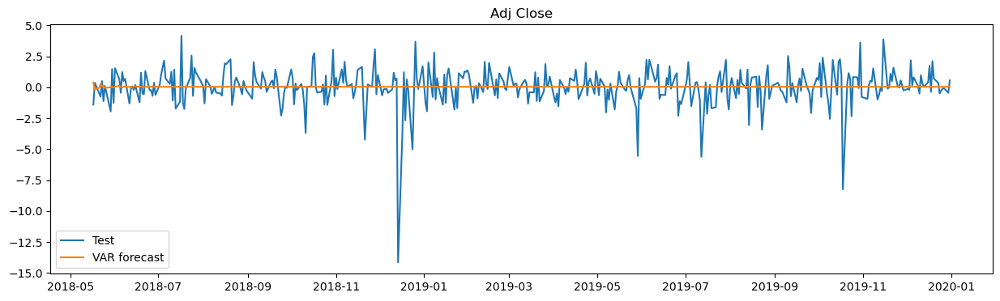

In [126]:
# Comparing the test and forecasted values
for col in jnj_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(jnj_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [127]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in jnj_df_selected_diff.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,High,1.45,-14.14
0,Close,1.58,inf
0,Adj Close,1.51,inf


## Amazon Stock prediction using VAR Model

In [128]:
# Get the technical indicators
amzn_with_ta = add_all_ta_features(stock_data['AMZN'], open="Open", high="High", low="Low", close="Close", volume="Volume")


In [129]:
# Create a dataframe with required variables
amzn_df = aapl_with_ta[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume','volume_vwap','trend_macd','momentum_rsi']]
amzn_df['SMA_50'] = ta.trend.SMAIndicator(close=amzn_df['Close'], window=50).sma_indicator()
amzn_df['SMA_200'] = ta.trend.SMAIndicator(close=amzn_df['Close'], window=200).sma_indicator()

In [130]:
amzn_df.isnull().sum()

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
volume_vwap      13
trend_macd       25
momentum_rsi     13
SMA_50           49
SMA_200         199
dtype: int64

In [131]:
amzn_df.dropna(inplace=True)

In [132]:
# Define the maximum lag for the test
max_lag = 10
target_column = 'Close'

for predictor_column in amzn_df.columns:
    if target_column != predictor_column:
        data = pd.concat([amzn_df[target_column], amzn_df[predictor_column]], axis=1)
        print(f"\nGranger Causality Test: {predictor_column} causes {target_column}")
        result = grangercausalitytests(data, max_lag, verbose=True)


Granger Causality Test: Open causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9792  , p=0.0845  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=2.9836  , p=0.0841  , df=1
likelihood ratio test: chi2=2.9814  , p=0.0842  , df=1
parameter F test:         F=2.9792  , p=0.0845  , df_denom=2040, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.8769  , p=0.0004  , df_denom=2037, df_num=2
ssr based chi2 test:   chi2=15.7924 , p=0.0004  , df=2
likelihood ratio test: chi2=15.7316 , p=0.0004  , df=2
parameter F test:         F=7.8769  , p=0.0004  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6381  , p=0.0123  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=10.9517 , p=0.0120  , df=3
likelihood ratio test: chi2=10.9225 , p=0.0122  , df=3
parameter F test:         F=3.6381  , p=0.0123  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4

ssr based F test:         F=0.1091  , p=0.7412  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=0.1093  , p=0.7410  , df=1
likelihood ratio test: chi2=0.1093  , p=0.7410  , df=1
parameter F test:         F=0.1091  , p=0.7412  , df_denom=2040, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9395  , p=0.0531  , df_denom=2037, df_num=2
ssr based chi2 test:   chi2=5.8934  , p=0.0525  , df=2
likelihood ratio test: chi2=5.8849  , p=0.0527  , df=2
parameter F test:         F=2.9395  , p=0.0531  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6496  , p=0.0007  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=17.0071 , p=0.0007  , df=3
likelihood ratio test: chi2=16.9366 , p=0.0007  , df=3
parameter F test:         F=5.6496  , p=0.0007  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.7653  , p=0.0008  , df_denom=2031, df_num=4
ssr based chi2

parameter F test:         F=0.0698  , p=0.9326  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8854  , p=0.1300  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=5.6756  , p=0.1285  , df=3
likelihood ratio test: chi2=5.6677  , p=0.1289  , df=3
parameter F test:         F=1.8854  , p=0.1300  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9997  , p=0.0920  , df_denom=2031, df_num=4
ssr based chi2 test:   chi2=8.0344  , p=0.0903  , df=4
likelihood ratio test: chi2=8.0186  , p=0.0909  , df=4
parameter F test:         F=1.9997  , p=0.0920  , df_denom=2031, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0295  , p=0.0716  , df_denom=2028, df_num=5
ssr based chi2 test:   chi2=10.2027 , p=0.0697  , df=5
likelihood ratio test: chi2=10.1773 , p=0.0704  , df=5
parameter F test:         F=2.0295  , p=0.0716  , df_denom=2028, df_num=5

Granger Causa

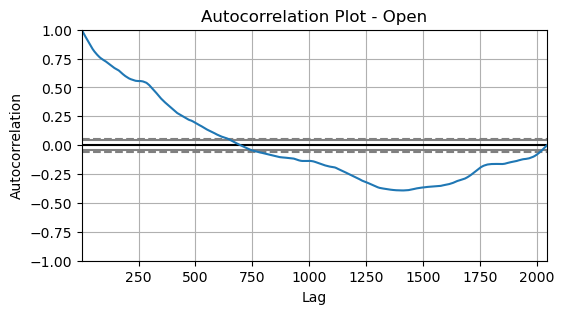

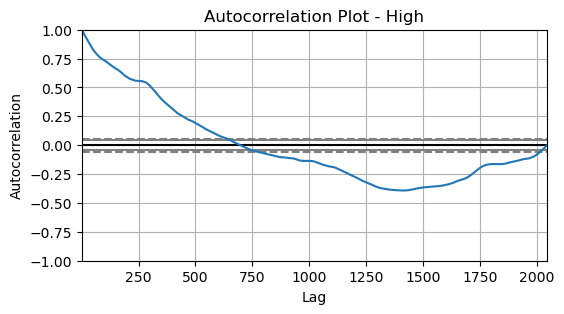

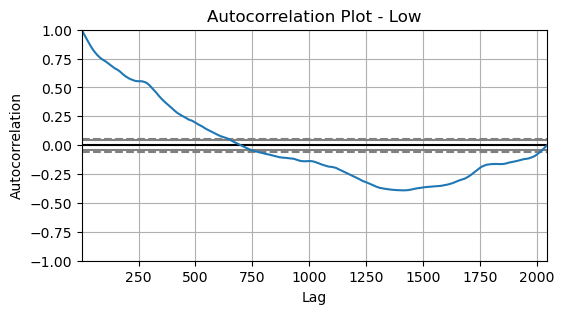

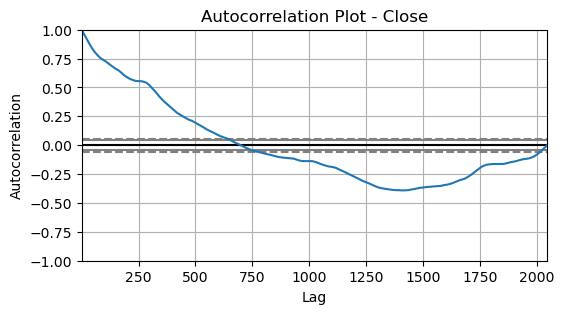

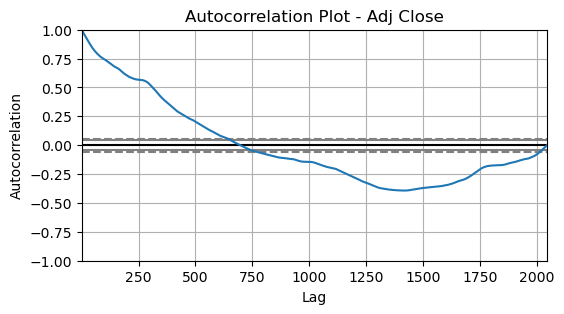

...

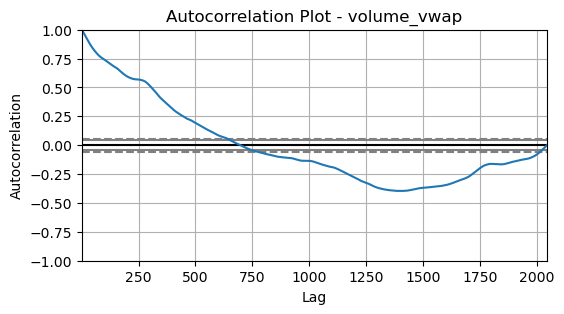

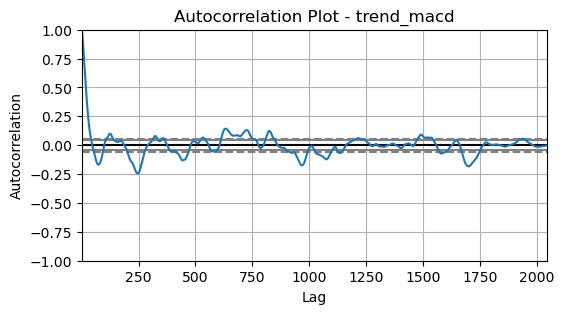

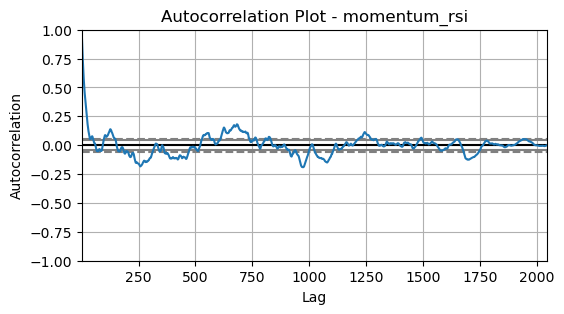

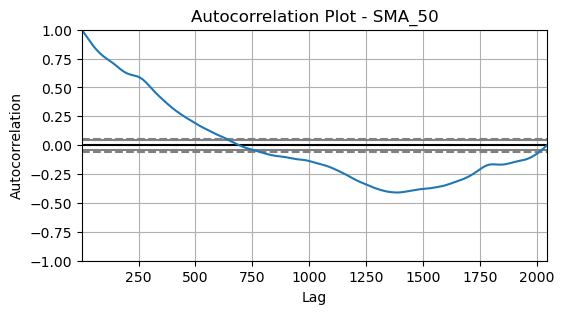

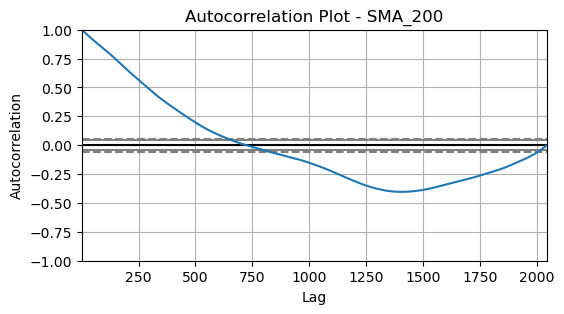

In [133]:
# Check the autocorrelation plots

from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt

for col in amzn_df.columns:
    plt.figure(figsize=(6,3))
    autocorrelation_plot(amzn_df[col])
    plt.title("Autocorrelation Plot - "+col)
    plt.show()

In [134]:
# Select features
amzn_df_selected = amzn_df[['Open','Adj Close','Close']]

In [135]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in amzn_df_selected.columns:
    adf_test = adfuller(amzn_df_selected[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Open : ADF Statistic: 1.0491, Critical Values @ 0.05: -2.8630,  p-value: 0.9948 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: 1.4663, Critical Values @ 0.05: -2.8630,  p-value: 0.9974 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: 1.2168, Critical Values @ 0.05: -2.8630,  p-value: 0.9961 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------


In [136]:
# Differentiate the data to check the stationarity
amzn_df_selected_diff = amzn_df_selected.diff()
amzn_df_selected_diff.dropna(inplace=True)

In [137]:
amzn_df_selected_diff.isnull().sum()

Open         0
Adj Close    0
Close        0
dtype: int64

In [138]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in amzn_df_selected_diff.columns:
    adf_test = adfuller(amzn_df_selected_diff[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Open : ADF Statistic: -11.1688, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: -13.5695, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -13.7280, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------


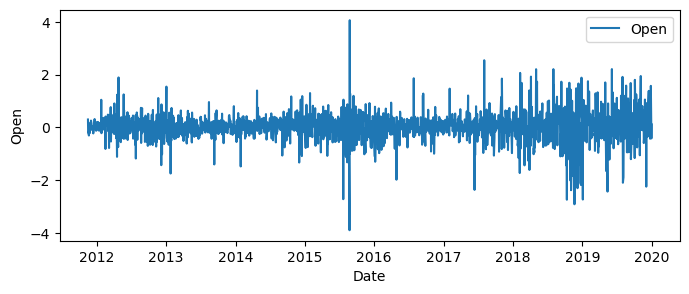

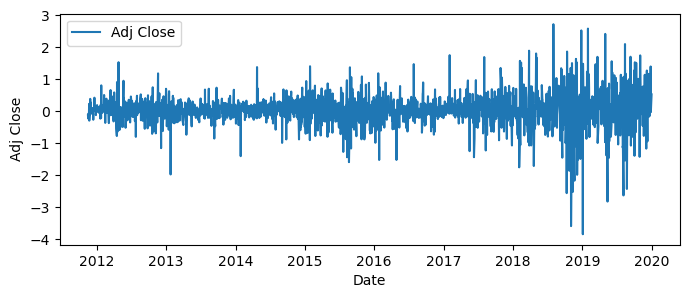

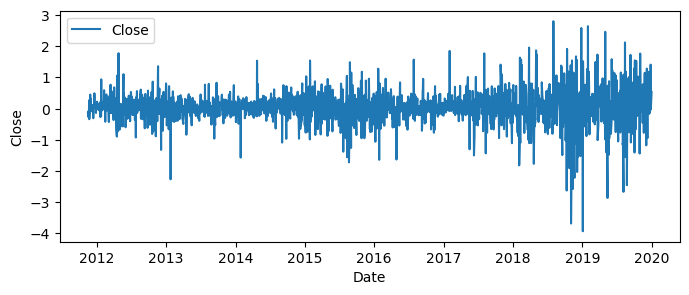

In [139]:
# Visualize the columns in the dataframe

for col in amzn_df_selected_diff.columns:
    plt.figure(figsize=(8, 3))
    plt.plot(amzn_df_selected_diff[col], label=col)
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.legend()
plt.show()

In [140]:
# Perform train-test split while preserving chronological order

train_len = int(amzn_df_selected_diff.shape[0]*0.8)
test_len = int(amzn_df_selected_diff.shape[0]) - int(amzn_df_selected_diff.shape[0]*0.8)

split_ratio = 0.8
split_index = int(split_ratio * len(aapl_df_selected_diff))
train_data = amzn_df_selected_diff.iloc[:split_index]
test_data = amzn_df_selected_diff.iloc[split_index:]

# Check the first few rows of train and test data
print("Train Data:")
print(train_data.head())
print("\nTest Data:")
print(test_data.head())

Train Data:
                Open  Adj Close     Close
Date                                     
2011-11-16  0.301786  -0.125299 -0.145000
2011-11-17 -0.188214  -0.227147 -0.262857
2011-11-18 -0.180715  -0.076226 -0.088214
2011-11-21 -0.304285  -0.183015 -0.211787
2011-11-22  0.022142   0.231468  0.267858

Test Data:
                Open  Adj Close     Close
Date                                     
2018-05-17  0.482498  -0.289055 -0.297497
2018-05-18 -0.202499  -0.165180 -0.170002
2018-05-21  0.202499   0.320641  0.330002
2018-05-22  0.095001  -0.114170 -0.117500
2018-05-23 -0.507499   0.291500  0.299999


In [141]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\Users\91902\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [142]:
# To select the lag order
x = model.select_order(maxlags=20)
x.summary()

,AIC,BIC,FPE,HQIC
0,-11.28,-11.27,1.260e-05,-11.28
1,-12.05,-12.01,5.828e-06,-12.04
2,-12.25,-12.18,4.766e-06,-12.23
3,-12.36,-12.26,4.305e-06,-12.32
4,-12.40,-12.27,4.131e-06,-12.35
5,-12.43,-12.27*,4.000e-06,-12.37
6,-12.46,-12.27,3.895e-06,-12.39
7,-12.48,-12.26,3.788e-06,-12.40
8,-12.50,-12.25,3.744e-06,-12.40
9,-12.52,-12.24,3.649e-06,-12.42*


In [143]:
# Providing maxlags as num with minimum AIC value
results = model.fit(maxlags = 20, ic = 'aic')

In [144]:
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 21, Aug, 2023
Time:                     11:00:09
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -12.1511
Nobs:                     1621.00    HQIC:                  -12.4020
Log likelihood:           3391.58    FPE:                3.54457e-06
AIC:                     -12.5501    Det(Omega_mle):     3.29461e-06
--------------------------------------------------------------------
Results for equation Open
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.007680         0.007118            1.079           0.281
L1.Open              -1.029009         0.030562          -33.669           0.000
L1.Adj Close          0.236719         0.338383            0.

In [145]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 13

In [146]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = amzn_df_selected_diff.index[train_len:], columns = amzn_df_selected_diff.columns)

#### Model evaluation

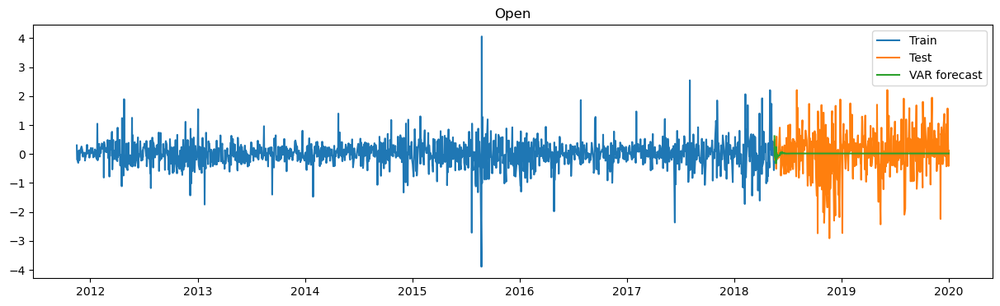

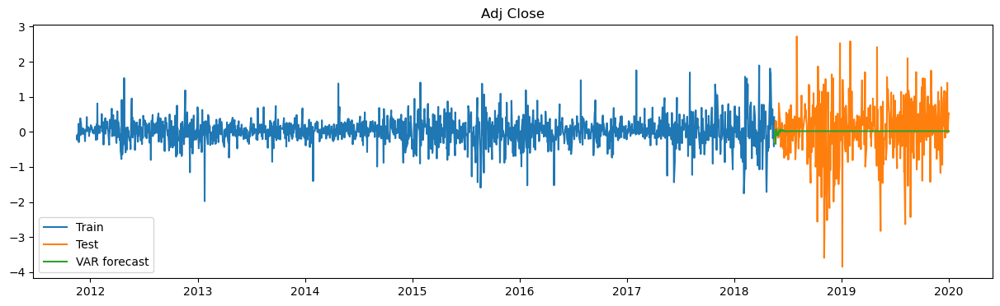

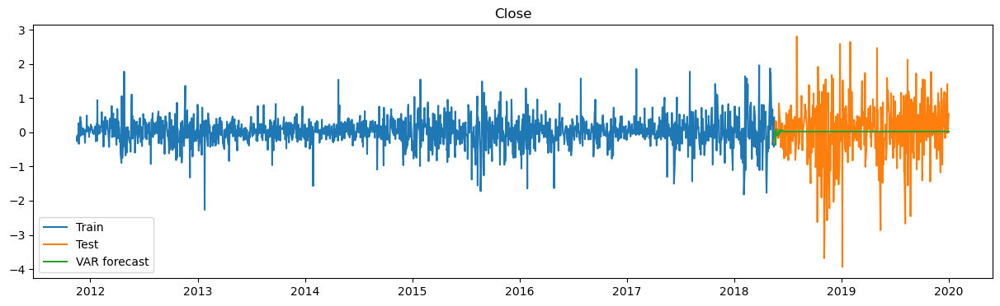

In [147]:
# Printing the train, test and forecasted values
for col in amzn_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(amzn_df_selected_diff[col][:train_len], label='Train')
    plt.plot(amzn_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

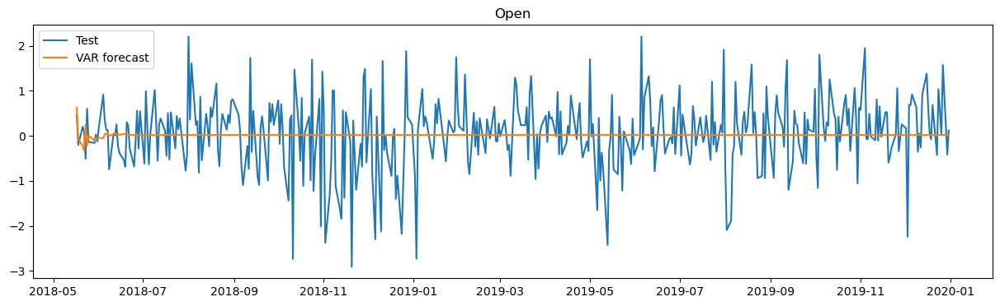

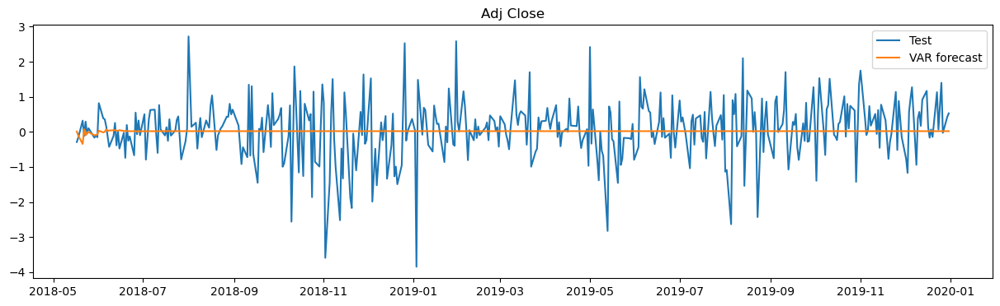

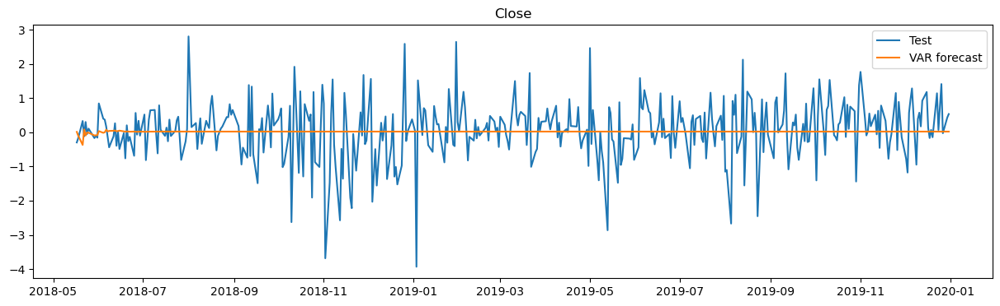

In [148]:
# Comparing the test and forecasted values
for col in amzn_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(amzn_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [149]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in amzn_df_selected_diff.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,Open,0.80,6.76
0,Adj Close,0.84,3.71
0,Close,0.85,3.38


### Merck Stock prediction using VAR Model

In [150]:
# Get the technical indicators
mrk_with_ta = add_all_ta_features(stock_data['MRK'], open="Open", high="High", low="Low", close="Close", volume="Volume")

In [151]:
# Create a dataframe with required variables
mrk_df = mrk_with_ta[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume','volume_vwap','trend_macd','momentum_rsi']]
mrk_df['SMA_50'] = ta.trend.SMAIndicator(close = mrk_df['Close'], window=50).sma_indicator()
mrk_df['SMA_200'] = ta.trend.SMAIndicator(close = mrk_df['Close'], window=200).sma_indicator()

In [152]:
mrk_df.isnull().sum()

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
volume_vwap      13
trend_macd       25
momentum_rsi     13
SMA_50           49
SMA_200         199
dtype: int64

In [153]:
mrk_df.dropna(inplace=True)

In [154]:
# Define the maximum lag for the test
max_lag = 10
target_column = 'Close'

for predictor_column in mrk_df.columns:
    if target_column != predictor_column:
        data = pd.concat([mrk_df[target_column], mrk_df[predictor_column]], axis=1)
        print(f"\nGranger Causality Test: {predictor_column} causes {target_column}")
        result = grangercausalitytests(data, max_lag, verbose=True)


Granger Causality Test: Open causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3771  , p=0.5392  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=0.3776  , p=0.5389  , df=1
likelihood ratio test: chi2=0.3776  , p=0.5389  , df=1
parameter F test:         F=0.3771  , p=0.5392  , df_denom=2040, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2705  , p=0.0382  , df_denom=2037, df_num=2
ssr based chi2 test:   chi2=6.5570  , p=0.0377  , df=2
likelihood ratio test: chi2=6.5465  , p=0.0379  , df=2
parameter F test:         F=3.2705  , p=0.0382  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5571  , p=0.1979  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=4.6875  , p=0.1962  , df=3
likelihood ratio test: chi2=4.6821  , p=0.1966  , df=3
parameter F test:         F=1.5571  , p=0.1979  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4

likelihood ratio test: chi2=9.5658  , p=0.2968  , df=8
parameter F test:         F=1.1885  , p=0.3019  , df_denom=2019, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.4149  , p=0.1759  , df_denom=2016, df_num=9
ssr based chi2 test:   chi2=12.8541 , p=0.1693  , df=9
likelihood ratio test: chi2=12.8136 , p=0.1712  , df=9
parameter F test:         F=1.4149  , p=0.1759  , df_denom=2016, df_num=9

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2665  , p=0.2439  , df_denom=2013, df_num=10
ssr based chi2 test:   chi2=12.7967 , p=0.2353  , df=10
likelihood ratio test: chi2=12.7566 , p=0.2376  , df=10
parameter F test:         F=1.2665  , p=0.2439  , df_denom=2013, df_num=10

Granger Causality Test: Volume causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2068  , p=0.2721  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=1.2085  , p=0.2716  , df=1
likelihood ratio test: chi2=1.2082  , 

parameter F test:         F=2.0352  , p=0.0391  , df_denom=2019, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.0480  , p=0.0310  , df_denom=2016, df_num=9
ssr based chi2 test:   chi2=18.6062 , p=0.0288  , df=9
likelihood ratio test: chi2=18.5216 , p=0.0296  , df=9
parameter F test:         F=2.0480  , p=0.0310  , df_denom=2016, df_num=9

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4550  , p=0.0065  , df_denom=2013, df_num=10
ssr based chi2 test:   chi2=24.8057 , p=0.0057  , df=10
likelihood ratio test: chi2=24.6557 , p=0.0060  , df=10
parameter F test:         F=2.4550  , p=0.0065  , df_denom=2013, df_num=10

Granger Causality Test: SMA_200 causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5055  , p=0.1136  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=2.5091  , p=0.1132  , df=1
likelihood ratio test: chi2=2.5076  , p=0.1133  , df=1
parameter F test:         F=2.5055  ,

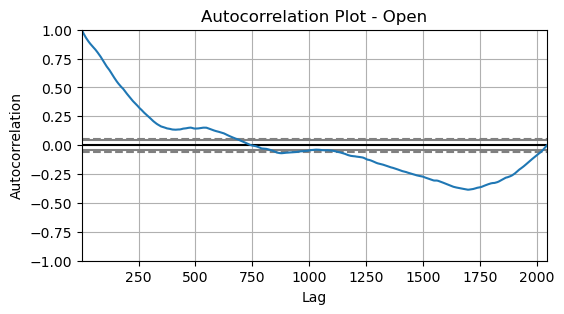

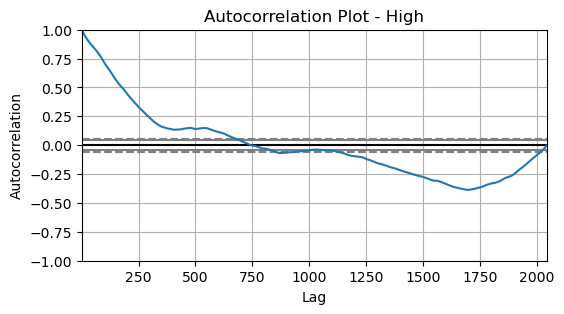

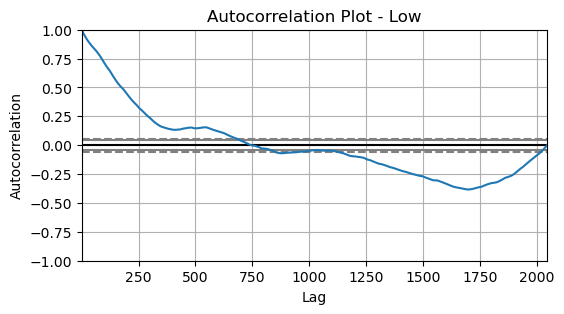

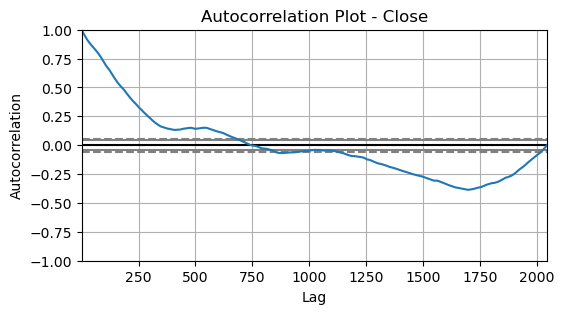

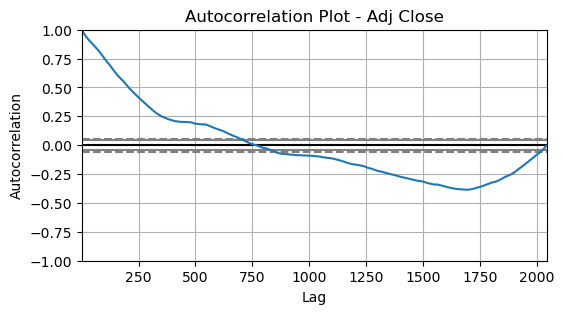

...

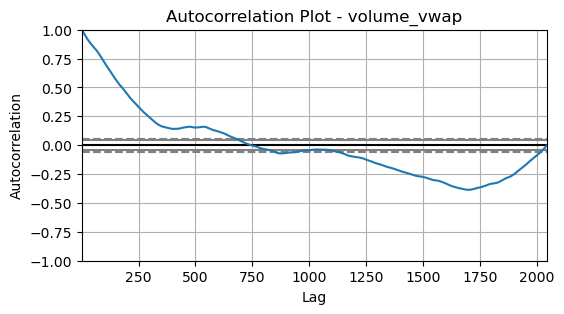

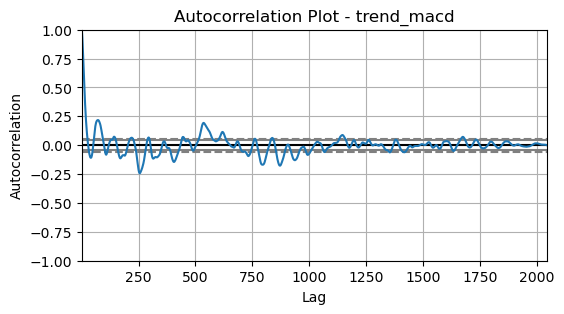

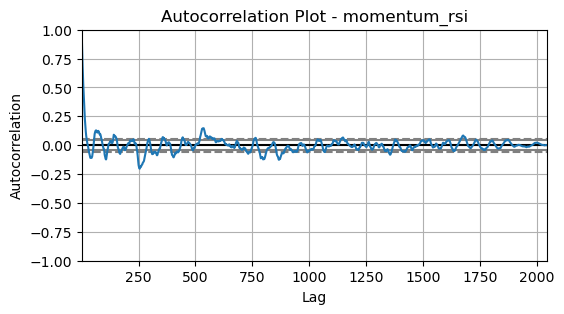

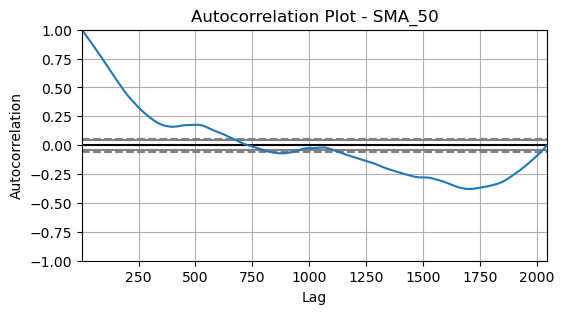

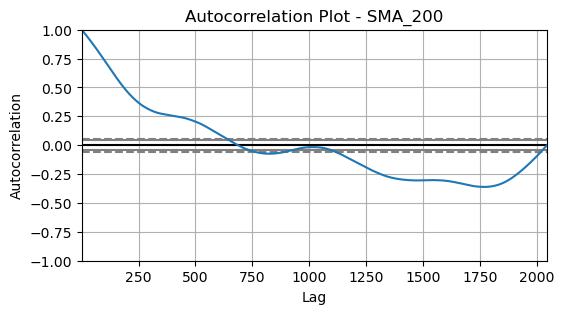

In [155]:
# Check the autocorrelation plots

from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt

for col in mrk_df.columns:
    plt.figure(figsize=(6,3))
    autocorrelation_plot(mrk_df[col])
    plt.title("Autocorrelation Plot - "+col)
    plt.show()

In [156]:
mrk_df_selected = mrk_df[['Adj Close','Low','Close']]

In [157]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in mrk_df_selected.columns:
    adf_test = adfuller(mrk_df_selected[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Adj Close : ADF Statistic: 0.1349, Critical Values @ 0.05: -2.8630,  p-value: 0.9684 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Low : ADF Statistic: -0.4118, Critical Values @ 0.05: -2.8630,  p-value: 0.9081 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -0.4891, Critical Values @ 0.05: -2.8630,  p-value: 0.8941 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------


In [158]:
# Differentiate the data to check the stationarity
mrk_df_selected_diff = mrk_df_selected.diff()
mrk_df_selected_diff.dropna(inplace=True)

In [159]:
mrk_df_selected_diff.isnull().sum()

Adj Close    0
Low          0
Close        0
dtype: int64

In [160]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in mrk_df_selected_diff.columns:
    adf_test = adfuller(mrk_df_selected_diff[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Adj Close : ADF Statistic: -33.7905, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Low : ADF Statistic: -22.4587, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -33.7733, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------


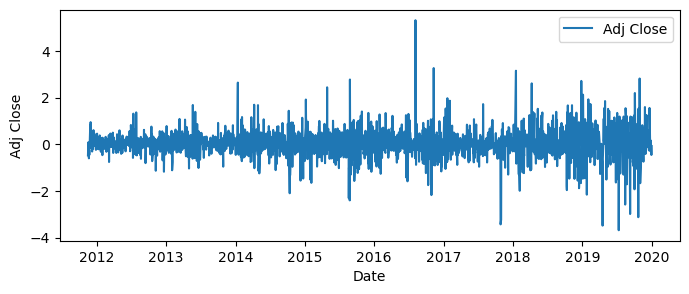

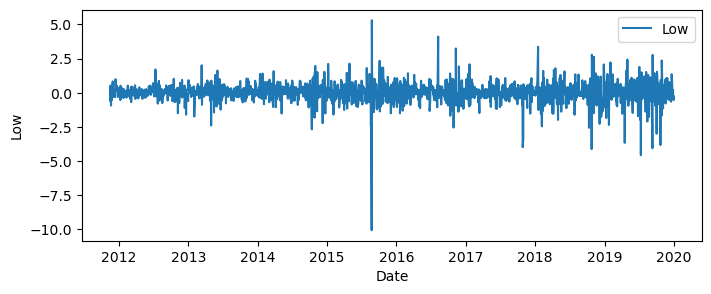

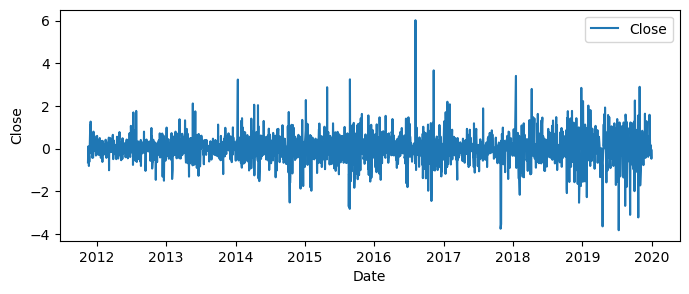

In [161]:
# Visualize the columns in the dataframe

for col in mrk_df_selected_diff.columns:
    plt.figure(figsize=(8, 3))
    plt.plot(mrk_df_selected_diff[col], label=col)
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.legend()
plt.show()

In [162]:
# Perform train-test split while preserving chronological order

train_len = int(mrk_df_selected_diff.shape[0]*0.8)
test_len = int(mrk_df_selected_diff.shape[0]) - int(mrk_df_selected_diff.shape[0]*0.8)

split_ratio = 0.8
split_index = int(split_ratio * len(mrk_df_selected_diff))
train_data = mrk_df_selected_diff.iloc[:split_index]
test_data = mrk_df_selected_diff.iloc[split_index:]

# Check the first few rows of train and test data
print("Train Data:")
print(train_data.head())
print("\nTest Data:")
print(test_data.head())

Train Data:
            Adj Close       Low     Close
Date                                     
2011-11-16  -0.476503 -0.310001 -0.640000
2011-11-17  -0.186138 -0.610001 -0.250000
2011-11-18   0.081905  0.520001  0.110001
2011-11-21  -0.603077 -0.939999 -0.810002
2011-11-22  -0.245706 -0.240002 -0.329998

Test Data:
            Adj Close       Low     Close
Date                                     
2018-05-17  -0.632920 -0.230000 -0.680000
2018-05-18   0.065155 -1.389999  0.069999
2018-05-21  -0.530533  0.899997 -0.569999
2018-05-22  -0.111686  0.010003 -0.119999
2018-05-23   0.670139  0.029998  0.719997


In [163]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\Users\91902\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [164]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-7.922,-7.912,0.0003626,-7.918
1,-8.344,-8.303,0.0002379,-8.329
2,-8.509,-8.438,0.0002016,-8.483
3,-8.554,-8.452,0.0001928,-8.516
4,-8.587,-8.454*,0.0001866,-8.537*
5,-8.594,-8.432,0.0001852,-8.534
6,-8.603,-8.410,0.0001835,-8.531
7,-8.614,-8.390,0.0001816,-8.531
8,-8.618,-8.364,0.0001808,-8.524
9,-8.620,-8.336,0.0001804,-8.515


In [165]:
# Providing maxlags as num with minimum AIC value
results = model.fit(maxlags = 20, ic = 'aic')

In [166]:
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 21, Aug, 2023
Time:                     11:00:18
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -8.34500
Nobs:                     1624.00    HQIC:                  -8.53923
Log likelihood:           206.829    FPE:                0.000174463
AIC:                     -8.65381    Det(Omega_mle):     0.000164841
--------------------------------------------------------------------
Results for equation Adj Close
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.023017         0.014141            1.628           0.104
L1.Adj Close          0.010460         0.244334            0.043           0.966
L1.Low                0.177224         0.037511         

In [167]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 10

In [168]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = mrk_df_selected_diff.index[train_len:], columns = mrk_df_selected_diff.columns)

#### Model evaluation

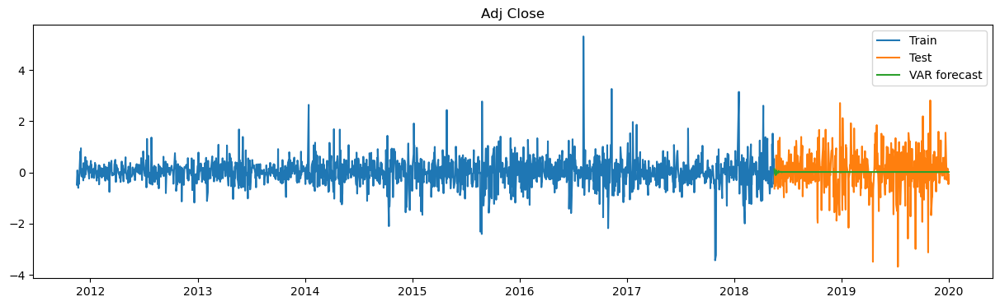

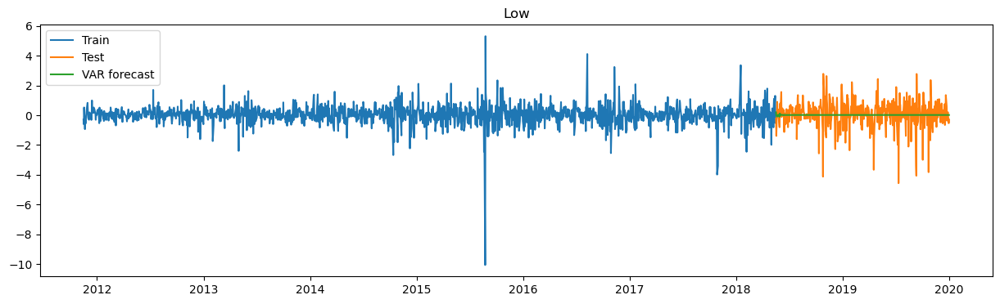

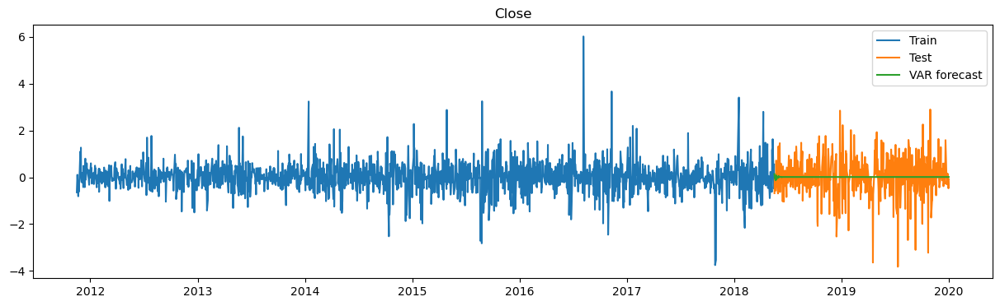

In [169]:
# Printing the train, test and forecasted values
for col in mrk_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(mrk_df_selected_diff[col][:train_len], label='Train')
    plt.plot(mrk_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

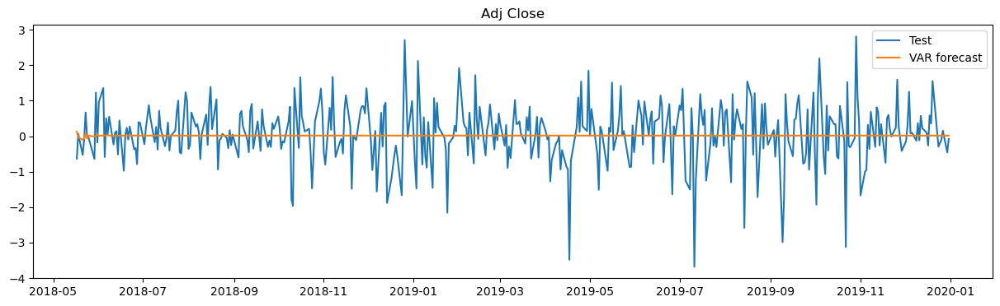

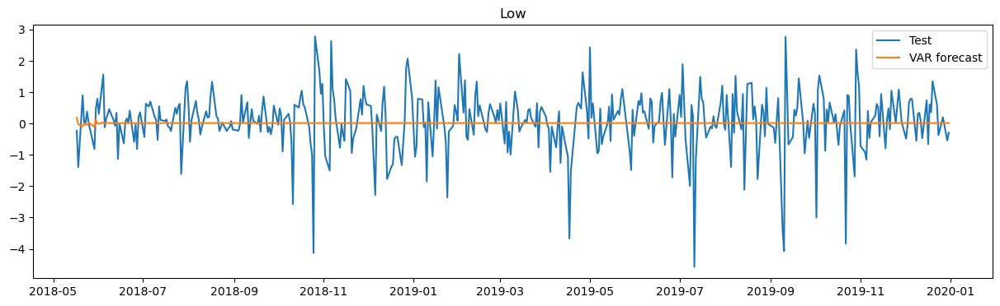

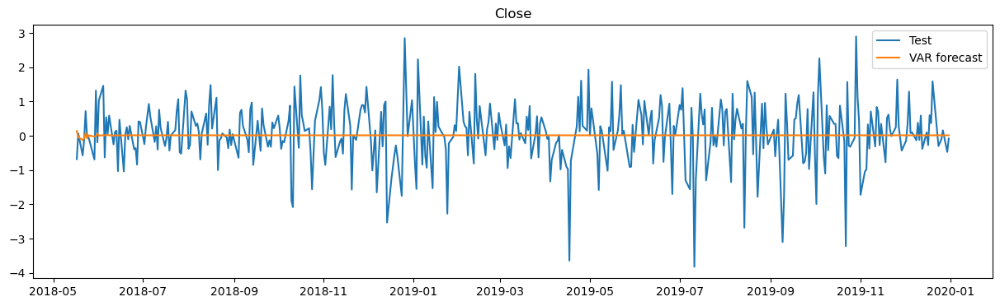

In [170]:
# Comparing the test and forecasted values
for col in mrk_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(mrk_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [171]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in mrk_df_selected_diff.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,Adj Close,0.84,inf
0,Low,0.94,inf
0,Close,0.89,inf


## Alaska Air Group Stock Prediction using VAR Model

In [172]:
# Get the technical indicators
alk_with_ta = add_all_ta_features(stock_data['ALK'], open="Open", high="High", low="Low", close="Close", volume="Volume")

In [173]:
# Create a dataframe with required variables
alk_df = aapl_with_ta[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume','volume_vwap','trend_macd','momentum_rsi']]
alk_df['SMA_50'] = ta.trend.SMAIndicator(close = alk_df['Close'], window=50).sma_indicator()
alk_df['SMA_200'] = ta.trend.SMAIndicator(close = alk_df['Close'], window=200).sma_indicator()

In [174]:
alk_df.isnull().sum()

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
volume_vwap      13
trend_macd       25
momentum_rsi     13
SMA_50           49
SMA_200         199
dtype: int64

In [175]:
alk_df.dropna(inplace=True)

In [176]:
# Define the maximum lag for the test
max_lag = 10
target_column = 'Close'

for predictor_column in alk_df.columns:
    if target_column != predictor_column:
        data = pd.concat([alk_df[target_column], alk_df[predictor_column]], axis=1)
        print(f"\nGranger Causality Test: {predictor_column} causes {target_column}")
        result = grangercausalitytests(data, max_lag, verbose=True)


Granger Causality Test: Open causes Close

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9792  , p=0.0845  , df_denom=2040, df_num=1
ssr based chi2 test:   chi2=2.9836  , p=0.0841  , df=1
likelihood ratio test: chi2=2.9814  , p=0.0842  , df=1
parameter F test:         F=2.9792  , p=0.0845  , df_denom=2040, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.8769  , p=0.0004  , df_denom=2037, df_num=2
ssr based chi2 test:   chi2=15.7924 , p=0.0004  , df=2
likelihood ratio test: chi2=15.7316 , p=0.0004  , df=2
parameter F test:         F=7.8769  , p=0.0004  , df_denom=2037, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6381  , p=0.0123  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=10.9517 , p=0.0120  , df=3
likelihood ratio test: chi2=10.9225 , p=0.0122  , df=3
parameter F test:         F=3.6381  , p=0.0123  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4

ssr based F test:         F=5.6496  , p=0.0007  , df_denom=2034, df_num=3
ssr based chi2 test:   chi2=17.0071 , p=0.0007  , df=3
likelihood ratio test: chi2=16.9366 , p=0.0007  , df=3
parameter F test:         F=5.6496  , p=0.0007  , df_denom=2034, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.7653  , p=0.0008  , df_denom=2031, df_num=4
ssr based chi2 test:   chi2=19.1455 , p=0.0007  , df=4
likelihood ratio test: chi2=19.0562 , p=0.0008  , df=4
parameter F test:         F=4.7653  , p=0.0008  , df_denom=2031, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2505  , p=0.0008  , df_denom=2028, df_num=5
ssr based chi2 test:   chi2=21.3678 , p=0.0007  , df=5
likelihood ratio test: chi2=21.2566 , p=0.0007  , df=5
parameter F test:         F=4.2505  , p=0.0008  , df_denom=2028, df_num=5

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.5865  , p=0.0015  , df_denom=2025, df_num=6
ssr based chi2

ssr based F test:         F=1.3170  , p=0.2302  , df_denom=2019, df_num=8
ssr based chi2 test:   chi2=10.6244 , p=0.2239  , df=8
likelihood ratio test: chi2=10.5968 , p=0.2256  , df=8
parameter F test:         F=1.3170  , p=0.2302  , df_denom=2019, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1836  , p=0.3010  , df_denom=2016, df_num=9
ssr based chi2 test:   chi2=10.7527 , p=0.2930  , df=9
likelihood ratio test: chi2=10.7244 , p=0.2951  , df=9
parameter F test:         F=1.1836  , p=0.3010  , df_denom=2016, df_num=9

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.1493  , p=0.3212  , df_denom=2013, df_num=10
ssr based chi2 test:   chi2=11.6124 , p=0.3118  , df=10
likelihood ratio test: chi2=11.5794 , p=0.3142  , df=10
parameter F test:         F=1.1493  , p=0.3212  , df_denom=2013, df_num=10


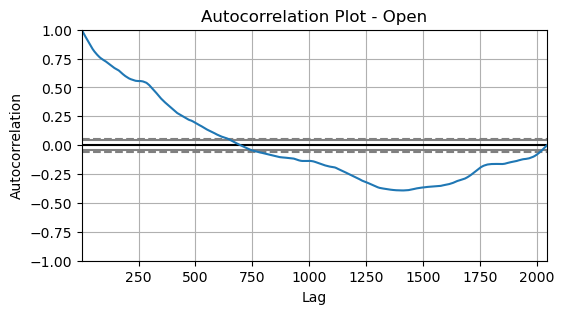

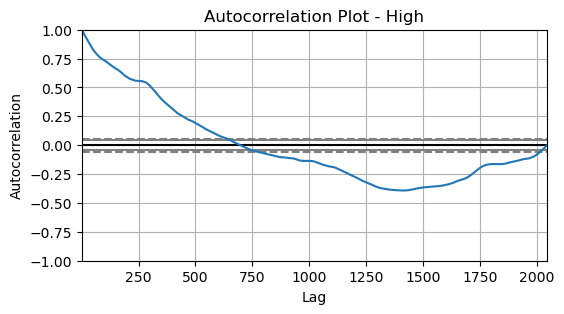

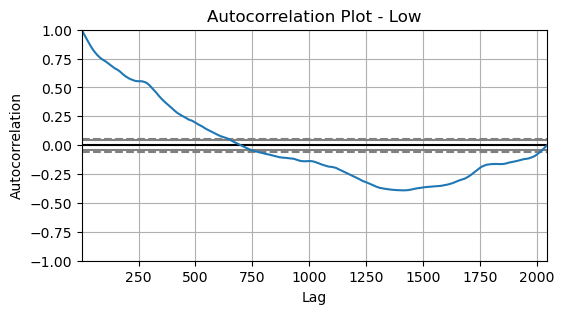

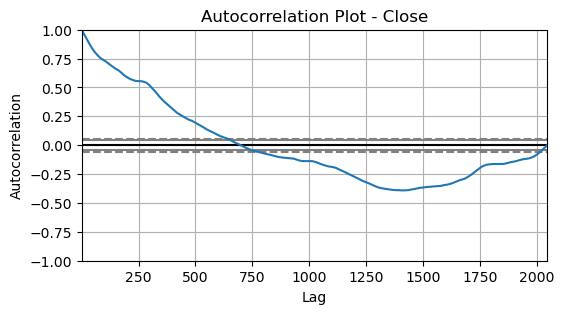

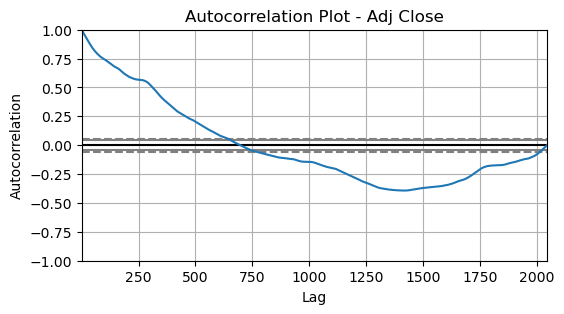

...

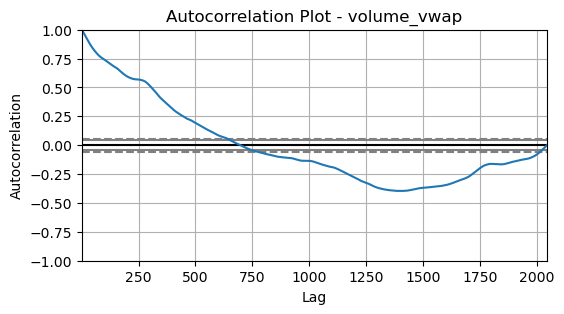

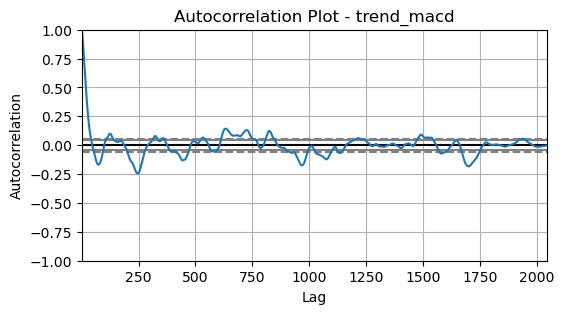

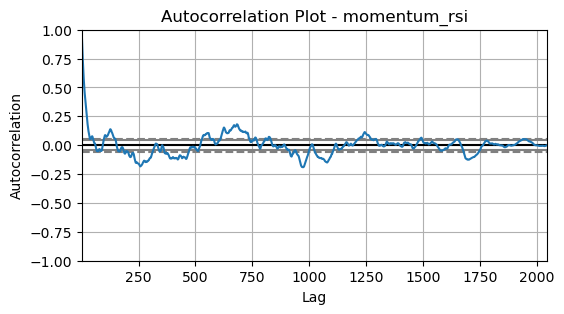

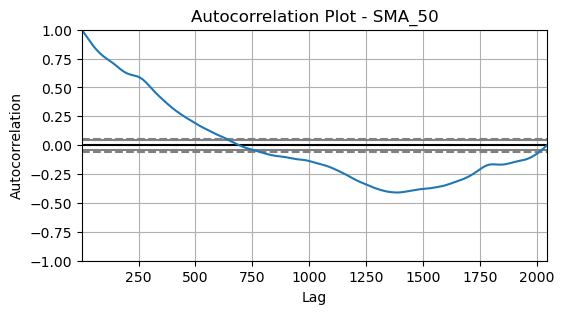

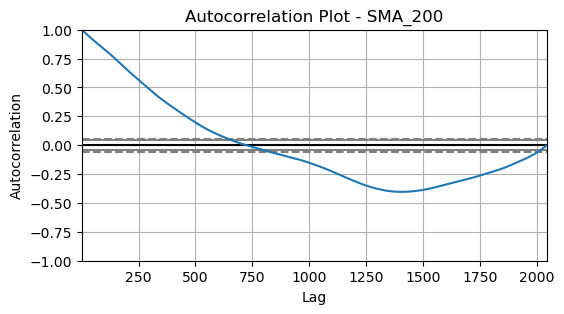

In [177]:
# Check the autocorrelation plots

from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt

for col in alk_df.columns:
    plt.figure(figsize=(6,3))
    autocorrelation_plot(alk_df[col])
    plt.title("Autocorrelation Plot - "+col)
    plt.show()

In [178]:
alk_df_selected = alk_df[['Open','Adj Close','Close']]

In [179]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in alk_df_selected.columns:
    adf_test = adfuller(alk_df_selected[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Open : ADF Statistic: 1.0491, Critical Values @ 0.05: -2.8630,  p-value: 0.9948 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: 1.4663, Critical Values @ 0.05: -2.8630,  p-value: 0.9974 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: 1.2168, Critical Values @ 0.05: -2.8630,  p-value: 0.9961 
Stationarity: Non Stationary
-----------------------------------------------------------------------------------------------------------------


In [180]:
# Differentiate the data to check the stationarity
alk_df_selected_diff = alk_df_selected.diff()
alk_df_selected_diff.dropna(inplace=True)

In [181]:
alk_df_selected_diff.isnull().sum()

Open         0
Adj Close    0
Close        0
dtype: int64

In [182]:
# The data should be stationary. Check the stationary through ADF test.

from statsmodels.tsa.stattools import adfuller

def check_stationarity(test_val):
    if test_val <= 0.05:
        return "Stationary"
    else:
        return "Non Stationary"

for col in alk_df_selected_diff.columns:
    adf_test = adfuller(alk_df_selected_diff[col])
    print(f'{col} : ADF Statistic: {adf_test[0]:.4f}, Critical Values @ 0.05: {adf_test[4]["5%"]:.4f},  p-value: {adf_test[1]:.4f} ')
    stationarity_result = check_stationarity(adf_test[1])
    print(f'Stationarity: {stationarity_result}')
    print('-----------------------------------------------------------------------------------------------------------------')

Open : ADF Statistic: -11.1688, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Adj Close : ADF Statistic: -13.5695, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------
Close : ADF Statistic: -13.7280, Critical Values @ 0.05: -2.8630,  p-value: 0.0000 
Stationarity: Stationary
-----------------------------------------------------------------------------------------------------------------


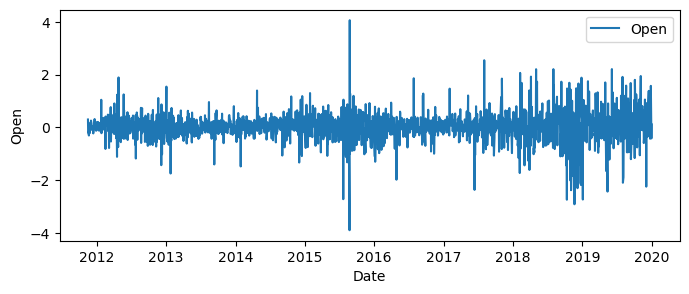

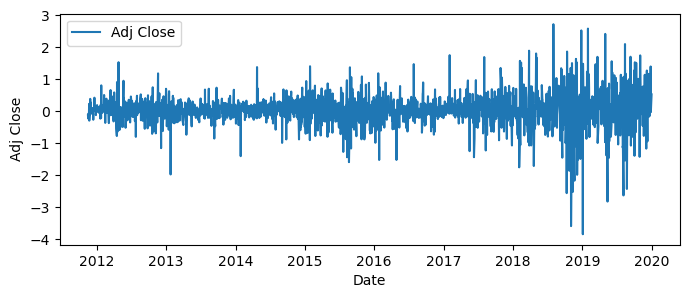

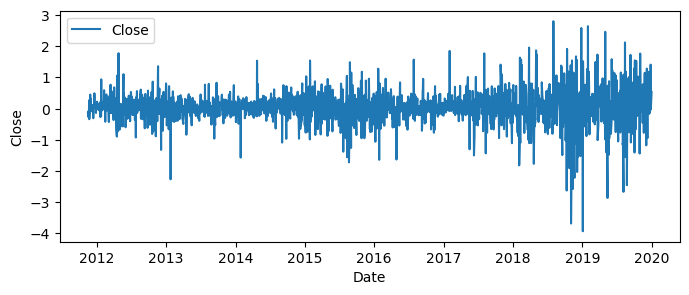

In [183]:
# Visualize the columns in the dataframe

for col in alk_df_selected_diff.columns:
    plt.figure(figsize=(8, 3))
    plt.plot(alk_df_selected_diff[col], label=col)
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.legend()
plt.show()

In [184]:
# Perform train-test split while preserving chronological order

train_len = int(alk_df_selected_diff.shape[0]*0.8)
test_len = int(alk_df_selected_diff.shape[0]) - int(alk_df_selected_diff.shape[0]*0.8)

split_ratio = 0.8
split_index = int(split_ratio * len(alk_df_selected_diff))
train_data = alk_df_selected_diff.iloc[:split_index]
test_data = alk_df_selected_diff.iloc[split_index:]

# Check the first few rows of train and test data
print("Train Data:")
print(train_data.head())
print("\nTest Data:")
print(test_data.head())

Train Data:
                Open  Adj Close     Close
Date                                     
2011-11-16  0.301786  -0.125299 -0.145000
2011-11-17 -0.188214  -0.227147 -0.262857
2011-11-18 -0.180715  -0.076226 -0.088214
2011-11-21 -0.304285  -0.183015 -0.211787
2011-11-22  0.022142   0.231468  0.267858

Test Data:
                Open  Adj Close     Close
Date                                     
2018-05-17  0.482498  -0.289055 -0.297497
2018-05-18 -0.202499  -0.165180 -0.170002
2018-05-21  0.202499   0.320641  0.330002
2018-05-22  0.095001  -0.114170 -0.117500
2018-05-23 -0.507499   0.291500  0.299999


In [185]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\Users\91902\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [186]:
# To select the lag order
x = model.select_order(maxlags=20)
x.summary()

,AIC,BIC,FPE,HQIC
0,-11.28,-11.27,1.260e-05,-11.28
1,-12.05,-12.01,5.828e-06,-12.04
2,-12.25,-12.18,4.766e-06,-12.23
3,-12.36,-12.26,4.305e-06,-12.32
4,-12.40,-12.27,4.131e-06,-12.35
5,-12.43,-12.27*,4.000e-06,-12.37
6,-12.46,-12.27,3.895e-06,-12.39
7,-12.48,-12.26,3.788e-06,-12.40
8,-12.50,-12.25,3.744e-06,-12.40
9,-12.52,-12.24,3.649e-06,-12.42*


In [187]:
# Providing maxlags as num with minimum AIC value
results = model.fit(maxlags = 20, ic = 'aic')

In [188]:
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 21, Aug, 2023
Time:                     11:00:30
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -12.1511
Nobs:                     1621.00    HQIC:                  -12.4020
Log likelihood:           3391.58    FPE:                3.54457e-06
AIC:                     -12.5501    Det(Omega_mle):     3.29461e-06
--------------------------------------------------------------------
Results for equation Open
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.007680         0.007118            1.079           0.281
L1.Open              -1.029009         0.030562          -33.669           0.000
L1.Adj Close          0.236719         0.338383            0.

In [189]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 13

In [190]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = alk_df_selected_diff.index[train_len:], columns = alk_df_selected_diff.columns)

### Model evaluation

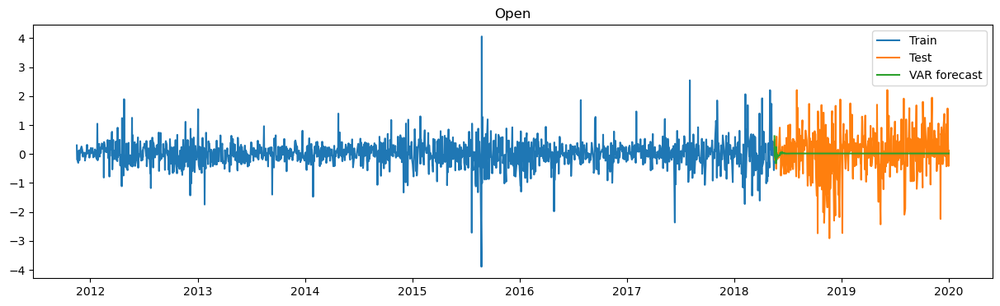

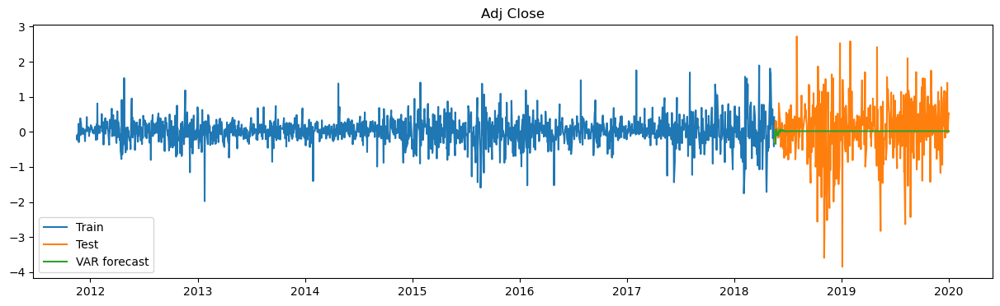

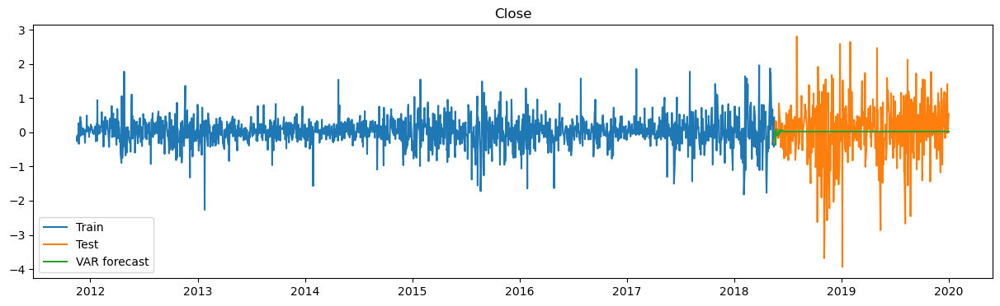

In [191]:
# Printing the train, test and forecasted values
for col in alk_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(alk_df_selected_diff[col][:train_len], label='Train')
    plt.plot(alk_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

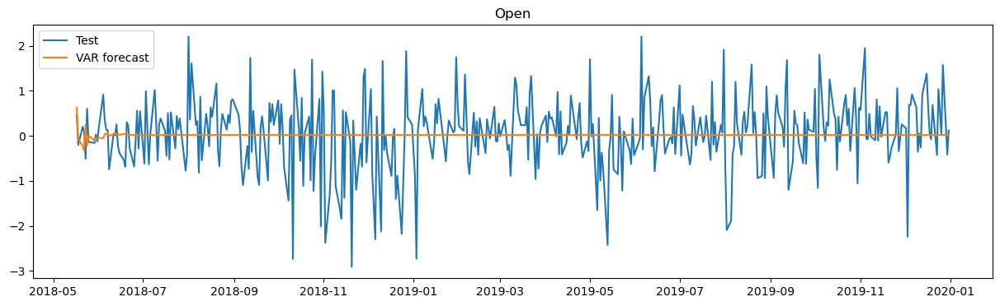

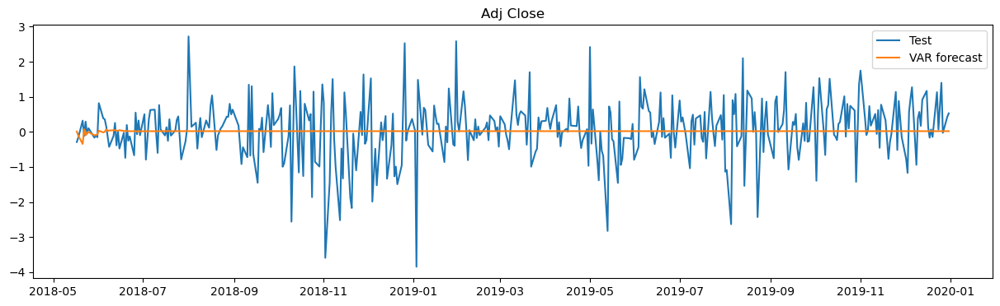

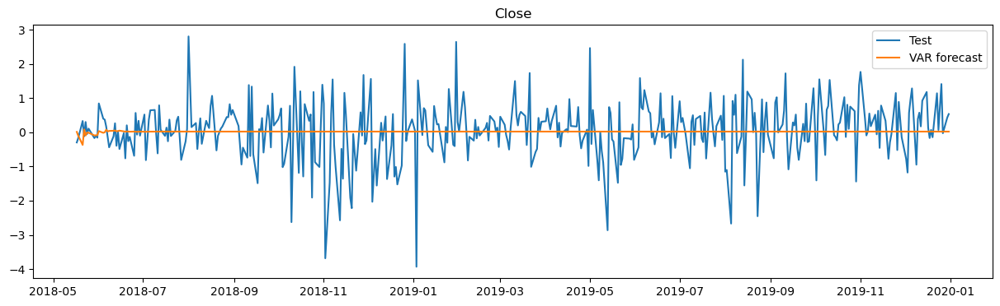

In [192]:
# Comparing the test and forecasted values
for col in alk_df_selected_diff.columns:
    plt.figure(figsize=(15,4))
    plt.plot(alk_df_selected_diff[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [193]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in alk_df_selected_diff.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,Open,0.80,6.76
0,Adj Close,0.84,3.71
0,Close,0.85,3.38
